In [1]:
import mne
from mne.datasets import fetch_fsaverage

# Setup fsaverage subject
fs_dir = fetch_fsaverage(verbose=True)
subjects_dir = fs_dir.parent
subject = 'fsaverage'
hemi = 'both'

# Load all labels from HCP-MMP1 parcellation
labels = mne.read_labels_from_annot(subject=subject,
                                    parc='aparc',
                                    hemi=hemi,
                                    subjects_dir=subjects_dir)

"""# Find label for R_25_ROI-rh
roi_name = 'R_25_ROI'
roi_label = [lab for lab in labels if roi_name in lab.name]
if not roi_label:
    raise ValueError(f"ROI '{roi_name}' not found in {hemi} hemisphere.")
roi_label = roi_label[0]

# Create a Brain object (inflated surface, medial view)
brain = mne.viz.Brain(subject=subject, hemi=hemi, surf='inflated', 
                      subjects_dir=subjects_dir, background='white', cortex='low_contrast',
                      size=(800, 600), views='medial')

# Add the ROI label with color (e.g., red)
brain.add_label(roi_label, color='red', borders=True)

# Show plot
brain.show()"""


0 files missing from root.txt in C:\Users\malann\mne_data\MNE-fsaverage-data
0 files missing from bem.txt in C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage
Reading labels from parcellation...
   read 35 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\lh.aparc.annot
   read 34 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\rh.aparc.annot


'# Find label for R_25_ROI-rh\nroi_name = \'R_25_ROI\'\nroi_label = [lab for lab in labels if roi_name in lab.name]\nif not roi_label:\n    raise ValueError(f"ROI \'{roi_name}\' not found in {hemi} hemisphere.")\nroi_label = roi_label[0]\n\n# Create a Brain object (inflated surface, medial view)\nbrain = mne.viz.Brain(subject=subject, hemi=hemi, surf=\'inflated\', \n                      subjects_dir=subjects_dir, background=\'white\', cortex=\'low_contrast\',\n                      size=(800, 600), views=\'medial\')\n\n# Add the ROI label with color (e.g., red)\nbrain.add_label(roi_label, color=\'red\', borders=True)\n\n# Show plot\nbrain.show()'

In [2]:
labels

[<Label | fsaverage, 'bankssts-lh', lh : 2137 vertices>,
 <Label | fsaverage, 'bankssts-rh', rh : 2196 vertices>,
 <Label | fsaverage, 'caudalanteriorcingulate-lh', lh : 1439 vertices>,
 <Label | fsaverage, 'caudalanteriorcingulate-rh', rh : 1608 vertices>,
 <Label | fsaverage, 'caudalmiddlefrontal-lh', lh : 3736 vertices>,
 <Label | fsaverage, 'caudalmiddlefrontal-rh', rh : 3494 vertices>,
 <Label | fsaverage, 'cuneus-lh', lh : 1630 vertices>,
 <Label | fsaverage, 'cuneus-rh', rh : 1638 vertices>,
 <Label | fsaverage, 'entorhinal-lh', lh : 1102 vertices>,
 <Label | fsaverage, 'entorhinal-rh', rh : 902 vertices>,
 <Label | fsaverage, 'frontalpole-lh', lh : 272 vertices>,
 <Label | fsaverage, 'frontalpole-rh', rh : 369 vertices>,
 <Label | fsaverage, 'fusiform-lh', lh : 4714 vertices>,
 <Label | fsaverage, 'fusiform-rh', rh : 4661 vertices>,
 <Label | fsaverage, 'inferiorparietal-lh', lh : 7871 vertices>,
 <Label | fsaverage, 'inferiorparietal-rh', rh : 9676 vertices>,
 <Label | fsavera

In [3]:
import os.path as op
import numpy as np
from scipy import stats as stats
from scipy.stats import pearsonr
from functools import partial

import mne
import matplotlib.pyplot as plt
from mne.minimum_norm import make_inverse_operator, apply_inverse, source_band_induced_power, apply_inverse_epochs,compute_source_psd, compute_source_psd_epochs
from mne.datasets import fetch_fsaverage
import pickle
from scipy.stats import sem
from mne import spatial_src_adjacency
from mne.stats import spatio_temporal_cluster_test, summarize_clusters_stc
import xarray as xr
import pandas as pd
# The files live in:
subjects_dir = 'C:/Users/malann/mne_data/MNE-fsaverage-data'
subject = "fsaverage"
trans = "fsaverage"  # MNE has a built-in fsaverage transformation
src_fname = subjects_dir+'/'+subject+"/bem"+"/fsaverage-ico-4-src.fif"
bem = subjects_dir+'/'+subject+"/bem"+"/fsaverage-5120-5120-5120-bem-sol.fif"
src = mne.read_source_spaces(src_fname)

import statsmodels.api as sm
import statsmodels.formula.api as smf
from mpl_toolkits.axes_grid1 import ImageGrid, inset_locator, make_axes_locatable


labels = mne.read_labels_from_annot(
        "fsaverage", "aparc", "both", subjects_dir=subjects_dir
    )
labels = [label for label in labels if 'unknown' not in label.name]


# Get valid vertices for both hemispheres
valid_verts = [[], []]
for label in labels:
    hemi_idx = 0 if label.hemi == 'lh' else 1
    valid_verts[hemi_idx].extend(label.vertices)

# Remove duplicates and sort
valid_verts = [np.array(sorted(set(valid_verts[0]))), np.array(sorted(set(valid_verts[1])))]


def mask_stc_vertices(stc, valid_verts):
    """Set data to zero for vertices not in the atlas."""
    masked_data = stc.data.copy()
    offset = 0  # to track row indices in stc.data

    for hemi_idx, hemi_verts in enumerate(stc.vertices):
        invalid_mask = ~np.isin(hemi_verts, valid_verts[hemi_idx])
        for idx, invalid in enumerate(invalid_mask):
            if invalid:
                masked_data[offset + idx, :] = 0  # set entire time/frequency row to zero
        offset += len(hemi_verts)

    stc._data = masked_data
    return stc



    Reading a source space...
    [done]
    Reading a source space...
    [done]
    2 source spaces read
Reading labels from parcellation...
   read 35 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\lh.aparc.annot
   read 34 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\rh.aparc.annot


In [4]:
pain_rating = {'PASP001':5,'PASP002':6,'PASP003':6,'PASP004':6,'PASP005':8,
               'PASP007':5,'PASP008':5,'PASP009':6.5,
               'PASP010':0, 'PASP011':7, 'PASP012':3.5, 'PASP013':4,
               'PASP014':5,'PASP015':3,
               'PASP016':7,'PASP017':3,'PASP019':7.5,'PASP020':2.5,
               'PASP021': 7,'PASP022':4,'PASP023':4.5,'PASP025':8, 
               'PASP026':5.5, 'PASP027':5,'PASP028':3,'PASP029':6, 'PASP030':7, 'PASP031':5.5,'PASP032':7,'PASP033': 4.5
               }
len(pain_rating)

#'PASP009':6.5,'PASP011':7,'PASP019':7.5, # removed for no alpha peak
# "PASP006", "PASP018" # no pain rating available

30

In [5]:
pain_rating.values()

dict_values([5, 6, 6, 6, 8, 5, 5, 6.5, 0, 7, 3.5, 4, 5, 3, 7, 3, 7.5, 2.5, 7, 4, 4.5, 8, 5.5, 5, 3, 6, 7, 5.5, 7, 4.5])

In [6]:
Control_list1 = ["PASC001", "PASC003", "PASC004", "PASC005", "PASC007", "PASC009", "PASC010",
                "PASC011", "PASC012", "PASC013", "PASC015", "PASC018",
                "PASC019", "PASC020", "PASC022", "PASC023", "PASC024", "PASC025", 
                "PASC027", "PASC028", "PASC029", "PASC030", "PASC032", "PASC033", 
                "PASC034", "PASC035", "PASC036", "PASC037", "PASC038", "PASC039", 
                "PASC040", "PASC041", "FASC004"]
#"PASC014"
Patient_list = ["PASP001", "PASP002", "PASP003", "PASP004", "PASP005", "PASP007", "PASP008", 
                "PASP010", "PASP012", "PASP013", "PASP014", "PASP015", "PASP016", 
                "PASP017", "PASP020", "PASP021", "PASP022", "PASP023", "PASP025", 
                "PASP026", "PASP027", "PASP028", "PASP029", "PASP030", "PASP031",
                "PASP032", "PASP033", "PASP006", "PASP018"]# "PASP009", "PASP011", "PASP019"]
#"PASP009", "PASP011", "PASP019", 

Camcan_list = ["CC121411","CC120218","CC220115","CC221886","CC221040","CC221511","CC220974",
               "CC221002","CC221585","CC221220","CC321137","CC320568","CC321595","CC320893",
               "CC320089","CC410323","CC420392","CC420236","CC420396","CC420433","CC410222",
               "CC410173","CC420148","CC410289","CC410297","CC510609","CC520168","CC510551",
               "CC510076","CC510115","CC620405"]

Camcan_list2 = ["CC120319","CC210519","CC221209","CC221595","CC223286","CC210088","CC220999",
                "CC220198","CC222496","CC221352","CC310410","CC320759","CC310463","CC320850",
                "CC320888","CC410015","CC420493","CC420060","CC420623","CC420202","CC420197",
                "CC410179","CC420462","CC410287","CC410243","CC520042","CC510629","CC510242",
                "CC510548","CC510433","CC610227"]


Mixed_list = ["CC320568","CC321595","CC320893","PASC005","CC320089","CC420236","CC420396",
            "PASC011","PASC012","PASC013","CC410173","CC420148","CC410289","PASC019",
            "PASC020","PASC022","PASC023","PASC027","CC510076",
            "PASC029","CC510115","PASC032","PASC033","CC620405","PASC036","PASC035",
            "PASC037","PASC038","PASC041","CC520168","CC510551"]


control_type = 'control'
if control_type == 'camcan':
    Control_list = Camcan_list
if control_type == 'camcan2':
    Control_list = Camcan_list2
if control_type == 'mixed':
    Control_list = Mixed_list
if control_type == 'control':
    Control_list = Control_list1


Control_list_MRI = ["PASC004", "PASC007", "PASC032", "PASC036", "PASC041", "PASC028"]

Patient_list_MRI = ["PASP001", "PASP002", "PASP004","PASP014", "PASP017", "PASP019", "PASP020",
                    "PASP021", "PASP022", "PASP023", "PASP028", "PASP029", "PASP030", "PASP031","PASP033"]
print(len(Patient_list))
print(len(Control_list))
print(len(Camcan_list))

# Step 5: Load the behavior data
p_beh_data = pd.read_excel("H:/E_drive/gifty_from_BS\MATLAB_codes/2024-06-19ParticipantReportedMeasuresv2.xlsx", sheet_name="PASP")
p_beh_data = p_beh_data[p_beh_data['id'].isin(Patient_list)].copy()

if control_type == 'control':
    c_beh_data = pd.read_excel("H:/E_drive/gifty_from_BS\MATLAB_codes/2024-06-19ParticipantReportedMeasuresv2.xlsx", sheet_name="PASC")
    c_beh_data = c_beh_data[c_beh_data['id'].isin(Control_list)].copy()
elif control_type == 'camcan':
    c_beh_data = pd.read_excel("H:/E_drive/gifty_from_BS\MATLAB_codes/2024-06-19ParticipantReportedMeasuresv2.xlsx", sheet_name="Camcan")
    c_beh_data = c_beh_data[c_beh_data['id'].isin(Control_list)].copy()
elif control_type == 'mixed':
    c_beh_data = pd.read_excel("H:/E_drive/gifty_from_BS\MATLAB_codes/2024-06-19ParticipantReportedMeasuresv2.xlsx", sheet_name="mixed")
    c_beh_data = c_beh_data[c_beh_data['id'].isin(Control_list)].copy()


# Optional: reset index for cleanliness
p_beh_data.reset_index(drop=True, inplace=True)
c_beh_data.reset_index(drop=True, inplace=True)

# Check the result
print(f"Matched patients: {len(p_beh_data)}")
print(f"Matched controls: {len(c_beh_data)}")


29
33
31
Matched patients: 29
Matched controls: 29


In [7]:
"""Control_list = [    "PASC011", "PASC041", "PASC032", "PASC036", "PASC020", "PASC037", "PASC029", 
                    "PASC035", "PASC033", "PASC013", "PASC005", "PASC019", "PASC027", "PASC022", 
                    "PASC023", "PASC038", "PASC012"]
#"PASC014"
Patient_list = ["PASP001", "PASP004", "PASP005", "PASP007", "PASP008", 
                "PASP010", "PASP012", "PASP015", "PASP016", 
                "PASP020", "PASP023", "PASP026", "PASP028", 
                "PASP029", "PASP030", "PASP033", "PASP006"]
"""
# Age and Gender Matched
Control_list_age = ["PASC038","PASC034","PASC011","PASC033",
                "PASC027","PASC013","PASC041","PASC035",
                "PASC037","PASC036","PASC029","PASC032",
                "PASC014","PASC022","PASC005","PASC020",
                "PASC019","PASC023","FASC004","PASC012"]
#,"PASC023"]

Patient_list_age = ["PASP030","PASP001","PASP005","PASP015",
                "PASP016","PASP026","PASP004","PASP008",
                "PASP012","PASP032","PASP027","PASP013",
                "PASP025","PASP033","PASP007","PASP029",
                "PASP023","PASP020","PASP018","PASP014"]
#,"PASP014"]

print(len(Control_list_age))
print(len(Patient_list_age))

20
20


In [8]:
import numpy as np
from scipy.stats import ttest_ind

# Ages from your table (19 pairs)
patient_ages = np.array([
    20, 27, 29, 36, 38, 38, 41, 51, 51, 62,
    45, 47, 44, 33, 36, 37, 38, 53, 58, 56
])

control_ages = np.array([
    19, 25, 29, 34, 34, 34, 38, 49, 50, 61,
    32, 30, 34, 31, 31, 39, 40, 32, 60, 32
])

# Welch’s t-test
t_stat, p_val = ttest_ind(patient_ages, control_ages, equal_var=False)

# Means and standard deviations
mean_patient = np.mean(patient_ages)
std_patient = np.std(patient_ages, ddof=1)
mean_control = np.mean(control_ages)
std_control = np.std(control_ages, ddof=1)

# Cohen's d
nx, ny = len(patient_ages), len(control_ages)
pooled_std = np.sqrt(((nx - 1) * std_patient**2 + (ny - 1) * std_control**2) / (nx + ny - 2))
cohens_d = (mean_patient - mean_control) / pooled_std

# Print results
print(f"T-statistic = {t_stat:.3f}, p = {p_val:.3f}")
print(f"Patients: mean = {mean_patient:.2f}, SD = {std_patient:.2f}")
print(f"Controls: mean = {mean_control:.2f}, SD = {std_control:.2f}")
print(f"Cohen's d = {cohens_d:.3f}")


T-statistic = 1.545, p = 0.131
Patients: mean = 42.00, SD = 10.95
Controls: mean = 36.70, SD = 10.75
Cohen's d = 0.489


In [9]:
# -------------------------------
# Analysis function
# -------------------------------
def run_analysis(control_list, patient_list, label="full", norm=False):
    print(f"\n--- Running {label} cohort analysis ---")

    control_stcs, control_PAF, control_PAF_power, control_stc_all, control_stcs_raw = {}, {}, {}, [], {}
    patient_stcs, patient_PAF, patient_PAF_power, patient_stc_all, patient_stcs_raw = {}, {}, {}, [], {}

    avg_stc_control, avg_stc_control1 = 0, 0
    avg_stc_patient, avg_stc_patient1 = 0, 0

    # Parameters
    if norm:
        nfl, nfh = 1, 40
    else:
        nfl, nfh = 6.8, 13.5  # normalization band for PAF power calculation
    fl, fh = 8, 12  # Alpha band
    bw = 0.5

    # -------------------------------
    # Controls
    # -------------------------------
    for sub in control_list:
        subjects_dir = "H:/E_drive/Freesurfer_Files"
        psd_dir = "H:/Pain_Project/Control_Source_PSDs/"
        fname_stc = psd_dir + sub + "_SPONT_2_psd_dSPM"

        subject = "fsaverage"
        stc = mne.read_source_estimate(fname_stc, subject=subject)

        if norm:
            stc = stc.copy().crop(nfl, nfh)
            stc_norm = stc.copy().sum()
            stc = 100 * stc / stc_norm.data
        else:
            stc_band = stc.copy().crop(nfl, nfh)
            stc_norm = stc_band.copy().sum()

        avg_stc_control += stc
        control_stc_all.append(stc)

        stc = mask_stc_vertices(stc, valid_verts)
        stc_alpha = stc.copy().crop(fl, fh)

        avg_stc_control1 += stc_alpha
        control_stcs_raw[sub] = stc_alpha
        control_stcs[sub] = stc_alpha.data

        # PAF
        source_time_max1 = np.multiply(stc_alpha.data, stc_alpha.times).sum(axis=1) / stc_alpha.data.sum(axis=1)
        source_vert_max1 = []

        for i in range(stc_alpha.data.shape[0]):
            idx_max = np.argmax(stc_alpha.data[i, :])
            paf_freq = stc_alpha.times[idx_max]
            freqs = stc_alpha.times
            in_bw = np.where((freqs >= paf_freq - bw) & (freqs <= paf_freq + bw))[0]
            paf_power_val = np.mean(stc_alpha.data[i, in_bw])
            if not norm:
                paf_power_val = 100 * paf_power_val / stc_norm.data[i]
            source_vert_max1.append(paf_power_val)

        control_PAF[sub] = np.nanmean(source_time_max1)
        control_PAF_power[sub] = np.nanmean(source_vert_max1)

    # -------------------------------
    # Patients
    # -------------------------------
    for sub in patient_list:
        subjects_dir = "H:/E_drive/Freesurfer_Files"
        psd_dir = "H:/Pain_Project/Patient_Source_PSDs/"
        fname_stc = psd_dir + sub + "_SPONT_2_psd_dSPM"

        subject = "fsaverage"
        stc = mne.read_source_estimate(fname_stc, subject=subject)

        if norm:
            stc = stc.copy().crop(nfl, nfh)
            stc_norm = stc.copy().sum()
            stc = 100 * stc / stc_norm.data
        else:
            stc_band = stc.copy().crop(nfl, nfh)
            stc_norm = stc_band.copy().sum()

        avg_stc_patient += stc
        patient_stc_all.append(stc)

        stc = mask_stc_vertices(stc, valid_verts)
        stc_alpha = stc.copy().crop(fl, fh)

        avg_stc_patient1 += stc_alpha
        patient_stcs_raw[sub] = stc_alpha
        patient_stcs[sub] = stc_alpha.data

        # PAF
        source_time_max1 = np.multiply(stc_alpha.data, stc_alpha.times).sum(axis=1) / stc_alpha.data.sum(axis=1)
        source_vert_max1 = []

        for i in range(stc_alpha.data.shape[0]):
            idx_max = np.argmax(stc_alpha.data[i, :])
            paf_freq = stc_alpha.times[idx_max]
            freqs = stc_alpha.times
            in_bw = np.where((freqs >= paf_freq - bw) & (freqs <= paf_freq + bw))[0]
            paf_power_val = np.mean(stc_alpha.data[i, in_bw])
            if not norm:
                paf_power_val = 100 * paf_power_val / stc_norm.data[i]
            source_vert_max1.append(paf_power_val)

        patient_PAF[sub] = np.nanmean(source_time_max1)
        patient_PAF_power[sub] = np.nanmean(source_vert_max1)

    # -------------------------------
    # Averages
    # -------------------------------
    avg_stc_control1 /= len(control_stc_all)
    avg_stc_control /= len(control_stc_all)
    avg_stc_patient /= len(patient_stc_all)
    avg_stc_patient1 /= len(patient_stc_all)

    print(f"Finished {label} cohort ✅")
    return (avg_stc_control1, avg_stc_control,
            avg_stc_patient1, avg_stc_patient,
            control_PAF, control_PAF_power,
            patient_PAF, patient_PAF_power,
           control_stc_all,patient_stc_all)

# -------------------------------
# Run both cohorts
# -------------------------------
results_full = run_analysis(Control_list[0:len(Patient_list)], Patient_list, label="full")
results_matched = run_analysis(Control_list_age, Patient_list_age, label="age-gender matched")



--- Running full cohort analysis ---


C:\Users\malann\AppData\Local\Temp\ipykernel_259580\2393844481.py:51: RuntimeWarning: invalid value encountered in divide
  source_time_max1 = np.multiply(stc_alpha.data, stc_alpha.times).sum(axis=1) / stc_alpha.data.sum(axis=1)
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\2393844481.py:97: RuntimeWarning: invalid value encountered in divide
  source_time_max1 = np.multiply(stc_alpha.data, stc_alpha.times).sum(axis=1) / stc_alpha.data.sum(axis=1)


Finished full cohort ✅

--- Running age-gender matched cohort analysis ---
Finished age-gender matched cohort ✅


In [10]:
# Unpack results if needed
(avg_stc_control1_full, avg_stc_control_full,
 avg_stc_patient1_full, avg_stc_patient_full,
 control_PAF_full, control_PAF_power_full,
 patient_PAF_full, patient_PAF_power_full,
 control_stc_all_full ,patient_stc_all_full) = results_full

(avg_stc_control1_matched, avg_stc_control_matched,
 avg_stc_patient1_matched, avg_stc_patient_matched,
 control_PAF_matched, control_PAF_power_matched,
 patient_PAF_matched, patient_PAF_power_matched,
 control_stc_all_matched ,patient_stc_all_matched) = results_matched

# -------------------------------
# Step 2: Match PAF data to behavior data
# -------------------------------
# c_beh_data and p_beh_data are your behavioral DataFrames with 'id' column

def match_beh_PAF(beh_data, PAF_dict, PAF_power_dict):
    matched_PAF = {}
    matched_PAF_power = {}
    
    for sub in beh_data['id']:
        if sub in PAF_dict:
            matched_PAF[sub] = PAF_dict[sub]
            matched_PAF_power[sub] = PAF_power_dict[sub]

    # Create DataFrame
    df = beh_data[beh_data['id'].isin(matched_PAF.keys())].copy()
    df['PAF'] = df['id'].map(matched_PAF)
    df['PAF_power'] = df['id'].map(matched_PAF_power)
    return df

# Full cohort
control_beh_full = match_beh_PAF(c_beh_data, control_PAF_full, control_PAF_power_full)
patient_beh_full = match_beh_PAF(p_beh_data, patient_PAF_full, patient_PAF_power_full)

# Age-gender matched cohort
control_beh_matched = match_beh_PAF(c_beh_data, control_PAF_matched, control_PAF_power_matched)
patient_beh_matched = match_beh_PAF(p_beh_data, patient_PAF_matched, patient_PAF_power_matched)


In [11]:
len(control_stc_all_full)

29

In [12]:
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm
import pandas as pd

# Step 1: Prepare the data
# Combine the PAF data with subject information (age, gender) for control and patient groups
control_beh_full['group'] = 'Control'  # Add group label for control
patient_beh_full['group'] = 'Patient'  # Add group label for patient

# Combine control and patient data into one dataframe for analysis
combined_data = pd.concat([control_beh_full[['id', 'age', 'female', 'PAF', 'PAF_power', 'group']],
                           patient_beh_full[['id', 'age', 'female', 'PAF', 'PAF_power', 'group']]])

# Step 2: Define the mixed model formula
# We will use 'group' as the independent variable and 'PAF' (or 'PAF_power') as the dependent variable.
# 'age' and 'gender' will be used as covariates.
# Random effects can be added if we have repeated measures for subjects, otherwise, we use a fixed effect model.

# For PAF comparison:

model_paf = mixedlm("PAF ~ group + age + female", data=combined_data, groups=combined_data["id"])
result_paf = model_paf.fit()

# Print results for PAF
print("PAF Comparison (Patient vs Control with Age and Gender as Covariates):")
print(result_paf.summary())

# Mixed model for PAF Power
model_paf_power = mixedlm("PAF_power ~ group  + age + female", data=combined_data, groups=combined_data["id"])
result_paf_power = model_paf_power.fit()

# Print results for PAF Power
print("\nPAF Power Comparison (Patient vs Control with Age and Gender as Covariates):")
print(result_paf_power.summary())



PAF Comparison (Patient vs Control with Age and Gender as Covariates):
             Mixed Linear Model Regression Results
Model:                 MixedLM    Dependent Variable:    PAF    
No. Observations:      56         Method:                REML   
No. Groups:            56         Scale:                 0.0209 
Min. group size:       1          Log-Likelihood:        -0.9047
Max. group size:       1          Converged:             Yes    
Mean group size:       1.0                                      
----------------------------------------------------------------
                 Coef.    Std.Err.      z    P>|z| [0.025 0.975]
----------------------------------------------------------------
Intercept         9.874        0.089 110.337 0.000  9.698 10.049
group[T.Patient] -0.204        0.072  -2.848 0.004 -0.345 -0.064
age               0.002        0.003   0.892 0.372 -0.003  0.008
female            0.057        0.028   2.017 0.044  0.002  0.112
Group Var         0.021 13720047.

C:\Users\malann\AppData\Local\Temp\ipykernel_259580\576038998.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='group', y='PAF_pred', data=combined_data, palette="Set2", ax=axes[0], order=group_order)
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\576038998.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  axes[0].set_title(f'Predicted PAF Comparison \n (Patient vs Control with Age and Gender Adjusted)\n(p = {result_paf.pvalues[1]:.3f})', fontsize=18, fontweight='bold')
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\576038998.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0

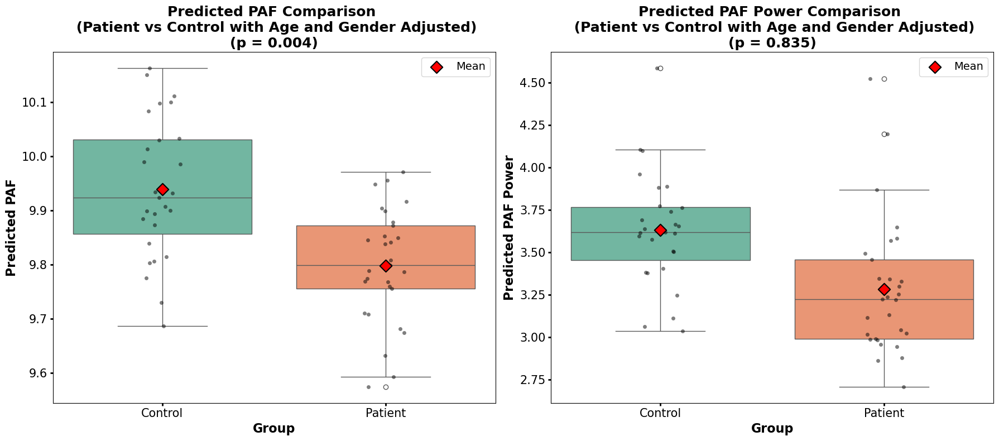

In [13]:
import statsmodels.api as sm
from statsmodels.formula.api import mixedlm
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Fit the mixed model for PAF
model_paf = mixedlm("PAF ~ group + age + female", data=combined_data, groups=combined_data["id"])
result_paf = model_paf.fit()
combined_data['PAF_pred'] = result_paf.fittedvalues

# Fit the mixed model for PAF Power
model_paf_power = mixedlm("PAF_power ~ group + age + female", data=combined_data, groups=combined_data["id"])
result_paf_power = model_paf_power.fit()
combined_data['PAF_power_pred'] = result_paf_power.fittedvalues

# Create the plot
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

group_order = combined_data['group'].unique()
x_positions = {group: i for i, group in enumerate(group_order)}

# PAF Plot
sns.boxplot(x='group', y='PAF_pred', data=combined_data, palette="Set2", ax=axes[0], order=group_order)
sns.stripplot(x='group', y='PAF_pred', data=combined_data, color='black', jitter=True, alpha=0.5, ax=axes[0], order=group_order)
axes[0].set_title(f'Predicted PAF Comparison \n (Patient vs Control with Age and Gender Adjusted)\n(p = {result_paf.pvalues[1]:.3f})', fontsize=18, fontweight='bold')
axes[0].set_xlabel('Group', fontsize=16, fontweight='bold')
axes[0].set_ylabel('Predicted PAF', fontsize=16, fontweight='bold')

# Add mean markers
group_means_paf = combined_data.groupby('group')['PAF_pred'].mean()
for group, mean_val in group_means_paf.items():
    axes[0].scatter(x_positions[group], mean_val, color='red', s=120, marker='D', edgecolor='black', linewidth=1.5, zorder=10, label='Mean' if group == group_order[0] else "")

axes[0].legend(loc='upper right', fontsize=14)

# PAF Power Plot
sns.boxplot(x='group', y='PAF_power_pred', data=combined_data, palette="Set2", ax=axes[1], order=group_order)
sns.stripplot(x='group', y='PAF_power_pred', data=combined_data, color='black', jitter=True, alpha=0.5, ax=axes[1], order=group_order)
axes[1].set_title(f'Predicted PAF Power Comparison \n (Patient vs Control with Age and Gender Adjusted)\n(p = {result_paf_power.pvalues[1]:.3f})', fontsize=18, fontweight='bold')
axes[1].set_xlabel('Group', fontsize=16, fontweight='bold')
axes[1].set_ylabel('Predicted PAF Power', fontsize=16, fontweight='bold')

group_means_power = combined_data.groupby('group')['PAF_power_pred'].mean()
for group, mean_val in group_means_power.items():
    axes[1].scatter(x_positions[group], mean_val, color='red', s=120, marker='D', edgecolor='black', linewidth=1.5, zorder=10, label='Mean' if group == group_order[0] else "")

axes[1].legend(loc='upper right', fontsize=14)

# Increase tick label font size
for ax in axes:
    ax.tick_params(axis='both', labelsize=15, width=2)

plt.tight_layout()
plt.show()


C:\Users\malann\AppData\Local\Temp\ipykernel_259580\1049130372.py:187: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(y='group', x='PAF', data=combined_data, palette=[control_color, patient_color], ax=ax2, orient='h', width=0.5)
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\1049130372.py:220: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='group', y='PAF_power', data=combined_data, palette=[control_color, patient_color], ax=ax3, showfliers=False)
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\1049130372.py:254: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


PAF: U = 566.000, p = 0.024
PAF control mean = 9.929, std = 0.2294284581064362
PAF Patient mean = 9.798, std = 0.1862457457006454
PAF Power: U = 585.000, p = 0.011
PAF Power control mean = 3.606, std = 0.60771244764328
PAF Power Patient mean = 3.283, std = 0.7015581727027893
PAF matched: U = 243.000, p = 0.250
PAF control mean matched= 9.892, std = 0.2635819883249592
PAF Patient mean matched= 9.814, std = 0.186492969279961
PAF Power matched: U = 279.000, p = 0.034
PAF Power control mean matched = 3.639, std = 0.6605420112609863
PAF Power Patient mean matched= 3.307, std = 0.7954272627830505
Cohen's d (PAF) matched: 0.341
Cohen's d (PAF Power) matched: 0.454


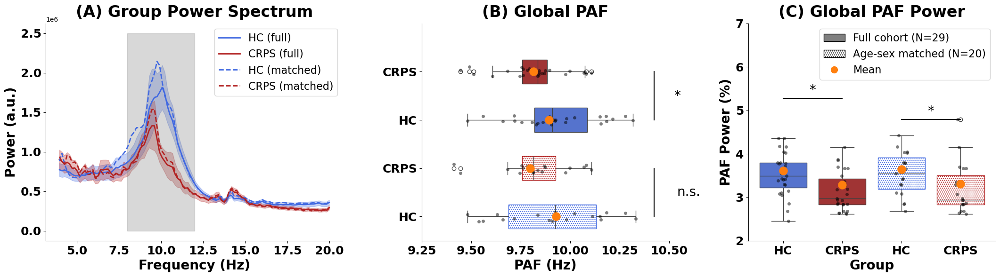

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import mannwhitneyu, sem
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

norm = False

patient_PAF_power_values = np.array(list(patient_PAF_power_full.values()))
control_PAF_power_values = np.array(list(control_PAF_power_full.values()))
patient_PAF_values = np.array(list(patient_PAF_full.values()))
control_PAF_values = np.array(list(control_PAF_full.values()))

patient_PAF_power_values_matched = np.array(list(patient_PAF_power_matched.values()))
control_PAF_power_values_matched = np.array(list(control_PAF_power_matched.values()))
patient_PAF_values_matched = np.array(list(patient_PAF_matched.values()))
control_PAF_values_matched = np.array(list(control_PAF_matched.values()))

# Number of subjects
n_control = len(control_PAF_values)
n_patient = len(patient_PAF_values)
n_control_matched = len(control_PAF_values_matched)
n_patient_matched = len(patient_PAF_values_matched)
# Create the combined DataFrame
combined_data = pd.DataFrame({
    'group': ['HC (full)'] * n_control + ['CRPS (full)'] * n_patient,
    'PAF': np.concatenate([control_PAF_values, patient_PAF_values]),
    'PAF_power': np.concatenate([control_PAF_power_values, patient_PAF_power_values])
})

matched_data = pd.DataFrame({
    'group': ['HC (matched)'] * n_control_matched + ['CRPS (matched)'] * n_patient_matched,
    'PAF': np.concatenate([control_PAF_values_matched, patient_PAF_values_matched]),
    'PAF_power': np.concatenate([control_PAF_power_values_matched, patient_PAF_power_values_matched])
})


# Colors
control_color = 'royalblue'
patient_color = 'firebrick'

# Frequency range
f1, f2 = 4, 20
freq = avg_stc_control_full.copy().crop(f1, f2).times

# Mean across time for each subject
c_sub_avg = np.array([stc.copy().crop(f1, f2).data.mean(axis=0) for stc in control_stc_all_full])
p_sub_avg = np.array([stc.copy().crop(f1, f2).data.mean(axis=0) for stc in patient_stc_all_full])

# Mean across time for each subject
c_sub_avg_matched = np.array([stc.copy().crop(f1, f2).data.mean(axis=0) for stc in control_stc_all_matched])
p_sub_avg_matched = np.array([stc.copy().crop(f1, f2).data.mean(axis=0) for stc in patient_stc_all_matched])

# Group stats
mean_control = np.mean(c_sub_avg, axis=0)
var_control = sem(c_sub_avg, axis=0)
mean_patient = np.mean(p_sub_avg, axis=0)
var_patient = sem(p_sub_avg, axis=0)

# Group stats
mean_control_matched = np.mean(c_sub_avg_matched, axis=0)
var_control_matched = sem(c_sub_avg_matched, axis=0)
mean_patient_matched = np.mean(p_sub_avg_matched, axis=0)
var_patient_matched = sem(p_sub_avg_matched, axis=0)

# Stats for PAF & PAF Power
control_data = combined_data[combined_data['group'] == 'HC (full)']
patient_data = combined_data[combined_data['group'] == 'CRPS (full)']
control_data_matched = matched_data[matched_data['group'] == 'HC (matched)']
patient_data_matched = matched_data[matched_data['group'] == 'CRPS (matched)']

t_stat_paf, p_val_paf = mannwhitneyu(control_data['PAF'], patient_data['PAF'])
t_stat_paf_power, p_val_paf_power = mannwhitneyu(control_data['PAF_power'], patient_data['PAF_power'])

t_stat_paf_matched, p_val_paf_matched = mannwhitneyu(control_data_matched['PAF'], patient_data_matched['PAF'])
t_stat_paf_power_matched, p_val_paf_power_matched = mannwhitneyu(control_data_matched['PAF_power'], patient_data_matched['PAF_power'])

from scipy.stats import ttest_ind


mean_control_paf = control_data['PAF'].mean()
mean_patient_paf = patient_data['PAF'].mean()
sd_patient_paf = np.std(patient_PAF_values, ddof=1)  # Sample standard deviation
sd_control_paf = np.std(control_PAF_values, ddof=1)  # Sample standard deviation

mean_control_power = control_data['PAF_power'].mean()
mean_patient_power = patient_data['PAF_power'].mean()
sd_patient_paf_power = np.std(patient_PAF_power_values, ddof=1)  # Sample standard deviation
sd_control_paf_power = np.std(control_PAF_power_values, ddof=1)  # Sample standard deviation


mean_control_paf_matched = control_data_matched['PAF'].mean()
mean_patient_paf_matched = patient_data_matched['PAF'].mean()
sd_patient_paf_matched = np.std(patient_PAF_values_matched, ddof=1)  # Sample standard deviation
sd_control_paf_matched = np.std(control_PAF_values_matched, ddof=1)  # Sample standard deviation

mean_control_power_matched = control_data_matched['PAF_power'].mean()
mean_patient_power_matched = patient_data_matched['PAF_power'].mean()
sd_patient_paf_power_matched = np.std(patient_PAF_power_values_matched, ddof=1)  # Sample standard deviation
sd_control_paf_power_matched = np.std(control_PAF_power_values_matched, ddof=1)  # Sample standard deviation

# Plot
fig, axes = plt.subplots(1, 3, figsize=(26,6), gridspec_kw={'width_ratios': [1.2, 1, 1]})
label_fontsize = 20
tick_fontsize = 18
title_fontsize = 24
annotation_fontsize = 20
legend_fontsize = 16

# Remove outliers based on IQR method
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    return df[(df[column] >= Q1 - 1.5 * IQR) & (df[column] <= Q3 + 1.5 * IQR)]

combined_data = remove_outliers(combined_data, 'PAF_power')
combined_data = remove_outliers(combined_data, 'PAF')
matched_data = remove_outliers(matched_data, 'PAF_power')
matched_data = remove_outliers(matched_data, 'PAF')

# (A) Spectrum Plot
ax1 = axes[0]
ax1.plot(freq, mean_control, label='HC (full)', color=control_color, linewidth=2)
ax1.plot(freq, mean_patient, label='CRPS (full)', color=patient_color, linewidth=2)
ax1.plot(freq, mean_control_matched, label='HC (matched)', color=control_color, linewidth=2, linestyle='--')
ax1.plot(freq, mean_patient_matched, label='CRPS (matched)', color=patient_color, linewidth=2, linestyle='--')


ax1.fill_between(freq, mean_control + var_control, mean_control - var_control, alpha=0.3, color=control_color)
ax1.fill_between(freq, mean_patient + var_patient, mean_patient - var_patient, alpha=0.3, color=patient_color)


if norm ==True:
    ax1.fill_betweenx(np.linspace(0, 1.6e0, 100), 8, 12, color='gray', alpha=0.3)
if norm ==False:
    ax1.fill_betweenx(np.linspace(0, 2.5e6, 100), 8, 12, color='gray', alpha=0.3)


ax1.set_xlabel('Frequency (Hz)', fontsize=label_fontsize, weight='bold')
ax1.set_ylabel('Power (a.u.)', fontsize=label_fontsize, weight='bold')
ax1.set_title('(A) Group Power Spectrum', fontsize=title_fontsize, weight='bold', pad=10)
ax1.legend(fontsize=legend_fontsize)
ax1.tick_params(axis='both', labelsize=tick_fontsize)
#ax1.spines[['top', 'right']].set_visible(False)

mean_color = '#FF7F0E'  # Dark orange for mean dots



# Prepare matched data
# Make sure both dataframes have same columns
full_df = combined_data[['group', 'PAF']].copy()
full_df['cohort'] = 'Full'

matched_df = matched_data[['group', 'PAF']].copy()
matched_df['cohort'] = 'Matched'

# Concatenate
plot_data = pd.concat([full_df, matched_df], ignore_index=True)

# Convert group to string (important!)
plot_data['group'] = plot_data['group'].astype(str)


# (B) PAF Boxplot - Horizontal
ax2 = axes[1]


matched_data["group_offset"] = matched_data["group"].map({"HC (matched)": 0, "CRPS (matched)": 1})

# HC (matched)
sns.boxplot(y='group_offset', x='PAF', data=matched_data[matched_data['group']=="HC (matched)"],
            ax=ax2, orient='h', width=0.5,
            boxprops=dict(facecolor='white', hatch='....', edgecolor=control_color))

# CRPS (matched)
sns.boxplot(y='group_offset', x='PAF', data=matched_data[matched_data['group']=="CRPS (matched)"],
            ax=ax2, orient='h', width=0.5,
            boxprops=dict(facecolor='white', hatch='....', edgecolor=patient_color))
sns.stripplot(y='group_offset', x='PAF', data=matched_data, color='black', jitter=True, alpha=0.5, ax=ax2, orient='h')

combined_data["group"] = combined_data["group"].map({"HC (full)": 2, "CRPS (full)": 3})

# Create the boxplot for C and P with proper shifts
sns.boxplot(y='group', x='PAF', data=combined_data, palette=[control_color, patient_color], ax=ax2, orient='h', width=0.5)
sns.stripplot(y='group', x='PAF', data=combined_data, color='black', jitter=True, alpha=0.5, ax=ax2, orient='h')

ax2.scatter(mean_control_paf, 0, color=mean_color, s=150, zorder=5, label='Mean')  
ax2.scatter(mean_patient_paf, 1, color=mean_color, s=150, zorder=5)  

# Add mean markers
ax2.scatter(mean_control_paf_matched, 2, color=mean_color, s=150, zorder=5)
ax2.scatter(mean_patient_paf_matched, 3, color=mean_color, s=150, zorder=5)

# Adjust significance bar and text positioning
x_max_paf = max(combined_data["PAF"]) * 1.02
ax2.plot([x_max_paf-0.1, x_max_paf-0.1], [0, 1], color='black', linewidth=1.5)
ax2.plot([x_max_paf-0.1, x_max_paf-0.1], [2, 3], color='black', linewidth=1.5)
ax2.text(x_max_paf + 0.001, 2.5, '*' if p_val_paf < 0.05 else 'n.s.', va='center', fontsize=annotation_fontsize)
ax2.text(max(matched_data["PAF"]) * 1.02 + 0.001, 0.5, '*' if p_val_paf_matched < 0.05 else 'n.s.', va='center', fontsize=annotation_fontsize)

# Set the y-ticks to show C at 0.5 and P at 1
ax2.set_yticks([0, 1, 2, 3 ])
ax2.set_yticklabels(['HC', 'CRPS', 'HC', 'CRPS'])

# Aesthetics
ax2.set_xlim(9.25, 10.5)
ax2.set_title('(B) Global PAF', fontsize=title_fontsize, weight='bold', pad=10)
ax2.set_xlabel('PAF (Hz)', fontsize=label_fontsize, weight='bold')
ax2.set_ylabel('')
ax2.tick_params(axis='both', labelsize=tick_fontsize)
ax2.set_ylim(-0.5,4)


# (C) PAF Power Boxplot
# (C) PAF Power Boxplot with outliers removed
ax3 = axes[2]
sns.boxplot(x='group', y='PAF_power', data=combined_data, palette=[control_color, patient_color], ax=ax3, showfliers=False)
sns.stripplot(x='group', y='PAF_power', data=combined_data, color='black', jitter=True, alpha=0.5, ax=ax3)

# HC (matched)
sns.boxplot(x='group_offset', y='PAF_power', data=matched_data[matched_data['group']=="HC (matched)"],
            ax=ax3, boxprops=dict(facecolor='white', hatch='....', edgecolor=control_color))

# CRPS (matched)
sns.boxplot(x='group_offset', y='PAF_power', data=matched_data[matched_data['group']=="CRPS (matched)"],
            ax=ax3, boxprops=dict(facecolor='white', hatch='....', edgecolor=patient_color))

sns.stripplot(x='group_offset', y='PAF_power', data=matched_data, color='black', jitter=True, alpha=0.5, ax=ax3)


ax3.scatter(0, mean_control_power, color=mean_color, s=150, zorder=5)
ax3.scatter(1, mean_patient_power, color=mean_color, s=150, zorder=5)
ax3.scatter(2, mean_control_power_matched, color=mean_color, s=150, zorder=5)
ax3.scatter(3, mean_patient_power_matched, color=mean_color, s=150, zorder=5)

if norm ==True:
    ax3.set_ylim(0, 4)
else:
    ax3.set_ylim(2, 7)
y_max_power = max(combined_data["PAF_power"]) * 1.1
ax3.plot([0, 1], [max(matched_data["PAF_power"]) * 1.1, max(matched_data["PAF_power"]) * 1.1], color='black', linewidth=1.5)
ax3.plot([2, 3], [y_max_power, y_max_power], color='black', linewidth=1.5)

ax3.text(2.5, y_max_power + 0.1, '*' if p_val_paf_power < 0.05 else 'n.s.', ha='center', fontsize=annotation_fontsize)
ax3.text(0.5, max(matched_data["PAF_power"]) * 1.1 + 0.1, '*' if p_val_paf_power_matched < 0.05 else 'n.s.', ha='center', fontsize=annotation_fontsize)

ax3.set_title('(C) Global PAF Power', fontsize=title_fontsize, weight='bold', pad=10)
ax3.set_xlabel('Group', fontsize=label_fontsize, weight='bold')
ax3.set_ylabel('PAF Power (%)', fontsize=label_fontsize, weight='bold')
ax3.tick_params(axis='both', labelsize=tick_fontsize)
ax3.legend(fontsize=label_fontsize, loc='upper right')
ax3.set_xticks([0, 1, 2, 3 ])
ax3.set_xticklabels(['HC', 'CRPS', 'HC', 'CRPS'])
# Make tick labels bold

# Add a legend for cohort type
mean_marker = Line2D([0], [0], marker='o', color='w', label='Mean', markerfacecolor=mean_color, markersize=12)

matched_patch = mpatches.Patch(facecolor='white', hatch='....', edgecolor='black', label='Age-sex matched (N=20)')
full_patch = mpatches.Patch(facecolor='gray', edgecolor='black', label='Full cohort (N=29)')
ax3.legend(handles=[full_patch, matched_patch, mean_marker], fontsize=legend_fontsize, loc='upper right')


for ax in [ax1, ax2, ax3]:
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight('bold')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(True)
        ax.spines['left'].set_visible(True)

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.3)  # Increase wspace for more gap


# Output the results
print(f"PAF: U = {t_stat_paf:.3f}, p = {p_val_paf:.3f}")
print(f"PAF control mean = {mean_control_paf:.3f}, std = {sd_control_paf}")
print(f"PAF Patient mean = {mean_patient_paf:.3f}, std = {sd_patient_paf}")
#print(f"t({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")

print(f"PAF Power: U = {t_stat_paf_power:.3f}, p = {p_val_paf_power:.3f}")
print(f"PAF Power control mean = {mean_control_power:.3f}, std = {sd_control_paf_power}")
print(f"PAF Power Patient mean = {mean_patient_power:.3f}, std = {sd_patient_paf_power}")
#print(f"t({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")

# Output the results
print(f"PAF matched: U = {t_stat_paf_matched:.3f}, p = {p_val_paf_matched:.3f}")
print(f"PAF control mean matched= {mean_control_paf_matched:.3f}, std = {sd_control_paf_matched}")
print(f"PAF Patient mean matched= {mean_patient_paf_matched:.3f}, std = {sd_patient_paf_matched}")
#print(f"t({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")

print(f"PAF Power matched: U = {t_stat_paf_power_matched:.3f}, p = {p_val_paf_power_matched:.3f}")
print(f"PAF Power control mean matched = {mean_control_power_matched:.3f}, std = {sd_control_paf_power_matched}")
print(f"PAF Power Patient mean matched= {mean_patient_power_matched:.3f}, std = {sd_patient_paf_power_matched}")


# Compute Cohen's d
def cohens_d(x, y):
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    pooled_std = np.sqrt(((nx - 1)*np.std(x, ddof=1)**2 + (ny - 1)*np.std(y, ddof=1)**2) / dof)
    return (np.mean(x) - np.mean(y)) / pooled_std

d_paf = cohens_d(control_data['PAF'], patient_data['PAF'])
d_power = cohens_d(control_data['PAF_power'], patient_data['PAF_power'])

d_paf_matched = cohens_d(control_data_matched['PAF'], patient_data_matched['PAF'])
d_power_matched = cohens_d(control_data_matched['PAF_power'], patient_data_matched['PAF_power'])

print(f"Cohen's d (PAF) matched: {d_paf_matched:.3f}")
print(f"Cohen's d (PAF Power) matched: {d_power_matched:.3f}")


In [16]:
f1, f2 = 4,20 # freqs to plot
freq = avg_stc_control.copy().crop(f1, f2).times

c_sub_avg =[]
for stc in control_stc_all:
    c_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
c_sub_avg = np.array(c_sub_avg)

p_sub_avg =[]
for stc in patient_stc_all:
    p_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
p_sub_avg = np.array(p_sub_avg)

mean_control = np.mean(c_sub_avg,axis=0)
var_control = sem(c_sub_avg,axis=0)

mean_patient = np.mean(p_sub_avg,axis=0)
var_patient = sem(p_sub_avg,axis=0)

fig, ax1 = plt.subplots(figsize=(8, 4))
plt.grid(False)

ax1.plot(freq, mean_control)
ax1.plot(freq, mean_patient)

#ax1.errorbar(freq, mean_control,yerr=var_control,errorevery=(8, 5), capsize=3, capthick=1)
ax1.errorbar(freq, mean_patient,yerr=var_patient,errorevery=(8, 5), capsize=3, capthick=1)

ax1.fill_between(freq,mean_control+var_control, mean_control-var_control,alpha=0.5)
ax1.fill_between(freq,mean_patient+var_patient, mean_patient-var_patient,alpha=0.5)

ax1.legend(('C', 'P'),
               loc='upper left')

#ax1.set_title('Avg. PSD')
ax1.set_xlabel('Frequency (Hz)')
ax1.set_ylabel('Normalized Power (a.u.)')    
ax1.fill_betweenx(np.linspace(0, 1.6, 100), 8, 12, color='gray', alpha=0.5)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)


# Inset plot for PAF 
l, b, h, w = .55, .4, .15, .25
ax2 = fig.add_axes([l, b, h, w])
bp = ax2.boxplot([patient_PAF_values,control_PAF_values],patch_artist = True,widths =0.5,
                notch =False, vert = False)

colors = ['orange','blue']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# changing color and linewidth of
# whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B',
                linewidth = 1,
                linestyle =":")
# changing color and linewidth of
# caps
for cap in bp['caps']:
    cap.set(color ='#8B008B',
            linewidth = 2)
    
# changing color and linewidth of
# medians
for median in bp['medians']:
    median.set(color ='red',
               linewidth = 2)
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D',
              color ='#e7298a',
              alpha = 0.5)
ax2.set_yticklabels(['P','C'])
ax2.set_xlim(9, 12)
ax2.set_title('PAF',  pad=20)
ax2.set_xticks([9, 10, 11])  # Explicitly set x-tick positions
ax2.set_xticklabels([9, 10, 11])  # Ensure correct labels
#[st, pval] = stats.ttest_ind(patient_PAF_values,control_PAF_values) # t test between control and patient PAF

from scipy.stats import mannwhitneyu

# Replace t-test for PAF
st, pval = mannwhitneyu(patient_PAF_values, control_PAF_values, alternative='two-sided')
print(f"PAF: U = {st:.3f}, p = {pval:.3f}")

# Calculate the means and standard deviations
mean_patient = np.mean(patient_PAF_values)
mean_control = np.mean(control_PAF_values)
sd_patient = np.std(patient_PAF_values, ddof=1)  # Sample standard deviation
sd_control = np.std(control_PAF_values, ddof=1)  # Sample standard deviation

# Calculate sample sizes
n_patient = len(patient_PAF_values)
n_control = len(control_PAF_values)

# Calculate pooled standard deviation
pooled_sd = np.sqrt(((n_patient - 1) * sd_patient**2 + (n_control - 1) * sd_control**2) / (n_patient + n_control - 2))

# Calculate Cohen's d
cohens_d = (mean_patient - mean_control) / pooled_sd

# Calculate degrees of freedom
df = n_patient + n_control - 2

# Output the results

print(f"PAF control mean = {mean_control:.3f}, std = {sd_control}")
print(f"PAF Patient mean = {mean_patient:.3f}, std = {sd_patient}")
#print(f"t({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")
print(f"Cohen's d = {cohens_d:.3f}")


if pval<0.05:

    x1, x2 =  11.1, 11.4
    y, h, col = 1, 1, 'k'
    
    ax2.plot([x1, x2, x2, x1], [y, y, y+h, y+h], lw=1.5, c=col)
    ax2.text((x1+x2)*.52, 1.35, f"*", ha='center', va='bottom', color=col)
    
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(True)
ax2.spines['left'].set_visible(False)
plt.grid(False)

#ax2.text((x1+x2)*.52, 1.4, f"* (p={round(pval,3)})", ha='center', va='bottom', color=col)


# Inset plot for PAF power
l, b, h, w = 0.75, .4, .15, .25
ax3 = fig.add_axes([l, b, h, w])
bp = ax3.boxplot([patient_PAF_power_values,control_PAF_power_values],patch_artist = True,widths =0.5,
                notch ='False')

colors = ['orange','blue']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# changing color and linewidth of
# whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B',
                linewidth = 1,
                linestyle =":")
# changing color and linewidth of
# caps
for cap in bp['caps']:
    cap.set(color ='#8B008B',
            linewidth = 2)
    
# changing color and linewidth of
# medians
for median in bp['medians']:
    median.set(color ='red',
               linewidth = 2)
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D',
              color ='#e7298a',
              alpha = 0.5)
ax3.set_xticklabels(['P','C'])
ax3.set_title('PAF Power', pad=20)
ax3.set_yticks([0, 1, 2, 3, 4])

#[st, pval] = stats.ttest_ind(patient_PAF_power_values,control_PAF_power_values) # t test between control and patient PAF Power

# Replace t-test for PAF Power
st, pval = mannwhitneyu(patient_PAF_power_values, control_PAF_power_values, alternative='two-sided')
print(f"PAF Power: U = {st:.3f}, p = {pval:.3f}")


# Calculate the means and standard deviations
mean_patient = np.mean(patient_PAF_power_values)
mean_control = np.mean(control_PAF_power_values)
sd_patient = np.std(patient_PAF_power_values, ddof=1)  # Sample standard deviation
sd_control = np.std(control_PAF_power_values, ddof=1)  # Sample standard deviation


# Calculate sample sizes
n_patient = len(patient_PAF_power_values)
n_control = len(control_PAF_power_values)

# Calculate pooled standard deviation
pooled_sd = np.sqrt(((n_patient - 1) * sd_patient**2 + (n_control - 1) * sd_control**2) / (n_patient + n_control - 2))

# Calculate Cohen's d
cohens_d = (mean_patient - mean_control) / pooled_sd

# Calculate degrees of freedom
df = n_patient + n_control - 2

# Output the results

print(f"PAF Power control mean = {mean_control:.3f}, std = {sd_control}")
print(f"PAF Power Patient mean = {mean_patient:.3f}, std = {sd_patient}")
#print(f"t({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")
print(f"Cohen's d = {cohens_d:.3f}")


if pval<0.05:

    x1, x2 =  1.1, 1.9
    y, h, col = 4, 0.2, 'k'
    
    ax3.plot([x1, x1, x2, x2 ], [y-h,y, y, y-h], lw=1.5, c=col)
    ax3.text((x1+x2)*.5, 4.1, f"*", ha='center', va='bottom', color=col)

ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['bottom'].set_visible(True)
ax3.spines['left'].set_visible(True)
plt.grid(False)
plt.show()


NameError: name 'avg_stc_control' is not defined

In [244]:
n_vertices_fsave, n_times = stc.data.shape
n_subjects1 = len(np.array(list(control_stcs.values())))
n_subjects2 = len(np.array(list(patient_stcs.values())))
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(np.array(list(control_stcs.values())))
X2 = np.array(np.array(list(patient_stcs.values())))

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]

In [14]:
X1.shape

(29, 33, 5124)

In [41]:
from scipy import stats as stats

print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 1000
p_threshold = 0.001

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)


#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


Computing adjacency.
-- number of adjacent vertices : 5124
Clustering.
stat_fun(H1): min=-0.1805112212896347 max=3.873467206954956
Running initial clustering …
Found 4 clusters


100%|██████████| Permuting : 999/999 [00:45<00:00,   22.16it/s]

Step-down-in-jumps iteration #1 found 4 clusters to exclude from subsequent iterations



100%|██████████| Permuting : 999/999 [00:45<00:00,   21.97it/s]

Step-down-in-jumps iteration #2 found 0 additional clusters to exclude from subsequent iterations


In [ ]:
print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(2562), np.arange(2562)]
stc_all_cluster_vis = summarize_clusters_stc(
    clu,  p_thresh=0.05, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

#    Let's actually plot the first "time point" in the SourceEstimate, which
#    shows all the clusters, weighted by duration

#stc_all_cluster_vis.save('stat_file')

# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",

    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

In [ ]:
stc_all_cluster_vis

# Load stats results from HPC

In [31]:
cohort = "matched"

if cohort == "full":
    avg_stc_control1 = avg_stc_control1_full
    avg_stc_control = avg_stc_control_full
    avg_stc_patient1 = avg_stc_patient1_full
    avg_stc_patient = avg_stc_patient_full
    control_PAF = control_PAF_full
    control_PAF_power = control_PAF_power_full
    patient_PAF = patient_PAF_full
    patient_PAF_power = patient_PAF_power_full
    control_stc_all = control_stc_all_full
    patient_stc_all = patient_stc_all_full
    stc_all_cluster_vis = mne.read_source_estimate('C:/Users/malann/Pain_Project/stat_file_try_01_10000_sub_29')
elif cohort == "matched":
    avg_stc_control1 = avg_stc_control1_matched
    avg_stc_control = avg_stc_control_matched
    avg_stc_patient1 = avg_stc_patient1_matched
    avg_stc_patient = avg_stc_patient_matched
    control_PAF = control_PAF_matched
    control_PAF_power = control_PAF_power_matched
    patient_PAF = patient_PAF_matched
    patient_PAF_power = patient_PAF_power_matched
    control_stc_all = control_stc_all_matched
    patient_stc_all = patient_stc_all_matched


    stc_all_cluster_vis = mne.read_source_estimate('C:/Users/malann/Pain_Project/stat_file_05_10000_sub_20')
#
#stc_overlay = mne.read_source_estimate('C:/Users/malann/Pain_Project/stat_file_001_10000_sub_29')

import numpy as np
import mne

# Initialize a new array for the new data (same shape as original)
new_data = np.zeros_like(stc_all_cluster_vis.data)

# Sum the data of all the significant clusters for the first time point
new_data = stc_all_cluster_vis.data[:,0]
#stc_overlay.data[stc_overlay.data[:, 0] == 0] = np.nan

# Create new SourceEstimate with the modified data (1 time point for summed clusters)
stc_all_cluster_vis = mne.SourceEstimate(new_data, stc_all_cluster_vis.vertices, tmin=stc_all_cluster_vis.times[0], tstep=0)
#stc_overlay = mne.SourceEstimate(stc_overlay.data[:,0], stc_overlay.vertices, tmin=stc_overlay.times[0], tstep=0)
# ⛔️ Mask unwanted vertices
stc_all_cluster_vis = mask_stc_vertices(stc_all_cluster_vis, valid_verts)
#stc_overlay= mask_stc_vertices(stc_overlay, valid_verts)
# Print new STC info
print(stc_all_cluster_vis)
print(f"Shape of new STC data: {stc_all_cluster_vis.data.shape}")

# Optionally, you can save the new STC if you wish to visualize or further analyze it
# new_stc.save('summed_first_time_point_clusters-stc')


<SourceEstimate | 5124 vertices, tmin : 0.0 (ms), tmax : 0.0 (ms), tstep : 0.0 (ms), data shape : (5124, 1), ~60 KiB>
Shape of new STC data: (5124, 1)


In [32]:
for x in stc_all_cluster_vis.data:
    if x>0:
        print(x)

[0.30517578]
[0.76293945]
[0.30517578]
[0.30517578]
[0.30517578]
[0.30517578]
[0.15258789]
[1.2207031]
[0.30517578]
[0.30517578]
[0.30517578]
[0.45776367]
[0.76293945]
[0.45776367]
[0.76293945]
[0.45776367]
[0.15258789]
[0.76293945]
[0.15258789]


False


C:\Users\malann\AppData\Local\Temp\ipykernel_259580\1599662844.py:44: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("plasma")


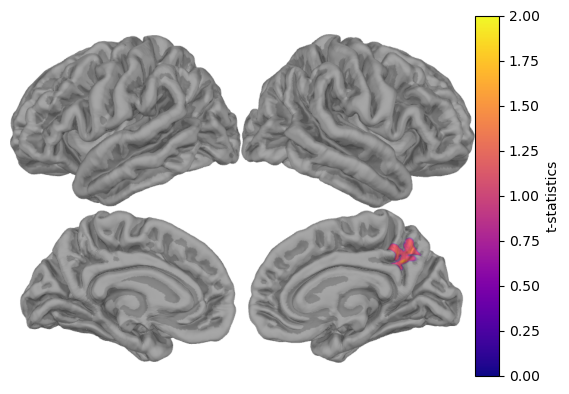

In [33]:
from mpl_toolkits.axes_grid1 import ImageGrid
from mne.viz import Brain
from matplotlib.cm import get_cmap
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import mne
import os.path as op

clim_lims = [0, 0.1, 2]  # Extracted limits from clim

clim = dict(kind='value', lims=clim_lims)

brain_kwargs = dict(alpha=1,clim=clim, background="white", cortex="low_contrast")
# Plot brain visualization for stc_all_cluster_vis (significant clusters)
brain_vis = stc_all_cluster_vis.plot(
    "fsaverage",
    surface='pial',
    hemi="split",  # 'split' for separate hemispheres, 'both' for both hemispheres together
    views=['lateral', 'medial'],  # Views to show
    subjects_dir=subjects_dir,
    initial_time=0,
    colormap="plasma",  # Colormap for stc_all_cluster_vis
    colorbar=False,  # Disable MNE's default colorbar
    time_label="temporal extent (ms)",
    **brain_kwargs

)

# Take a screenshot and crop it
screenshot = brain_vis.screenshot()
brain_vis.close()

# Crop the screenshot to remove white space
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

# Create figure and colorbar
fig, ax = plt.subplots(figsize=(6, 6))  # Ensure figure is defined

# Get colormap and normalization for colorbar
cmap = get_cmap("plasma")
norm = Normalize(vmin=clim_lims[0], vmax=clim_lims[-1])

# Add colorbar for the first dataset
cbar_ax = fig.add_axes([0.9, 0.2, 0.04, 0.6])  # Adjust position for better alignment
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
cbar.set_label("t-statistics")  # Label for clarity

# Plot the cropped screenshot
ax.imshow(cropped_screenshot)
ax.axis("off")  # Hide axis for a cleaner view
plt.show()

False


C:\Users\malann\AppData\Local\Temp\ipykernel_239328\533844102.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(colormap)


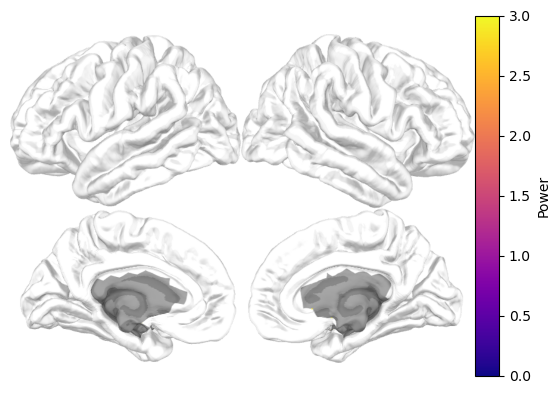

In [25]:
vertno_max, time_max = avg_stc_control1.get_peak()

colormap = "plasma"
clim_lims = [0, 1.5, 3]  # Extracted limits from clim
clim = dict(kind="value", lims=clim_lims)

surfer_kwargs = dict(
    surface='pial',
    hemi="split",
    views=['lateral', 'medial'],  
    subjects_dir=subjects_dir,
    background="w",
    initial_time=time_max,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10,
    alpha=1,clim=clim, cortex="low_contrast",
    colorbar=False
)
brain = avg_stc_control1.mean().plot(**surfer_kwargs)


# Take a screenshot and crop it
screenshot = brain.screenshot()
brain.close()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

# Create figure and colorbar
fig, ax = plt.subplots(figsize=(6, 6))  # Ensure figure is defined

# Get colormap and normalization
cmap = get_cmap(colormap)
norm = Normalize(vmin=clim_lims[0], vmax=clim_lims[-1])  

# Add colorbar 
cbar_ax = fig.add_axes([0.9, 0.2, 0.04, 0.6])  # Adjust position for better alignment
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
cbar.set_label("Power")  # Label for clarity

# Plot the cropped screenshot
ax.imshow(cropped_screenshot)
ax.set_title("")
ax.axis("off")  # Hide axis for a cleaner view

plt.show()

False


C:\Users\malann\AppData\Local\Temp\ipykernel_239328\1798582953.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(colormap)


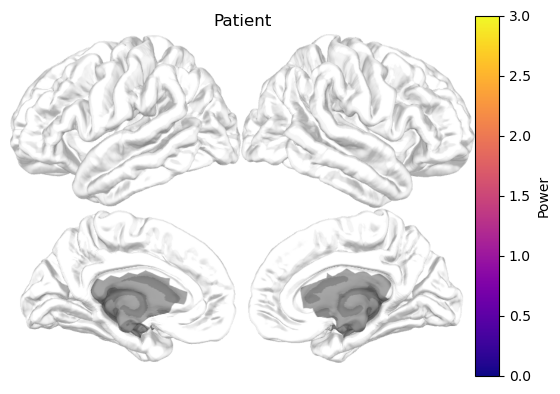

In [26]:
vertno_max, time_max = avg_stc_patient1.get_peak()

colormap = "plasma"
clim_lims = [0, 1.5, 3]  # Extracted limits from clim
clim = dict(kind="value", lims=clim_lims)

surfer_kwargs = dict(
    surface='pial',
    hemi="split",
    views=['lateral', 'medial'],  
    subjects_dir=subjects_dir,
    background="w",
    initial_time=time_max,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10,
    alpha=1,clim=clim, cortex="low_contrast",
    colorbar=False
)
brain = avg_stc_patient1.mean().plot(**surfer_kwargs)
# Take a screenshot and crop it
screenshot = brain.screenshot()
brain.close()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

# Create figure and colorbar
fig, ax = plt.subplots(figsize=(6, 6))  # Ensure figure is defined

# Get colormap and normalization
cmap = get_cmap(colormap)
norm = Normalize(vmin=clim_lims[0], vmax=clim_lims[-1])  

# Add colorbar 
cbar_ax = fig.add_axes([0.9, 0.2, 0.04, 0.6])  # Adjust position for better alignment
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
cbar.set_label("Power")  # Label for clarity

# Plot the cropped screenshot
ax.imshow(cropped_screenshot)
ax.set_title("Patient")
ax.axis("off")  # Hide axis for a cleaner view

plt.show()

# Finding which areas are different

In [34]:
import mne
import numpy as np

# Read the source space (assuming you have the correct subject and src_fname)
src = mne.read_source_spaces(src_fname)

# Get the reduced-resolution vertices (ico-4)
ico4_vertices = src[0]['vertno']

# Read the original labels (full-resolution)
labels = mne.read_labels_from_annot("fsaverage", "aparc", "both", subjects_dir=subjects_dir)
labels = [label for label in labels if 'Unknown' not in label.name]

# Create a list of new labels at ico-4 resolution
ico4_labels = []

for label in labels:
    # Find common vertices between the label and ico-4 vertices
    reduced_vertices = np.intersect1d(ico4_vertices, label.vertices)
    
    # If the label has corresponding vertices in the reduced resolution, create a new label
    if len(reduced_vertices) > 0:
        new_label = label.copy()
        new_label.vertices = reduced_vertices
        ico4_labels.append(new_label)


    Reading a source space...
    [done]
    Reading a source space...
    [done]
    2 source spaces read
Reading labels from parcellation...
   read 35 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\lh.aparc.annot
   read 34 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\rh.aparc.annot


In [35]:
import numpy as np
import mne

# Initialize the threshold for the number of positive vertices
voxel_extent_thres = 1

# List to store labels that meet the criteria
# Separate good labels for positive and negative values
good_positive_labels = []
good_positive_areas = []


# Assuming ico4_labels are the labels at the reduced ico-4 resolution
for lbl in ico4_labels:
    # Check if the label has vertices that are in stc_all_cluster_vis
    common_vertices = np.intersect1d(lbl.vertices, stc_all_cluster_vis.vertices)
    
    if len(common_vertices) > 0:
        # If there are matching vertices, get the data for this label
        label_data = stc_all_cluster_vis.in_label(lbl)
        
        # Extract the data corresponding to the common vertices
        label_values = label_data.data.flatten()  # Flatten the data to make it 1D
        
        # Check for positive values
        positive_values = label_values[label_values > 0]
        
        # Check if the number of positive values meets the threshold
        if len(positive_values) >= voxel_extent_thres:
            good_positive_areas.append(lbl.name)
            good_positive_labels.append(lbl)

mask = stc_all_cluster_vis.data > 0  # Boolean mask


# Return the list of labels that meet the threshold
# Print the results
print(f"Labels with at least {voxel_extent_thres} positive voxels in stc_all_cluster_vis:")
print(good_positive_areas)
print("Count:", len(good_positive_areas))


# Print mask details
print(f"\nShape of mask_full:", mask.shape)
print(f"Number of positive voxels in mask_full:", np.sum(mask))

Labels with at least 1 positive voxels in stc_all_cluster_vis:
['isthmuscingulate-rh', 'precuneus-rh']
Count: 2

Shape of mask_full: (5124, 1)
Number of positive voxels in mask_full: 19


In [36]:
good_positive_labels, good_positive_areas

([<Label | fsaverage, 'isthmuscingulate-rh', rh : 35 vertices>,
  <Label | fsaverage, 'precuneus-rh', rh : 124 vertices>],
 ['isthmuscingulate-rh', 'precuneus-rh'])

In [37]:
import numpy as np

# Assuming your existing mask is a 1D array (e.g., mask = np.array([True, False, True, ...]))
# Repeat the mask 106 times along a new axis
mask_full = np.tile(mask, (1, 106)) # Repeat the mask 106 times

# Print shape of the new mask_full to verify it has been repeated correctly
print(f"Shape of new mask_full: {mask_full.shape}")


Shape of new mask_full: (5124, 106)


In [38]:
plot_area = 'sig_area'

best_labels= good_positive_labels
f1, f2 = 4,20 # for plotting

if plot_area =='sig_area':
    good_labels = best_labels
elif plot_area =='spec_area':
    good_labels = sp__labels

norm = False
if norm == True:
    nfl, nfh = 1, 40
elif norm == False:
    nfl, nfh = 6, 14  # normalization band for PAF power calculation
fl, fh = 8, 12    # Alpha band
bw = 1


C_stcs_all = []
PAF_C_all = []
PAF_C_power_all=[]
for stc1 in control_stc_all:   
    C_stcs = []
    PAF_C=[]
    PAF_C_power=[]

    stc = stc1.copy().crop(f1, f2)
    stc.data = stc.data*mask_full # apply maskin to get highlighted vertices in ROI 
    
    for lbl in good_labels:
        stc_lbl = stc.in_label(lbl)        
        C_stcs.append(stc_lbl)

        if norm == True:
            stc_lbl_norm = stc.copy().in_label(lbl).crop(nfl, nfh).sum()         
            stc_lbl = 100 * stc_lbl/stc_lbl_norm
            stc_lbl = stc_lbl.copy().crop(fl,fh)

        if norm == False:
            stc_lbl_norm = stc.copy().in_label(lbl).crop(nfl, nfh).sum()         
            stc_lbl = stc_lbl.copy().crop(fl,fh)

        
        # direct PAF method
        #PAF_C.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        #PAF_C_power.append(stc.in_label(lbl).crop(fl, fh).data.max())
        
        #COG corrected PAF
        source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
        source_time_max1 = source_time_max1[~np.isnan(source_time_max1)]

        source_vert_max1 = [] #calculate the PAF power for each source
        for i, paf in enumerate(source_time_max1):
         
            paf = np.nan_to_num(paf, nan=0)
            source_vert_max1.append(stc_lbl.data[i][np.argmin(np.abs(stc_lbl.times - paf))])
        source_vert_max1 = np.array(source_vert_max1)
        source_vert_max1 = source_vert_max1[~np.isnan(source_vert_max1)]



    
        source_vert_max1 = []
        bw = bw  # bandwidth in Hz
        
        for i in range(stc_lbl.data.shape[0]):  # loop over vertices
            # Find index of maximum alpha power for this vertex
            idx_max = np.argmax(stc_lbl.data[i, :])
            paf_freq = stc_lbl.times[idx_max]              # Direct PAF (Hz)
        
            # --- BW approach for PAF power ---
            freqs = stc_lbl.times
            in_bw = np.where((freqs >= paf_freq - bw) & (freqs <= paf_freq + bw))[0]
        
            # Average (or sum) power across BW window
            paf_power_val = np.mean(stc_lbl.data[i, in_bw])
        
            # Normalization (if norm == False, relative to band power)
            if not norm:
                paf_power_val = 100 * paf_power_val / stc_lbl_norm.data[i]
        
            source_vert_max1.append(paf_power_val)
    
        source_vert_max1 = np.array(source_vert_max1)
        source_vert_max1 = source_vert_max1[~np.isnan(source_vert_max1)]     
       

        PAF_C.append(source_time_max1.mean()) # PAF averaged across all sources
        PAF_C_power.append(np.array(source_vert_max1).mean()) # PAF power averaged across all sources
     
        
    C_stcs_all.append(C_stcs)
    PAF_C_all.append(PAF_C)
    PAF_C_power_all.append(PAF_C_power)
    
P_stcs_all = []
PAF_P_all = []
PAF_P_power_all=[]
for stc2 in patient_stc_all:
    P_stcs = []
    PAF_P=[]
    PAF_P_power=[]

    stc = stc2.copy().crop(f1, f2)
    stc.data = stc.data*mask_full # apply maskin to get highlighted vertices in ROI 
    
    for lbl in good_labels:

        stc_lbl = stc.in_label(lbl)
        
        P_stcs.append(stc_lbl)
        

        if norm == True:
            stc_lbl_norm = stc.copy().in_label(lbl).crop(nfl, nfh).sum()         
            stc_lbl = 100 * stc_lbl/stc_lbl_norm
            stc_lbl = stc_lbl.copy().crop(fl,fh)

        if norm == False:
            stc_lbl_norm = stc.copy().in_label(lbl).crop(nfl, nfh).sum()         
            stc_lbl = stc_lbl.copy().crop(fl,fh)
        # direct  paf method
        #PAF_P.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        #PAF_P_power.append(stc.in_label(lbl).crop(fl, fh).data.max())
        
        #COG corrected PAF
        source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
        source_time_max1 = source_time_max1[~np.isnan(source_time_max1)]

        source_vert_max1 = [] #calculate the PAF power for each source
        for i, paf in enumerate(source_time_max1):
            paf = np.nan_to_num(paf, nan=0)
            source_vert_max1.append(stc_lbl.data[i][np.argmin(np.abs(stc_lbl.times - paf))])
        
        source_vert_max1 = np.array(source_vert_max1)
        source_vert_max1 = source_vert_max1[~np.isnan(source_vert_max1)]


        source_vert_max1 = []
        bw = bw  # bandwidth in Hz
        
        for i in range(stc_lbl.data.shape[0]):  # loop over vertices
            # Find index of maximum alpha power for this vertex
            idx_max = np.argmax(stc_lbl.data[i, :])
            paf_freq = stc_lbl.times[idx_max]              # Direct PAF (Hz)
        
            # --- BW approach for PAF power ---
            freqs = stc_lbl.times
            in_bw = np.where((freqs >= paf_freq - bw) & (freqs <= paf_freq + bw))[0]
        
            # Average (or sum) power across BW window
            paf_power_val = np.mean(stc_lbl.data[i, in_bw])
            
            # Normalization (if norm == False, relative to band power)
            if not norm:
                paf_power_val = 100 * (paf_power_val / stc_lbl_norm.data[i])
        
            source_vert_max1.append(paf_power_val)
        
        source_vert_max1 = np.array(source_vert_max1)
        source_vert_max1 = source_vert_max1[~np.isnan(source_vert_max1)]

        
        PAF_P.append(source_time_max1.mean()) # PAF averaged across all sources
        PAF_P_power.append(np.array(source_vert_max1).mean()) # PAF power averaged across all sources

    P_stcs_all.append(P_stcs)
    PAF_P_all.append(PAF_P)
    PAF_P_power_all.append(PAF_P_power)

C_stcs_all = np.array(C_stcs_all).T
PAF_C_all = np.array(PAF_C_all).T
PAF_C_power_all = np.array(PAF_C_power_all).T
P_stcs_all = np.array(P_stcs_all).T
PAF_P_all = np.array(PAF_P_all).T
PAF_P_power_all = np.array(PAF_P_power_all).T

# Initialize results dictionary
results_dict = {}

# Iterate over the labels (ROIs) and store data in dictionary
for i, lbl in enumerate(good_labels):

    results_dict[lbl.name] = {
        "C_stcs": C_stcs_all[i],
        "PAF_C": PAF_C_all[i],
        "PAF_C_power": PAF_C_power_all[i],
        "P_stcs": P_stcs_all[i],
        "PAF_P": PAF_P_all[i],
        "PAF_P_power": PAF_P_power_all[i],
        "frequencies": avg_stc_control.copy().crop(f1, f2).times  # Add frequencies
    }

C:\Users\malann\AppData\Local\Temp\ipykernel_259580\3590569183.py:50: RuntimeWarning: invalid value encountered in divide
  source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\3590569183.py:81: RuntimeWarning: invalid value encountered in divide
  paf_power_val = 100 * paf_power_val / stc_lbl_norm.data[i]
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\3590569183.py:128: RuntimeWarning: invalid value encountered in divide
  source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
C:\Users\malann\AppData\Local\Temp\ipykernel_259580\3590569183.py:157: RuntimeWarning: invalid value encountered in divide
  paf_power_val = 100 * (paf_power_val / stc_lbl_norm.data[i])


In [39]:
significant_areas = []  # List to store significant areas where both tests are significant
significant_labels = []  # List to store the labels of significant areas
significant_indices = []  # List to store the indices of significant areas

for n in range(len(best_labels)):
    # Perform Mann-Whitney U Test for PAF
    [st, pval_paf] = mannwhitneyu(PAF_P_all[n], PAF_C_all[n])  # Mann-Whitney U test for PAF
    # Perform Mann-Whitney U Test for PAF Power
    [st, pval_paf_power] = mannwhitneyu(PAF_P_power_all[n], PAF_C_power_all[n])  # Mann-Whitney U test for PAF Power
    # Check if both p-values are below the significance threshold
    if pval_paf_power < 0.05 and pval_paf < 0.05:
        significant_areas.append(best_labels[n].name)  # Add the area name to the list
        significant_labels.append(best_labels[n])  # Add the label to the list
        significant_indices.append(n)  # Add the index to the list

# Print the areas where both PAF and PAF Power are significant
print("Areas where both PAF and PAF Power are significant:")
for i, area in enumerate(significant_areas):
    print(f"Index: {significant_indices[i]}, Area: {area}")


Areas where both PAF and PAF Power are significant:


In [40]:
good_positive_areas

['isthmuscingulate-rh', 'precuneus-rh']

In [41]:
#significant_areas = ['precuneus-lh', 'superiorparietal-lh']
significant_areas = ['precuneus-rh', 'isthmuscingulate-rh']

#significant_areas = good_positive_areas

PAF Power: U = 153.000, p = 0.208
isthmuscingulate-rh PAF control mean = 9.996, std = 0.43644558785705595
PAF Patient mean = 9.820, std = 0.33091035688447423
U(38) = 153.000, p = 0.208, Cohen's d = -0.455
PAF Power control mean = 4.153, std = 1.10512113571167
PAF Power Patient mean = 3.440, std = 1.178688883781433
U(38) = 124.000, p = 0.041, Cohen's d = -0.624
PAF Power: U = 162.000, p = 0.310
precuneus-rh PAF control mean = 9.995, std = 0.4589539513268819
PAF Patient mean = 9.828, std = 0.35349150365868787
U(38) = 162.000, p = 0.310, Cohen's d = -0.406
PAF Power control mean = 4.125, std = 1.0037378072738647
PAF Power Patient mean = 3.475, std = 1.2036585807800293
U(38) = 124.000, p = 0.041, Cohen's d = -0.586


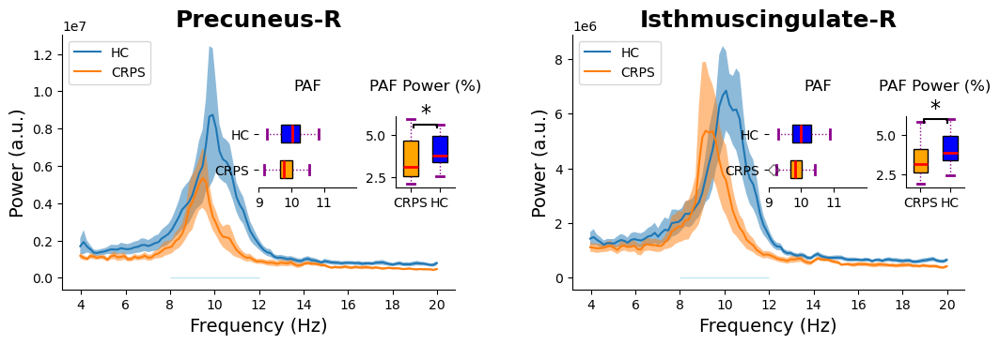

In [42]:
fig, ax1 = plt.subplots(1, int(len(significant_areas)), figsize=(6*2*int(len(significant_areas)/2),3.4 ))  # Adjust the number of rows
ax1 = ax1.ravel()  # Flatten the 2D array of axes

# Define function to remove outliers using IQR
def remove_outliers(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data >= lower_bound) & (data <= upper_bound)]


for n,( key,val) in enumerate(results_dict.items()):
    for nn, sig in enumerate(significant_areas):
        if key == sig:    
            c_sub_avg =[]
            for stc in val['C_stcs']:
                data = stc.copy().crop(f1, f2).data 
                data = data[~np.all(data == 0, axis=1)]
                c_sub_avg.append(data.mean(axis = 0))
            c_sub_avg = np.array(c_sub_avg)
        
            p_sub_avg =[]
            for stc in val['P_stcs']:
                data = stc.copy().crop(f1, f2).data 
                data = data[~np.all(data == 0, axis=1)]
                p_sub_avg.append(data.mean(axis = 0))
            p_sub_avg = np.array(p_sub_avg)
        
            
            mean_control = np.mean(c_sub_avg,axis=0)
            var_control = sem(c_sub_avg,axis=0)
        
            mean_patient = np.mean(p_sub_avg,axis=0)
            var_patient = sem(p_sub_avg,axis=0)
            
           
            freq = avg_stc_control.copy().crop(f1, f2).times
            
            ax1[nn].plot(freq, mean_control)
            ax1[nn].plot(freq, mean_patient)
        
            ax1[nn].fill_between(freq,mean_control+var_control, mean_control-var_control,alpha=0.5)
            ax1[nn].fill_between(freq,mean_patient+var_patient, mean_patient-var_patient,alpha=0.5)
        
            ax1[nn].legend(('HC', 'CRPS'),
                       loc='upper left', fontsize="10")
            
            label_name = good_labels[n].name
            label_name = label_name[0].upper() + label_name[1:]  # Capitalize first letter
            label_name = label_name.replace('-lh', '-L').replace('-rh', '-R')  # Replace hemisphere tags
            ax1[nn].set_title(label_name, fontsize=18, fontweight='bold')
            

            ax1[nn].set_xlabel('Frequency (Hz)',fontsize=14)
            ax1[nn].set_ylabel('Power (a.u.)',fontsize=14)
            ax1[nn].fill_betweenx(range(4), 12,8,color='skyblue', alpha=0.5) 
            
            ax1[nn].spines['top'].set_visible(False)
            ax1[nn].spines['right'].set_visible(False)
            ax1[nn].spines['bottom'].set_visible(True)
            ax1[nn].spines['left'].set_visible(True)
            ax1[nn].grid(False)
            
            l, b, h, w = .5, .4, .25, .28
            
            ax2 = ax1[nn].inset_axes([l, b, h, w])
                
            bp = ax2.boxplot([PAF_P_all[n],PAF_C_all[n]],patch_artist = True,widths =0.5,
                        notch =False, vert = False)
        
            colors = ['orange','blue']
            for patch, color in zip(bp['boxes'], colors):
                patch.set_facecolor(color)
        
            # changing color and linewidth of
            # whiskers
            for whisker in bp['whiskers']:
                whisker.set(color ='#8B008B',
                            linewidth = 1,
                            linestyle =":")
            # changing color and linewidth of
            # caps
            for cap in bp['caps']:
                cap.set(color ='#8B008B',
                        linewidth = 2)
        
            # changing color and linewidth of
            # medians
            for median in bp['medians']:
                median.set(color ='red',
                           linewidth = 2)
            # changing style of fliers
            for flier in bp['fliers']:
                flier.set(marker ='D',
                          color ='#e7298a',
                          alpha = 0.5)
        
            ax2.set_yticklabels(['CRPS','HC'])
            ax2.set_xlim(9, 12)
            ax2.set_title('PAF',  pad=20)
            ax2.set_xticks([9, 10, 11])  # Explicitly set x-tick positions
            ax2.set_xticklabels([9, 10, 11])  # Ensure correct labels
        
            [st, pval] = mannwhitneyu(PAF_P_all[n],PAF_C_all[n]) # t test between control and patient PAF
            print(f"PAF Power: U = {st:.3f}, p = {pval:.3f}")
        
            
            # Calculate the means and standard deviations
            mean_patient = np.mean(PAF_P_all[n])
            mean_control = np.mean(PAF_C_all[n])
            sd_patient = np.std(PAF_P_all[n], ddof=1)  # Sample standard deviation
            sd_control = np.std(PAF_C_all[n], ddof=1)  # Sample standard deviation
            
            # Calculate sample sizes
            n_patient = len(PAF_P_all[n])
            n_control = len(PAF_C_all[n])
            
            # Calculate pooled standard deviation
            pooled_sd = np.sqrt(((n_patient - 1) * sd_patient**2 + (n_control - 1) * sd_control**2) / (n_patient + n_control - 2))
            
            # Calculate Cohen's d
            cohens_d = (mean_patient - mean_control) / pooled_sd
            
            # Calculate degrees of freedom
            df = n_patient + n_control - 2
            
            # Output the results
            
            print(f"{best_labels[n].name} PAF control mean = {mean_control:.3f}, std = {sd_control}")
            print(f"PAF Patient mean = {mean_patient:.3f}, std = {sd_patient}")
            print(f"U({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")
            
            if pval<0.05:
            
                x1, x2 =  11.1, 11.4
                y, h, col = 1, 1, 'k'
                
                ax2.plot([x1, x2, x2, x1], [y, y, y+h, y+h], lw=1.5, c=col)
                ax2.text(11.5, 1, f"*" , ha='center', va='bottom', color=col, fontsize=16)    

            
            ax2.spines['top'].set_visible(False)
            ax2.spines['right'].set_visible(False)
            ax2.spines['bottom'].set_visible(True)
            ax2.spines['left'].set_visible(False)
              
            ax2.spines['top'].set_visible(False)
            ax2.spines['right'].set_visible(False)
            ax2.spines['bottom'].set_visible(True)
            ax2.spines['left'].set_visible(False)
            ax2.grid(False)
            # Inset plot for PAF power
            l, b, h, w = 0.85, .4, .15, .28
            ax3 = ax1[nn].inset_axes([l, b, h, w])

            # Remove outliers from the data before plotting
            PAF_P_power_all_filtered = remove_outliers(PAF_P_power_all[n])
            PAF_C_power_all_filtered = remove_outliers(PAF_C_power_all[n])

# Now plot the boxplot with the filtered data
            bp = ax3.boxplot([PAF_P_power_all_filtered, PAF_C_power_all_filtered], patch_artist=True, widths=0.5, notch=False)
           
            #bp = ax3.boxplot([PAF_P_power_all[n], PAF_C_power_all[n]], patch_artist=True, widths=0.5, notch=False, flierprops=dict(marker='', color='none'))

            # Modify the outliers style
            for flier in bp['fliers']:
                flier.set(marker='o', color='red', alpha=0.5)
            
            colors = ['orange','blue']
            for patch, color in zip(bp['boxes'], colors):
                patch.set_facecolor(color)
            
            # changing color and linewidth of
            # whiskers
            for whisker in bp['whiskers']:
                whisker.set(color ='#8B008B',
                            linewidth = 1,
                            linestyle =":")
            # changing color and linewidth of
            # caps
            for cap in bp['caps']:
                cap.set(color ='#8B008B',
                        linewidth = 2)
                
            # changing color and linewidth of
            # medians
            for median in bp['medians']:
                median.set(color ='red',
                           linewidth = 2)
            # changing style of fliers
            for flier in bp['fliers']:
                flier.set(marker ='D',
                          color ='#e7298a',
                          alpha = 0.5)
            ax3.set_xticklabels(['CRPS','HC'])
            ax3.set_title('PAF Power (%)', pad=20)
            #ax3.set_yticks([0e9, 0.5e9, 1e9, 1.5e9])
        
            [st, pval] = mannwhitneyu(PAF_P_power_all[n],PAF_C_power_all[n]) # t test between control and patient PAF Power
            
            # Calculate the means and standard deviations
            mean_patient = np.mean(PAF_P_power_all[n])
            mean_control = np.mean(PAF_C_power_all[n])
            sd_patient = np.std(PAF_P_power_all[n], ddof=1)  # Sample standard deviation
            sd_control = np.std(PAF_C_power_all[n], ddof=1)  # Sample standard deviation
            
            
            # Calculate sample sizes
            n_patient = len(PAF_P_power_all[n])
            n_control = len(PAF_C_power_all[n])
            
            # Calculate pooled standard deviation
            pooled_sd = np.sqrt(((n_patient - 1) * sd_patient**2 + (n_control - 1) * sd_control**2) / (n_patient + n_control - 2))
            
            # Calculate Cohen's d
            cohens_d = (mean_patient - mean_control) / pooled_sd
            
            # Calculate degrees of freedom
            df = n_patient + n_control - 2
            
            # Output the results
            
            print(f"PAF Power control mean = {mean_control:.3f}, std = {sd_control}")
            print(f"PAF Power Patient mean = {mean_patient:.3f}, std = {sd_patient}")
            print(f"U({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")
            
            
            if pval<0.05:
            
                x1, x2 =  1.1, 1.9
                y, h, col = max(PAF_C_power_all_filtered), 0.2, 'k'
                
                ax3.plot([x1, x1, x2, x2 ], [y-h,y, y, y-h], lw=1.5, c=col)
                ax3.text((x1+x2)*.5, max(PAF_C_power_all_filtered), f"*", ha='center', va='bottom', color=col,fontsize=16)
            
            ax3.spines['top'].set_visible(False)
            ax3.spines['right'].set_visible(False)
            ax3.spines['bottom'].set_visible(True)
            ax3.spines['left'].set_visible(True)
            ax3.grid(False)
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.6)
plt.show()

# PAF and PAF Power

In [142]:
PAF_Power_P_all=[]
PAF_P_all=[]
PAF_P_stcs = []
PAF_Power_P_stcs = []

labels = mne.read_labels_from_annot(
        "fsaverage", "aparc", "both", subjects_dir=subjects_dir
    )
labels = [label for label in labels if 'unknown' not in label.name]

control_stcs = {}
patient_stcs = {}
patient_PAF = {}
patient_PAF_power = {}
control_PAF = {}
control_PAF_power = {}
control_stc_all = []
patient_stc_all = []
control_stcs_raw = {}
patient_stcs_raw = {}

avg_stc_control = 0
avg_stc_control1 = 0
avg_stc_patient = 0
avg_stc_patient1 = 0

nfl, nfh = 7, 13  # Full band
fl, fh = 8, 12    # Alpha band

for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"
    psd_dir = "E:/PASP_MEG_data/Patient_Source_PSDs/"
    fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"
    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc_norm_band = stc.copy().crop(nfl, nfh)
    stc_norm = stc_norm_band.copy().sum()
    stc = 100 * stc/stc_norm.data
    stc = stc.copy().crop(fl, fh)

    # mask the 69th unknown areas
    stc = mask_stc_vertices(stc, valid_verts)

    #COG corrected PAF
    PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source
    PAF = np.array(PAF)
    PAF = np.nan_to_num(PAF, nan=0.0)
    
    PAF_Power = [] #calculate the PAF power for each source
    for i, paf in enumerate(PAF):
        PAF_Power.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

    PAF_Power = np.array(PAF_Power)
    PAF_Power = np.nan_to_num(PAF_Power, nan=0.0)

    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    PAF_Power_P_all.append(PAF_Power)
    PAF_P_all.append(PAF)
    PAF_Power_P_stcs.append(PAF_Power.data)
    PAF_P_stcs.append(PAF.data)
    
    PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)    

PAF_Power_P_stcs = np.rollaxis(np.array(PAF_Power_P_stcs),2,1)
PAF_P_stcs =  np.rollaxis(np.array(PAF_P_stcs),2,1)
    
PAF_Power_C_all=[]
PAF_C_all=[]
PAF_C_stcs = []
PAF_Power_C_stcs = []

for sub in Control_list[0:len(Patient_list)]:

    subjects_dir = "E:/Freesurfer_Files"
    psd_dir = "E:/PASC_MEG_data/Control_Source_PSDs/"
    fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"
    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc_norm_band = stc.copy().crop(nfl, nfh)
    stc_norm = stc_norm_band.copy().sum()
    stc = 100 * stc/stc_norm.data
    stc = stc.copy().crop(fl, fh)

    # mask the 69th unknown areas
    stc = mask_stc_vertices(stc, valid_verts)

    #COG corrected PAF
    PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source
    PAF = np.array(PAF)
    PAF = np.nan_to_num(PAF, nan=0.0)
    
    PAF_Power = [] #calculate the PAF power for each source
    for i, paf in enumerate(PAF):
        PAF_Power.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

    PAF_Power = np.array(PAF_Power)
    PAF_Power = np.nan_to_num(PAF_Power, nan=0.0)

    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    PAF_Power_C_all.append(PAF_Power)
    PAF_C_all.append(PAF)
    PAF_Power_C_stcs.append(PAF_Power.data)
    PAF_C_stcs.append(PAF.data)
    
    PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)
    
PAF_Power_C_stcs = np.rollaxis(np.array(PAF_Power_C_stcs),2,1)
PAF_C_stcs =  np.rollaxis(np.array(PAF_C_stcs),2,1)


Reading labels from parcellation...
   read 35 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\lh.aparc.annot
   read 34 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\rh.aparc.annot
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]


C:\Users\malann\AppData\Local\Temp\ipykernel_30480\2720410916.py:47: RuntimeWarning: invalid value encountered in divide
  PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source


Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.

C:\Users\malann\AppData\Local\Temp\ipykernel_30480\2720410916.py:94: RuntimeWarning: invalid value encountered in divide
  PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source


Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.
[done]
Writing STC to disk...
Overwriting existing file.
Overwriting existing file.

In [121]:
import numpy as np
import pandas as pd

# ---- Assumptions ----
# PAF_C_stcs: (29, 1, 5124) -> controls PAF
# PAF_P_stcs: (29, 1, 5124) -> patients PAF
# PAF_power_C_stcs: (29, 1, 5124) -> controls PAF power (should be defined in your data processing)
# PAF_power_P_stcs: (29, 1, 5124) -> patients PAF power (should be defined in your data processing)
# control_list: list of control subject names
# patient_list: list of patient subject names
# labels: list of label objects
# src: source space (must be loaded if not already)

# Assuming src[0] gives the vertices
src_vertices = src[0]['vertno']  # Adjust if source space is different

# Initialize arrays
PAF_control_subjects = np.zeros((PAF_C_stcs.shape[0], len(labels)))
PAF_power_control_subjects = np.zeros((PAF_C_stcs.shape[0], len(labels)))

PAF_patient_subjects = np.zeros((PAF_P_stcs.shape[0], len(labels)))
PAF_power_patient_subjects = np.zeros((PAF_P_stcs.shape[0], len(labels)))

# --- Controls ---
for subj_idx, (stc_paf, stc_paf_power) in enumerate(zip(PAF_C_all,PAF_Power_C_all)):
    for roi_idx, lbl in enumerate(labels):
        PAF_control_subjects[subj_idx, roi_idx] = stc_paf.in_label(lbl).data.mean()
        PAF_power_control_subjects[subj_idx, roi_idx] = stc_paf_power.in_label(lbl).data.mean()

# --- Patients ---
for subj_idx, (stc_paf, stc_paf_power) in enumerate(zip(PAF_P_all,PAF_Power_P_all)):
    for roi_idx, lbl in enumerate(labels):
        PAF_patient_subjects[subj_idx, roi_idx] = stc_paf.in_label(lbl).data.mean()
        PAF_power_patient_subjects[subj_idx, roi_idx] = stc_paf_power.in_label(lbl).data.mean()

# Get label names for ROIs
roi_names = [label.name for label in labels]

# --- Save controls ---
import pandas as pd

# --- Save controls ---
df_PAF_control = pd.DataFrame(PAF_control_subjects, columns=roi_names)
df_PAF_control.insert(0, "Subject", Control_list[0: len(Patient_list)])

df_PAF_power_control = pd.DataFrame(PAF_power_control_subjects, columns=roi_names)
df_PAF_power_control.insert(0, "Subject", Control_list[0: len(Patient_list)])

# --- Save patients ---
df_PAF_patient = pd.DataFrame(PAF_patient_subjects, columns=roi_names)
df_PAF_patient.insert(0, "Subject", Patient_list)

df_PAF_power_patient = pd.DataFrame(PAF_power_patient_subjects, columns=roi_names)
df_PAF_power_patient.insert(0, "Subject", Patient_list)

# Create an Excel file and save all data into different sheets
out_path = 'E:/GLM_SPM/PAF_Results_450_raw_rois.xlsx'

with pd.ExcelWriter(out_path) as writer:
    # Save controls to separate sheets
    df_PAF_control.to_excel(writer, sheet_name='PAF_controls', index=False)
    df_PAF_power_control.to_excel(writer, sheet_name='PAF_power_controls', index=False)
    
    # Save patients to separate sheets
    df_PAF_patient.to_excel(writer, sheet_name='PAF_patients', index=False)
    df_PAF_power_patient.to_excel(writer, sheet_name='PAF_power_patients', index=False)

print("All results saved in Excel file:", out_path)



All results saved in Excel file: E:/GLM_SPM/PAF_Results_450_raw_rois.xlsx


    Reading a source space...
    [done]
    Reading a source space...
    [done]
    2 source spaces read
Reading labels from parcellation...
   read 226 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\lh.aparc_sub.annot
   read 224 labels from C:\Users\malann\mne_data\MNE-fsaverage-data\fsaverage\label\rh.aparc_sub.annot


C:\Users\malann\AppData\Local\Temp\ipykernel_30480\662723659.py:62: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(colormap)


False


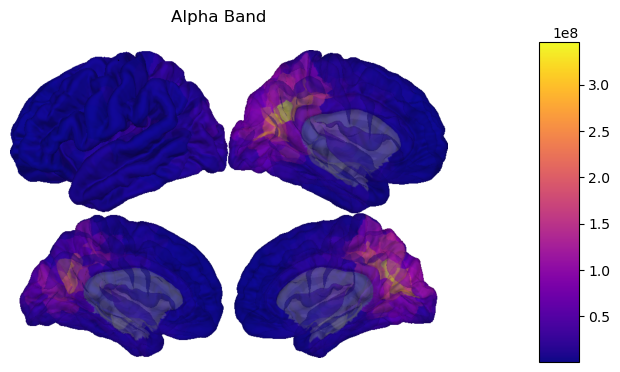

In [154]:
import pandas as pd

# The files live in:
subjects_dir = 'C:/Users/malann/mne_data/MNE-fsaverage-data'
subject = "fsaverage"
trans = "fsaverage"  # MNE has a built-in fsaverage transformation
src_fname = subjects_dir+'/'+subject+"/bem"+"/fsaverage-ico-4-src.fif"
bem = subjects_dir+'/'+subject+"/bem"+"/fsaverage-5120-5120-5120-bem-sol.fif"
src = mne.read_source_spaces(src_fname)

import statsmodels.api as sm
import statsmodels.formula.api as smf
from mpl_toolkits.axes_grid1 import ImageGrid, inset_locator, make_axes_locatable


labels = mne.read_labels_from_annot(
        "fsaverage", "aparc_sub", "both", subjects_dir=subjects_dir
    )
labels = [label for label in labels if 'unknown' not in label.name]

# Load Excel file
df = pd.read_excel("E:/GLM_SPM/PAF_Results_450_raw_rois.xlsx", sheet_name="PAF_power_patients")

# Assume first column contains ROI names, second column contains values
import pandas as pd
import numpy as np
import mne
from mne.datasets import fetch_fsaverage

# Step 1: Load Excel data
roi_names = df.columns[1:].tolist()  # skip subject column

# Step 2: Select one subject by ID
subject_id = 'PASP001'  # <-- change this to the subject ID you want
subject_row = df[df.iloc[:, 0] == subject_id]  # assumes subject IDs are in column 0

if subject_row.empty:
    raise ValueError(f"Subject ID {subject_id} not found in the sheet.")

roi_values = subject_row.iloc[0, 1:].values  # skip subject column

# Initialize an array to hold data
data = np.zeros(len(labels))

# Map your values to the labels
for i, label in enumerate(labels):
    for j, roi in enumerate(roi_names):
        if roi in label.name:  # or use a stricter matching
            data[i] = roi_values[j]
            break


# Map roi_values to label names
roi_value_map = dict(zip(roi_names, roi_values))

# Prepare a colormap and normalization range for your values
colormap = "plasma"  # you can change to 'viridis', 'coolwarm', etc.
# Define normalization range based on your data (min and max of roi_values)
vmin, vmax = np.min(roi_values), np.max(roi_values)
norm = Normalize(vmin=vmin, vmax=vmax)
cmap = get_cmap(colormap)

# Initialize brain visualization
brain = Brain(
    subject=subject,
    subjects_dir=subjects_dir,
    hemi="split",        # show both hemispheres
    views=['lateral', 'medial'],  # lateral and medial views
    background="white",
    cortex="low_contrast",
    alpha=0.7
)

# Add colored labels based on roi values
for label in labels:
    # Extract the ROI key from label.name (make sure to match your ROI naming scheme!)
    # For example, if label.name includes hemi info like 'superiorparietal-lh', 
    # and your roi_names are 'superiorparietal-lh' or similar.
    # You might need to adjust the string matching here.
    roi_key = label.name.replace('-', '_')  # Example adjustment, adapt if needed

    # Find exact or approximate match (here we do a contains check, you can refine)
    matched_rois = [roi for roi in roi_names if roi.lower() in label.name.lower()]
    if matched_rois:
        roi_name = matched_rois[0]  # take the first match
        val = roi_value_map.get(roi_name)
        if val is not None and not np.isnan(val):
            color = cmap(norm(val))[:3]  # RGB tuple
            brain.add_label(label, color=color)

# Show brain with colored ROIs
brain.show()


# Capture screenshot
screenshot = brain.screenshot()
brain.close()

# Crop white borders
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

# Plot cropped screenshot with colorbar
fig = plt.figure(figsize=(8, 4))
axes = ImageGrid(fig, 111, nrows_ncols=(1, 1), axes_pad=0.5)

band = "Alpha"  # Set band or description text here

for ax, image, title in zip(axes, [cropped_screenshot], [f"{band} Band"]):
    ax.imshow(image)
    ax.axis("off")

cax = fig.add_axes([0.9, 0.1, 0.05, 0.8])
fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cax)
fig.suptitle(f"{band} Band")

plt.show()


# Read PAF Power

In [ ]:
PAF_Power_stc_C=0
PAF_Power_sub = []
for sub in Control_list[0:len(Patient_list)]:
    subject = 'fsaverage'
    fname = 'E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power'
    PAF_Power = mne.read_source_estimate(fname, subject=subject)
    
    PAF_Power_lbl=[]
    lbl_name=[]
    PAF_Power_stc_C+=PAF_Power
    
    for lbl in ico4_labels:
        lbl_name.append(lbl.name)
        PAF_Power_lbl.append(PAF_Power.in_label(lbl).data.mean())
        
    PAF_Power_sub.append(PAF_Power_lbl)
PAF_Power_sub=np.array(PAF_Power_sub)
PAF_Power_stc_C = PAF_Power_stc/len(Control_list)

In [ ]:
surfer_kwargs = dict(
    surface = 'inflated',
    hemi="rh",
    subjects_dir=subjects_dir,
    clim=dict(kind="value", lims=[0, 0.5, 4]),
    background="w",
    views="dorsal",
    initial_time=0,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10
)
brain = PAF_Power_stc.in_label(sp_areas[1]).plot(**surfer_kwargs)
        

#brain.add_annotation("aparc_sub", borders=1)

In [ ]:
PAF_Power_sub = []
PAF_Power_stc_P = 0

for sub in Patient_list:
    subject = 'fsaverage'
    fname = 'E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power'
    PAF_Power = mne.read_source_estimate(fname, subject=subject)
    
    PAF_Power_lbl=[]
    lbl_name=[]
    PAF_Power_stc_P+=PAF_Power
    
    for lbl in labels:
        lbl_name.append(lbl.name)
        PAF_Power_lbl.append(PAF_Power.in_label(lbl).data.mean())
        
    PAF_Power_sub.append(PAF_Power_lbl)
PAF_Power_sub=np.array(PAF_Power_sub)

PAF_Power_stc_P =PAF_Power_stc_P/len(Patient_list)

In [ ]:
surfer_kwargs = dict(
    surface = 'inflated',
    hemi="rh",
    subjects_dir=subjects_dir,
    clim=dict(kind="value", lims=[0, 0.5, 4]),
    background="w",
    views="dorsal",
    initial_time=0,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10
)

brain = PAF_Power_stc_P.in_label(sp_areas[1]).plot(**surfer_kwargs)
        

In [ ]:
PAF_Power_sub.shape

In [ ]:
np.savetxt("PAF_pwer.csv", PAF_Power_sub, delimiter=",")


In [ ]:
# For specific area

PAF_C_power_all=[]
for stc in PAF_Power_C_all:   
    PAF_C_power=[]
    
    for lbl in sp_areas:
        PAF_C_power.append(stc.in_label(lbl).data.mean())
        
    PAF_C_power_all.append(PAF_C_power)
PAF_C_power_all=np.array(PAF_C_power_all)

In [ ]:
PAF_C_power_all.shape

In [ ]:
PAF_C_power_all

np.savetxt("foo.csv", PAF_C_power_all, delimiter=",")

# Stats for PAF Power

In [68]:
n_vertices_fsave, n_times = stc.data.shape
n_subjects1 = len(PAF_Power_C_stcs)
n_subjects2 = len(PAF_Power_P_stcs)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(PAF_Power_C_stcs)
X2 = np.array(PAF_Power_P_stcs)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X = [X1, X2]
X1.shape

(29, 1, 5124)

In [69]:
from scipy import stats as stats

print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 10000
p_threshold = 0.05

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    verbose=True,
    buffer_size=None
)


#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]



print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(2562), np.arange(2562)]
F_obs_plot = summarize_clusters_stc(
    clu, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

F_obs_plot.save("stat_file_05_10000_sub_PAF_Power_29", overwrite = True)

Computing adjacency.
-- number of adjacent vertices : 5124
Clustering.
stat_fun(H1): min=-1.7724003791809082 max=3.5339725017547607
Running initial clustering …
Found 83 clusters


C:\Users\malann\AppData\Local\spyder-6\envs\spyder-runtime\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| Permuting : 9999/9999 [06:58<00:00,   23.90it/s]


Visualizing clusters.


RuntimeError: No significant clusters available. Please adjust your threshold or check your statistical analysis.

In [70]:
cluster_p_values

array([0.5519, 0.5377, 0.1898, 0.1124, 0.7404, 0.2445, 0.675 , 0.7994,
       0.2422, 0.4553, 0.5002, 0.7106, 0.6142, 0.6475, 0.5517, 0.4759,
       0.426 , 0.8065, 0.8123, 0.7548, 0.7533, 0.4316, 0.7684, 0.6991,
       0.7801, 0.5486, 0.8181, 0.7541, 0.6031, 0.7921, 0.4651, 0.675 ,
       0.7844, 0.7837, 0.7407, 0.7577, 0.7873, 0.806 , 0.7849, 0.7533,
       0.7207, 0.8715, 0.837 , 0.7699, 0.7644, 0.708 , 0.8644, 0.8064,
       0.5849, 0.7954, 0.776 , 0.759 , 0.8235, 0.1124, 0.7468, 0.4941,
       0.1179, 0.6265, 0.3334, 0.7734, 0.4789, 0.476 , 0.7969, 0.6504,
       0.7413, 0.8173, 0.5569, 0.8187, 0.7292, 0.9407, 0.8077, 0.7543,
       0.7487, 0.758 , 0.7866, 0.7873, 0.7129, 0.7651, 0.7779, 0.6743,
       0.6541, 0.8113, 0.6984])

# Load stats results from HPC for PAF Power

In [ ]:
F_obs_plot = mne.read_source_estimate('stat_file_05_10000_sub_PAF_Power_29')

import numpy as np
import mne

# Initialize a new array for the new data (same shape as original)
new_data = np.zeros_like(F_obs_plot.data)

# Sum the data of all the significant clusters for the first time point
new_data = F_obs_plot.data[:,0]

# Create new SourceEstimate with the modified data (1 time point for summed clusters)
F_obs_plot = mne.SourceEstimate(new_data, stc_all_cluster_vis.vertices, tmin=stc_all_cluster_vis.times[0], tstep=0)

# Print new STC info
print(F_obs_plot)
print(f"Shape of new STC data: {F_obs_plot.data.shape}")

# Optionally, you can save the new STC if you wish to visualize or further analyze it
# new_stc.save('summed_first_time_point_clusters-stc')


In [ ]:
signs = np.sign(X1[0]-X2[0])
F_obs_plot = np.nan * np.ones_like(t_obs)

for c, p_val in zip(clusters, cluster_p_values):
    if p_val <= 0.05:
        F_obs_plot[c] = t_obs[c] * signs[c]
        
        
F_obs_plot= np.nan_to_num(F_obs_plot, copy=True, nan=0.0)

F_obs_plot = mne.SourceEstimate(F_obs_plot,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")


In [ ]:
colormap = "plasma"

clim_lims = [0,1.5,3]
clim = dict(kind="value", lims=clim_lims)
views = ['dorsal', 'ventral', 'lat', 'medial']
hemis = ['both','both','split','split']
screenshots = []
brain_kwargs = dict(alpha=1,clim=clim, cortex="low_contrast")

# Plot the STC, get the brain image, crop it:
brain = F_obs_plot.plot(
    views=['lat', 'medial'],
    hemi='split',
    surface='pial',
    size=(800, 400),
    subject=subject,
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    colorbar=False,
    colormap=colormap,
    time_viewer=False,
    show_traces=False,
    **brain_kwargs
)

# Take a screenshot and crop it
screenshot = brain.screenshot()
brain.close()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

# Create figure and colorbar
fig, ax = plt.subplots(figsize=(6, 6))  # Ensure figure is defined

# Get colormap and normalization
cmap = get_cmap(colormap)
norm = Normalize(vmin=clim_lims[0], vmax=clim_lims[-1])  

# Add colorbar 
cbar_ax = fig.add_axes([0.9, 0.2, 0.04, 0.6])  # Adjust position for better alignment
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
cbar.set_label("t-statistics")  # Label for clarity

# Plot the cropped screenshot
ax.imshow(cropped_screenshot)
ax.set_title("PAF Power: Control vs Patient")
ax.axis("off")  # Hide axis for a cleaner view

plt.show()

# Stats for PAF 

In [66]:
n_vertices_fsave, n_times = stc.data.shape
n_subjects1 = len(PAF_C_stcs)
n_subjects2 = len(PAF_P_stcs)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(PAF_C_stcs)
X2 = np.array(PAF_P_stcs)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X = [X1, X2]
X1.shape

(17, 1, 5124)

In [68]:
from scipy import stats as stats

print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 10000
p_threshold = 0.05

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    verbose=True,
    buffer_size=None
)


#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(2562), np.arange(2562)]
F_obs_plot = summarize_clusters_stc(
    clu, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

F_obs_plot.save(f"stat_file_01_10000_sub_PAF_{len(Patient_list)}", overwrite=True)

Computing adjacency.
-- number of adjacent vertices : 5124
Clustering.
stat_fun(H1): min=-1.0587804910081693 max=3.3183828278102845
Running initial clustering …
Found 104 clusters


100%|██████████| Permuting : 9999/9999 [01:59<00:00,   83.86it/s]

Visualizing clusters.


RuntimeError: No significant clusters available. Please adjust your threshold or check your statistical analysis.

# Load stats results from HPC for PAF

In [103]:
F_obs_plot = mne.read_source_estimate(f"stat_file_01_10000_sub_PAF_{len(Patient_list)}")

import numpy as np
import mne

# Initialize a new array for the new data (same shape as original)
new_data = np.zeros_like(F_obs_plot.data)

# Sum the data of all the significant clusters for the first time point
new_data = F_obs_plot.data[:,0]

# Create new SourceEstimate with the modified data (1 time point for summed clusters)
F_obs_plot = mne.SourceEstimate(new_data, stc_all_cluster_vis.vertices, tmin=stc_all_cluster_vis.times[0], tstep=0)

# Print new STC info
print(F_obs_plot)
print(f"Shape of new STC data: {F_obs_plot.data.shape}")

# Optionally, you can save the new STC if you wish to visualize or further analyze it
# new_stc.save('summed_first_time_point_clusters-stc')


<SourceEstimate | 5124 vertices, tmin : 0.0 (ms), tmax : 0.0 (ms), tstep : 0.0 (ms), data shape : (5124, 1), ~60 KiB>
Shape of new STC data: (5124, 1)


In [104]:
import numpy as np

# Define the voxel extent threshold
voxel_extent_thres = 25

# Assuming PAF_mask is your boolean mask based on positive values in F_obs_plot
PAF_mask = F_obs_plot.data > 0  # Boolean mask for positive values in F_obs_plot

# Separate good labels for positive and negative values
PAF_good_positive_labels = []
PAF_good_negative_labels = []
PAF_good_positive_areas = []
PAF_good_negative_areas = []

for lbl in ico4_labels:
    # Find intersection for positive and negative vertices
    PAF_common_positive = np.intersect1d(F_obs_plot.vertices, lbl.vertices)  # Check common vertices for positive
    PAF_common_negative = np.intersect1d(F_obs_plot.vertices, lbl.vertices)  # Check common vertices for negative

    if len(PAF_common_positive) > 0:
        # If there are matching vertices, get the data for this label
        label_data = F_obs_plot.in_label(lbl)
        
        # Extract the data corresponding to the common vertices
        label_values = label_data.data.flatten()  # Flatten the data to make it 1D
        
        # Check for positive and negative values
        positive_values = label_values[label_values > 0]
        negative_values = label_values[label_values < 0]


        # Apply voxel extent threshold (at least 12 positive or 12 negative voxels per region)
        if len(positive_values) >= voxel_extent_thres:
            PAF_good_positive_areas.append(lbl.name)
            PAF_good_positive_labels.append(lbl)

        if len(negative_values) >= voxel_extent_thres:
            PAF_good_negative_areas.append(lbl.name)
            PAF_good_negative_labels.append(lbl)

# Print the results
print(f"Labels with at least {voxel_extent_thres} positive voxels in F_obs_plot:")
print(PAF_good_positive_areas)
print("Count:", len(PAF_good_positive_areas))

print(f"\nLabels with at least {voxel_extent_thres} negative voxels in F_obs_plot:")
print(PAF_good_negative_areas)
print("Count:", len(PAF_good_negative_areas))

# Print mask details
print("\nShape of mask_full:", PAF_mask.shape)
print("Number of positive voxels in mask_full:", np.sum(PAF_mask))


Labels with at least 25 positive voxels in F_obs_plot:
['lateraloccipital-lh', 'lateraloccipital-rh', 'lingual-rh', 'precuneus-rh']
Count: 4

Labels with at least 25 negative voxels in F_obs_plot:
[]
Count: 0

Shape of mask_full: (5124, 1)
Number of positive voxels in mask_full: 221


False


C:\Users\malann\AppData\Local\Temp\ipykernel_119172\1981561786.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(colormap)


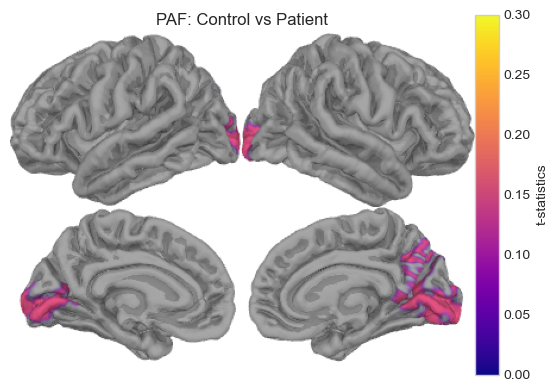

In [110]:
colormap = "plasma"

clim_lims = [0,0.15,0.3]
clim = dict(kind="value", lims=clim_lims)
views = ['dorsal', 'ventral', 'lat', 'medial']
hemis = ['both','both','split','split']
screenshots = []
brain_kwargs = dict(alpha=1,clim=clim, cortex="low_contrast")

# Plot the STC, get the brain image, crop it:
brain = F_obs_plot.plot(
    views=['lat', 'medial'],
    hemi='split',
    surface='pial',
    size=(800, 400),
    subject=subject,
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    colorbar=False,
    colormap=colormap,
    time_viewer=False,
    show_traces=False,
    **brain_kwargs
)

# Take a screenshot and crop it
screenshot = brain.screenshot()
brain.close()
nonwhite_pix = (screenshot != 255).any(-1)
nonwhite_row = nonwhite_pix.any(1)
nonwhite_col = nonwhite_pix.any(0)
cropped_screenshot = screenshot[nonwhite_row][:, nonwhite_col]

# Create figure and colorbar
fig, ax = plt.subplots(figsize=(6, 6))  # Ensure figure is defined

# Get colormap and normalization
cmap = get_cmap(colormap)
norm = Normalize(vmin=clim_lims[0], vmax=clim_lims[-1])  

# Add colorbar 
cbar_ax = fig.add_axes([0.9, 0.2, 0.04, 0.6])  # Adjust position for better alignment
cbar = fig.colorbar(ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax)
cbar.set_label("t-statistics")  # Label for clarity

# Plot the cropped screenshot
ax.imshow(cropped_screenshot)
ax.set_title("PAF: Control vs Patient")
ax.axis("off")  # Hide axis for a cleaner view

plt.show()

Finding which areas are significant

In [106]:
PAF_mask_full = np.tile(np.array(PAF_mask), (1, 106)) # vertice X freq bins

C_stcs_all = []
PAF_C_all = []
for stc1 in control_stc_all:   
    C_stcs = []
    PAF_C=[]

    stc = stc1.copy().crop(f1, f2)
    stc.data = np.where(PAF_mask_full, stc.data, 0) # apply maskin to get highlighted vertices in ROI 
    for lbl in PAF_good_positive_labels:
        
        stc_lbl = stc.in_label(lbl)
        C_stcs.append(stc_lbl)

        stc_lbl = stc.copy().in_label(lbl).crop(fl, fh)     

        # direct PAF method
        #PAF_C.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        #PAF_C_power.append(stc.in_label(lbl).crop(fl, fh).data.max())
        
        #COG corrected PAF
        source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
        source_time_max2 = source_time_max1[~np.isnan(source_time_max1)]

        PAF_C.append(source_time_max2.mean()) # PAF averaged across all sources
    C_stcs_all.append(C_stcs)
    PAF_C_all.append(PAF_C)
    
P_stcs_all = []
PAF_P_all = []
for stc2 in patient_stc_all:
    P_stcs = []
    PAF_P=[]

    stc = stc2.copy().crop(f1, f2)
    stc.data = np.where(PAF_mask_full, stc.data, 0) # apply maskin to get highlighted vertices in ROI 
    
    for lbl in PAF_good_positive_labels:

        stc_lbl = stc.in_label(lbl)
        
        P_stcs.append(stc_lbl)
        
        stc_lbl = stc.copy().in_label(lbl).crop(fl, fh)    

        # direct  paf method
        #PAF_P.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        #PAF_P_power.append(stc.in_label(lbl).crop(fl, fh).data.max())
                
        #COG corrected PAF
        source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
        source_time_max2 = source_time_max1[~np.isnan(source_time_max1)]

        PAF_P.append(source_time_max2.mean()) # PAF averaged across all sources

    P_stcs_all.append(P_stcs)
    PAF_P_all.append(PAF_P)

C_stcs_all = np.array(C_stcs_all).T
PAF_C_all = np.array(PAF_C_all).T
P_stcs_all = np.array(P_stcs_all).T
PAF_P_all = np.array(PAF_P_all).T


C:\Users\malann\AppData\Local\Temp\ipykernel_119172\4109927634.py:23: RuntimeWarning: invalid value encountered in divide
  source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source
C:\Users\malann\AppData\Local\Temp\ipykernel_119172\4109927634.py:52: RuntimeWarning: invalid value encountered in divide
  source_time_max1 = np.multiply(stc_lbl.data,stc_lbl.times).sum(axis=1)/stc_lbl.data.sum(axis=1) #calculate the PAF for each source


lateraloccipital-lh - Control mean = 10.056, Patient mean = 9.759
t(56) = -3.169, p = 0.002, Cohen's d = -0.832
lateraloccipital-rh - Control mean = 10.035, Patient mean = 9.754
t(56) = -3.123, p = 0.003, Cohen's d = -0.820
lingual-rh - Control mean = 10.034, Patient mean = 9.743
t(56) = -3.261, p = 0.002, Cohen's d = -0.856
precuneus-rh - Control mean = 10.057, Patient mean = 9.749
t(56) = -2.974, p = 0.004, Cohen's d = -0.781


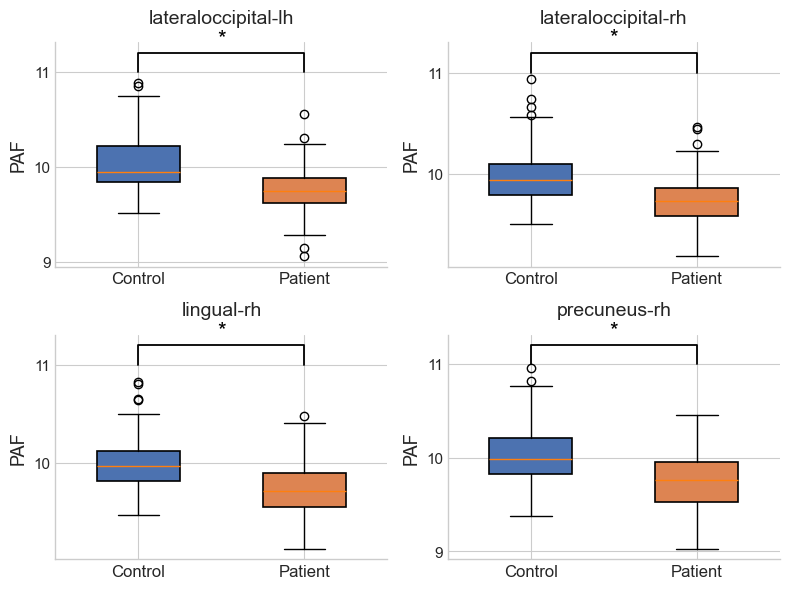

In [107]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

plt.style.use('seaborn-v0_8-whitegrid')

colors = ['#4C72B0', '#DD8452']  # control: blue, patient: orange

fig, axes = plt.subplots(2, int(len(PAF_good_positive_areas)/2), figsize=(8, 6))
axes = axes.flatten()

for n, (area, ax, lbl) in enumerate(zip(PAF_good_positive_areas, axes, PAF_good_positive_labels)):
    data = [PAF_C_all[n], PAF_P_all[n]]
    
    # Boxplot with custom colors
    box = ax.boxplot(data, patch_artist=True, widths=0.5, notch=False)
    for patch, color in zip(box['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_edgecolor('black')
        patch.set_linewidth(1.2)
    
    title = lbl.name
    ax.set_title(title, fontsize=14, pad=14)
    ax.set_ylabel('PAF', fontsize=13)
    ax.set_xticklabels(['Control', 'Patient'], fontsize=12)
    ax.set_yticks(np.arange(9, 13))
    ax.tick_params(axis='y', labelsize=11)
    
    # Stats
    st, pval = stats.ttest_ind(PAF_P_all[n], PAF_C_all[n])
    mean_patient = np.mean(PAF_P_all[n])
    mean_control = np.mean(PAF_C_all[n])
    sd_patient = np.std(PAF_P_all[n], ddof=1)
    sd_control = np.std(PAF_C_all[n], ddof=1)
    n_patient = len(PAF_P_all[n])
    n_control = len(PAF_C_all[n])
    pooled_sd = np.sqrt(((n_patient - 1) * sd_patient**2 + (n_control - 1) * sd_control**2) / (n_patient + n_control - 2))
    cohens_d = (mean_patient - mean_control) / pooled_sd
    df = n_patient + n_control - 2
    
    # Print summary
    print(f"{title} - Control mean = {mean_control:.3f}, Patient mean = {mean_patient:.3f}")
    print(f"t({df}) = {st:.3f}, p = {pval:.3f}, Cohen's d = {cohens_d:.3f}")
    
    # Significance annotation
    if pval < 0.05:
        x1, x2 = 1, 2
        y, h, col = 11, 0.2, 'k'
        ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=1.3, c=col)
        ax.text((x1 + x2) * .5, y + h + 0.05, "*", ha='center', va='bottom', color=col, fontsize=16)

    # Clean up spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


Clinical Correlation

In [ ]:
fl, fh=8,12

C_stcs_all = []
PAF_C_all = []
PAF_C_power_all=[]
for stc in control_stc_all:   
    C_stcs = []
    PAF_C=[]
    PAF_C_power=[]
    
    for lbl in labels:
        stc = stc.copy().crop(f1, f2)
        C_stcs.append(stc.in_label(lbl))
        PAF_C.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        PAF_C_power.append(stc.in_label(lbl).crop(fl, fh).data.max())

    C_stcs_all.append(C_stcs)
    PAF_C_all.append(PAF_C)
    PAF_C_power_all.append(PAF_C_power)
    
P_stcs_all = []
PAF_P_all = []
PAF_P_power_all=[]
for stc in patient_stc_all:
    P_stcs = []
    PAF_P=[]
    PAF_P_power=[]
    for lbl in labels:
        stc = stc.copy().crop(f1, f2)
        P_stcs.append(stc.in_label(lbl))
        PAF_P.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        PAF_P_power.append(stc.in_label(lbl).crop(fl, fh).data.max())

    P_stcs_all.append(P_stcs)
    PAF_P_all.append(PAF_P)
    PAF_P_power_all.append(PAF_P_power)

C_stcs_all = np.array(C_stcs_all).T
PAF_C_all = np.array(PAF_C_all).T
c = np.array(PAF_C_power_all).T
P_stcs_all = np.array(P_stcs_all).T
PAF_P_all = np.array(PAF_P_all).T
PAF_P_power_all = np.array(PAF_P_power_all).T

In [ ]:
PAF_C_power_all.shape

In [ ]:
pain_power_indx=[]
for n in range(len(labels)):
    stats,p_val = pearsonr(PAF_P_power_all[n][:-2],list(pain_rating.values()))
    if p_val<0.05:
        pain_power_indx.append(n)

fig, ax = plt.subplots(1,len(pain_power_indx), figsize=(3.6*len(pain_power_indx),3))
PAF_power_label = []
if len(pain_power_indx)>1:
    for n in range(len(pain_power_indx)):
        ax[n].scatter(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
        ax[n].set_title(labels[pain_power_indx[n]].name)
        ax[n].set_xlabel("PAF Power (a.u.)",fontsize=14)
        ax[n].set_ylabel("Pain Ratings",fontsize=14)

        print(labels[pain_power_indx[n]].name)
        PAF_power_label.append(labels[pain_power_indx[n]])
        
        PAF_power_area.append(stcs_in_label[n])

        #obtain m (slope) and b(intercept) of linear regression line
        m, b = np.polyfit(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()), 1)

        #add linear regression line to scatterplot 
        ax[n].plot(PAF_P_power_all[pain_power_indx[n]][:-2], m*PAF_P_power_all[pain_power_indx[n]][:-2]+b)

        stats,p_val = pearsonr(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
        print(stats)
        print(p_val)
        
        
elif len(pain_power_indx)==1:
    n=0
    ax.scatter(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
    ax.set_title(labels[pain_power_indx[n]].name)
    ax.set_xlabel("PAF Power (a.u.)",fontsize=14)
    ax.set_ylabel("Pain Ratings",fontsize=14)

    print(labels[pain_power_indx[n]].name)
    PAF_power_label.append(labels[pain_power_indx[n]])

    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()), 1)

    #add linear regression line to scatterplot 
    ax.plot(PAF_P_power_all[pain_power_indx[n]][:-2], m*PAF_P_power_all[pain_power_indx[n]][:-2]+b)

    stats,p_val = pearsonr(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
    print(stats)
    print(p_val)

In [ ]:
pain_indx=[]
for n in range(len(labels)):
    stats,p_val = pearsonr(PAF_P_all[n][:-2],list(pain_rating.values()))
    if p_val<0.05:
        pain_indx.append(n)        

fig, ax = plt.subplots(1,len(pain_indx), figsize=(3.6*len(pain_indx),3))


if len(pain_indx)>1:

    for n in range(len(pain_indx)):
        ax[n].scatter(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
        ax[n].set_title(labels[pain_indx[n]].name)
        ax[n].set_xlabel("PAF (Hz)",fontsize=14)
        ax[n].set_ylabel("Pain Ratings",fontsize=14)    
        print(labels[pain_indx[n]].name)

        #obtain m (slope) and b(intercept) of linear regression line
        m, b = np.polyfit(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()), 1)

        #add linear regression line to scatterplot 
        ax[n].plot(PAF_P_all[pain_indx[n]][:-2], m*PAF_P_all[pain_indx[n]][:-2]+b)


        stats,p_val = pearsonr(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
        print(stats)
        print(p_val)

elif len(pain_indx)==1:
    n=0
    ax.scatter(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
    ax.set_title(labels[pain_indx[n]].name)
    ax.set_xlabel("PAF (Hz)",fontsize=14)
    ax.set_ylabel("Pain Ratings",fontsize=14)    
    print(labels[pain_indx[n]].name)
  
    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()), 1)

    #add linear regression line to scatterplot 
    ax.plot(PAF_P_all[pain_indx[n]][:-2], m*PAF_P_all[pain_indx[n]][:-2]+b)
    
    
    stats,p_val = pearsonr(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
    print(stats)
    print(p_val)    

    
    
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.4)
plt.show()

In [ ]:
PAF_P_all[8].shape

In [ ]:
labels[7]

In [ ]:
n = 7
stats,p_val = pearsonr(PAF_P_all[n][:-2],list(pain_rating.values()))
    
plt.scatter(PAF_P_all[n][:-2],list(pain_rating.values()))


#obtain m (slope) and b(intercept) of linear regression line
m, b = np.polyfit(PAF_P_all[n][:-2],list(pain_rating.values()), 1)

#add linear regression line to scatterplot 
plt.plot(PAF_P_all[n][:-2], m*PAF_P_all[n][:-2]+b)


stats,p_val = pearsonr(PAF_P_all[n][:-2],list(pain_rating.values()))
print(stats)
print(p_val)

In [ ]:
data = {'bankssts_left': 1.1,
 'caudalanteriorcingulate_left': 1.0,
 'caudalmiddlefrontal_left': 2.6,
 'cuneus_left': 2.6,
 'entorhinal_left': 0.6}

In [ ]:
import ggseg
ggseg.plot_dk(data, cmap='Spectral', figsize=(15,15),
              background='k', edgecolor='w', bordercolor='gray',
              ylabel='Cortical thickness (mm)', title='Title of the figure')

# Clinical Correlation with glm model

In [ ]:
PAF_Power_P_all=[]
PAF_P_all=[]
PAF_P_stcs = []
PAF_Power_P_stcs = []

Alpha_Power_P_all = []


fl, fh = 8,12

sub_with_MRI= ["PASP001", "PASP002", "PASP004","PASP014", "PASP017", "PASP019", 
                "PASP020", "PASP021", "PASP022","PASP023", "PASP028", "PASP029", 
                "PASP030", "PASP031", "PASP033"]

for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in sub_with_MRI:
        psd_dir = "E:/Morphed_Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    else:
        psd_dir = "E:/Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)

    #PAF_Power = stc.data.max(axis=1)
    #PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])

    #PAF = stc.times[stc.data.argmax(axis=1)]
    #PAF = PAF.reshape([PAF.shape[0],1])
    
    #COG corrected PAF
    Avg_alpha = stc.data.mean(axis=1)
    PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source

    PAF_Power = [] #calculate the PAF power for each source
    for i, paf in enumerate(PAF):
        PAF_Power.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

    PAF_Power = np.array(PAF_Power)

    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    Avg_alpha = mne.SourceEstimate(Avg_alpha,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")

    PAF_Power_P_all.append(PAF_Power)
    PAF_P_all.append(PAF)
    PAF_Power_P_stcs.append(PAF_Power.data)
    PAF_P_stcs.append(PAF.data)
    Alpha_Power_P_all.append(Avg_alpha.data)

    #PAF_Power_P.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF_P.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)
    Avg_alpha.save('E:/GLM_SPM/Avg_alpha/'+sub+'_Avg_alpha',overwrite=True)
    
PAF_Power_P_stcs = np.rollaxis(np.array(PAF_Power_P_stcs),2,1)
PAF_P_stcs =  np.rollaxis(np.array(PAF_P_stcs),2,1)
Alpha_Power_P_all = np.array(Alpha_Power_P_all)
    #PAF_Power_P.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF_P.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)



In [ ]:
Alpha_Power_P_all.shape

In [ ]:
pain_ratings = np.array(list(pain_rating.values()))  # Assuming this is defined
pain_ratings = pain_ratings[:27]
data = PAF_Power_P_stcs.reshape(PAF_Power_P_stcs.shape[0],PAF_Power_P_stcs.shape[2])

data_matrix = data = data[0:-2,:]  # Shape: (27, n_vertices, n_timepoints)

X = np.column_stack((pain_ratings, np.ones(len(pain_ratings))))  # Add intercept term


In [ ]:
data_matrix.shape

In [ ]:
# Prepare to store results
betas = []
p_values = []

# Iterate over each vertex
for vertex in range(data_matrix.shape[1]):
    y = data_matrix[:, vertex]  # Dependent variable
    model = sm.OLS(y, X)  # Create OLS model
    results = model.fit()  # Fit the model
    
    betas.append(results.params[0])  # Store the coefficient for the pain ratings
    p_values.append(results.pvalues[0])  # Store the p-value
# Convert results to arrays
betas = np.array(betas)
p_values = np.array(p_values)

In [ ]:
# Step 4: Cluster-based permutation test
def cluster_permutation_test(betas, n_permutations=1000):
    # Perform a one-sample t-test
    t_stat, clusters, cluster_p_values, _ = mne.stats.permutation_cluster_1samp_test(
        betas[None, :], n_permutations=n_permutations, threshold=None, tail=1
    )
    return t_stat, clusters, cluster_p_values

t_stat, clusters, cluster_p_values = cluster_permutation_test(betas)

In [ ]:
betas.shape

In [ ]:
stc.data = betas[:,None]

In [ ]:
stc_significant = stc
brain = stc_significant.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

In [ ]:
from statsmodels.stats.multitest import multipletests

# Bonferroni correction
_, corrected_p_values, _, _ = multipletests(p_values, method='bonferroni')

# Or use FDR
#_, corrected_p_values, _, _ = multipletests(p_values, method='fdr_bh')


In [ ]:
from sklearn.utils import shuffle

# Example data
num_subjects = 27
num_regions = 20484  # Number of brain regions or vertices
source_estimates =  data_matrix # Simulated source estimates

# Create a DataFrame for the GLM
data = pd.DataFrame(source_estimates, columns=[f'Region_{i+1}' for i in range(num_regions)])
data['Pain'] = pain_ratings

In [ ]:
def glm_permutation_test(data):
    observed_pvals = []
    for region in data.columns[:-1]:  # Exclude the pain ratings column
        # Fit the GLM
        X = sm.add_constant(data['Pain'])  # Add constant for intercept
        model = sm.OLS(data[region], X).fit()
        p_value = model.pvalues[1]  # p-value for the 'Pain' predictor
        observed_pvals.append(p_value)

    observed_pvals = np.array(observed_pvals)
    return observed_pvals

# Run the permutation test
observed_pvals = glm_permutation_test(data)

# Results
print("Observed p-values:", observed_pvals)



In [ ]:
# Initialize permutation p-values
n_permutations=1000
permutation_pvals = np.zeros((n_permutations, num_regions))


for perm in range(n_permutations):
    shuffled_pain = shuffle(data['Pain'])
    for i, region in enumerate(data.columns[:-1]):
        print(data[region])
        X_perm = sm.add_constant(shuffled_pain)
        print(np.array(X_perm))
        model_perm = sm.OLS(data[region], np.array(X_perm)).fit()
        permutation_pvals[perm, i] = model_perm.pvalues[1]


    # Calculate empirical p-values
    empirical_pvals = np.mean(permutation_pvals < observed_pvals, axis=0)  

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.802762
1     1.271892
2     0.663006
3     0.835873
4     1.842731
5     1.756944
6     3.632730
7     0.683076
8     0.945459
9     0.541609
10    5.062982
11    3.389853
12    1.548775
13    1.471614
14    1.412774
15    2.107885
16    1.179439
17    2.201958
18    0.863996
19    1.289770
20    0.561175
21    1.029077
22    2.910410
23    2.772733
24    1.464592
25    1.877748
26    0.553493
Name: Region_306, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]


0     1.843876
1     1.711474
2     0.885309
3     0.803389
4     1.551603
5     1.339181
6     1.426001
7     0.892475
8     0.684000
9     0.584935
10    1.944340
11    6.445158
12    2.456337
13    1.792771
14    1.486342
15    1.352412
16    1.297221
17    1.351910
18    0.653523
19    1.594090
20    0.611103
21    0.719837
22    2.223755
23    1.496976
24    1.458760
25    1.906394
26    0.606178
Name: Region_352, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.926448
1     0.738604
2     0.899885
3     0.809461
4     1.326083
5     1.554553
6     1.598049
7     0.892848
8     0.762376
9     0.637716
10    2.047313
11    6.258826
12    2.407420
13    1.730102
14    1.496373
15    1.793799
16    1.093208
17    1.4

0     1.045246
1     0.508870
2     0.784484
3     0.852042
4     1.486045
5     1.626601
6     0.807042
7     0.538961
8     0.693026
9     0.909175
10    1.940274
11    1.513994
12    1.420949
13    0.984937
14    0.752162
15    1.164831
16    1.538294
17    0.765962
18    0.701142
19    0.667106
20    0.776958
21    0.269019
22    1.090341
23    3.526342
24    1.437436
25    2.321920
26    0.734057
Name: Region_404, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.148187
1     1.276807
2     0.673310
3     1.150657
4     2.604062
5     1.850973
6     0.942166
7     0.411350
8     0.932881
9     0.534811
10    3.403898
11    2.106290
12    1.562076
13    0.966708
14    0.778736
15    1.340140
16    1.142558
17    1.0

0     1.195862
1     0.843268
2     0.655733
3     0.970434
4     0.933405
5     1.769506
6     1.342022
7     0.586094
8     0.954710
9     0.817991
10    2.384374
11    2.635134
12    1.529060
13    1.308353
14    1.482369
15    1.613484
16    1.158770
17    2.584876
18    0.692608
19    0.838227
20    0.516713
21    0.789762
22    2.453293
23    3.171716
24    1.033275
25    0.878773
26    0.574425
Name: Region_450, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.715865
1     0.831838
2     0.948906
3     0.813938
4     2.642719
5     2.483001
6     2.325293
7     0.722560
8     1.066474
9     0.855714
10    3.153526
11    2.614754
12    1.505146
13    1.045766
14    1.342006
15    1.702438
16    1.349274
17    2.5

0     0.693148
1     0.507688
2     0.457898
3     0.529967
4     0.390742
5     0.644791
6     0.396584
7     0.524847
8     0.484398
9     0.437087
10    0.547343
11    0.702734
12    0.737676
13    0.944287
14    0.544026
15    0.922592
16    0.837017
17    0.508557
18    0.501342
19    0.625284
20    0.400262
21    0.501267
22    0.406783
23    0.614783
24    0.507890
25    0.567248
26    0.388429
Name: Region_499, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.885180
1     0.559291
2     0.507551
3     0.506687
4     0.418247
5     0.437717
6     0.690449
7     0.393883
8     0.462788
9     0.344621
10    0.537802
11    0.694759
12    0.761678
13    0.817398
14    0.591840
15    1.039382
16    0.831600
17    0.6

0     0.535432
1     0.718059
2     0.804210
3     0.567639
4     1.171664
5     1.235270
6     0.715572
7     0.468221
8     0.749828
9     0.594582
10    1.411565
11    1.919017
12    0.666372
13    1.098540
14    1.118964
15    1.277735
16    1.465441
17    1.079386
18    0.578782
19    0.889516
20    0.847115
21    0.256795
22    1.674913
23    1.736708
24    0.986703
25    2.035653
26    0.830265
Name: Region_548, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.551445
1     0.589032
2     0.672087
3     0.518316
4     1.592418
5     1.083255
6     0.712096
7     0.587569
8     0.752069
9     0.781554
10    1.181902
11    1.322436
12    0.744011
13    1.186596
14    1.040592
15    1.379844
16    1.405473
17    0.7

0     1.512647
1     0.505558
2     0.636198
3     0.880190
4     1.634994
5     1.647521
6     3.415850
7     0.834415
8     0.727923
9     0.640962
10    2.140562
11    4.112109
12    1.076333
13    1.810910
14    1.451764
15    1.283597
16    1.082337
17    2.289066
18    0.860790
19    0.979988
20    0.550813
21    1.219811
22    1.900054
23    2.225307
24    0.562214
25    1.202113
26    0.671899
Name: Region_595, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.552599
1     0.914337
2     0.833315
3     1.231915
4     2.373096
5     1.485845
6     4.693677
7     0.577140
8     1.140610
9     0.804846
10    2.690473
11    5.729504
12    2.862182
13    1.754489
14    2.530923
15    1.509162
16    1.135002
17    3.0

0     2.180512
1     0.693023
2     1.109167
3     0.746147
4     1.969596
5     1.635707
6     1.140809
7     0.685950
8     0.927394
9     0.802409
10    2.497464
11    2.004251
12    1.126058
13    0.756655
14    1.097005
15    1.396301
16    1.489259
17    0.905088
18    0.799542
19    1.234194
20    0.958217
21    0.439732
22    1.629152
23    3.758746
24    1.479523
25    2.262289
26    0.766474
Name: Region_638, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.422112
1     1.064236
2     0.932855
3     0.563804
4     1.663123
5     1.333960
6     1.300988
7     0.800584
8     0.927073
9     0.835940
10    3.234663
11    2.352302
12    1.282526
13    1.202691
14    1.504656
15    1.770305
16    1.366448
17    0.9

0     1.488099
1     0.908609
2     0.909852
3     0.646019
4     1.689981
5     1.043314
6     4.589966
7     0.774725
8     0.901480
9     0.564597
10    3.208762
11    3.958001
12    1.346344
13    1.387695
14    2.055259
15    1.782956
16    0.771737
17    1.375352
18    0.588956
19    1.868377
20    0.551614
21    0.868873
22    2.367430
23    2.601831
24    0.998061
25    2.330488
26    0.621992
Name: Region_689, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.740115
1     0.804270
2     0.689488
3     1.301901
4     2.433272
5     2.295858
6     3.372838
7     0.717144
8     0.844697
9     0.793319
10    3.695360
11    6.023554
12    4.114948
13    1.038148
14    2.143522
15    1.334798
16    1.825115
17    3.5

0     0.567646
1     0.501225
2     0.790830
3     0.641270
4     0.637016
5     0.709900
6     0.548249
7     0.503575
8     0.466348
9     0.687649
10    1.027074
11    0.959252
12    0.528009
13    0.951470
14    0.564456
15    1.519238
16    0.930695
17    0.544611
18    0.400581
19    0.465549
20    0.645181
21    0.180635
22    0.566364
23    0.920082
24    0.683536
25    0.723695
26    0.554940
Name: Region_745, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.648679
1     0.490417
2     0.727011
3     0.453143
4     0.580980
5     0.570836
6     0.630123
7     0.368224
8     0.538410
9     0.530857
10    0.791863
11    0.526440
12    0.392730
13    0.613185
14    0.578076
15    0.961535
16    0.818673
17    0.5

0     1.993733
1     0.611695
2     0.408200
3     1.129156
4     0.919710
5     1.201796
6     0.875149
7     0.586997
8     0.394077
9     0.512619
10    3.161570
11    1.375700
12    1.609575
13    1.294945
14    2.132076
15    1.220978
16    1.456644
17    0.821799
18    0.796353
19    1.017508
20    0.615887
21    0.487724
22    0.964469
23    3.028585
24    0.814587
25    0.897361
26    0.646228
Name: Region_788, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.664657
1     0.649502
2     0.449871
3     0.898703
4     1.326424
5     1.048186
6     0.692084
7     0.636045
8     0.474052
9     0.454856
10    3.545965
11    1.280055
12    2.010190
13    1.584876
14    1.914367
15    1.162157
16    1.662483
17    1.0

0     1.048848
1     0.524847
2     0.646495
3     0.520275
4     0.831334
5     0.994237
6     0.764012
7     0.446681
8     0.717851
9     0.712141
10    1.848284
11    2.047771
12    0.691882
13    2.367977
14    0.989307
15    1.774335
16    0.936877
17    1.170362
18    0.610328
19    0.507108
20    0.399333
21    0.917284
22    0.787392
23    3.008152
24    0.552085
25    1.302117
26    0.782820
Name: Region_835, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.524257
1     0.634230
2     0.714533
3     0.591577
4     0.957933
5     1.076742
6     1.141854
7     0.605542
8     0.547929
9     0.719579
10    2.063461
11    2.023081
12    0.773871
13    2.231784
14    1.428405
15    1.723394
16    0.972829
17    0.9

0     0.511574
1     0.479012
2     0.464781
3     0.511682
4     0.482770
5     0.647050
6     0.790144
7     0.555511
8     0.404445
9     0.882980
10    0.971878
11    0.914067
12    0.493095
13    0.947093
14    0.921943
15    0.881240
16    0.831255
17    0.801687
18    0.442777
19    0.757426
20    0.457812
21    0.371998
22    0.548600
23    0.572231
24    0.484951
25    0.573807
26    0.371857
Name: Region_882, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.549271
1     0.495618
2     0.623856
3     0.481370
4     0.500866
5     0.537098
6     1.266055
7     0.505012
8     0.487299
9     0.823686
10    0.987665
11    0.780006
12    0.504303
13    1.065243
14    0.819778
15    1.233833
16    0.701294
17    0.5

0     1.894545
1     1.664479
2     0.990968
3     1.291989
4     2.413816
5     1.991506
6     1.930868
7     0.672467
8     0.665500
9     0.439000
10    2.119071
11    4.804965
12    3.339389
13    1.606305
14    2.430503
15    1.720627
16    1.311548
17    2.558064
18    0.681985
19    1.215352
20    0.676305
21    1.861687
22    1.726950
23    5.737988
24    1.461242
25    0.888330
26    0.775171
Name: Region_935, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.485063
1     1.106071
2     1.071486
3     1.267557
4     2.957392
5     2.861696
6     2.231511
7     0.850224
8     0.509166
9     0.541812
10    2.205639
11    4.128500
12    1.498271
13    0.979574
14    2.003338
15    1.601587
16    1.647757
17    1.5

0     3.311667
1     0.797698
2     0.921805
3     1.032172
4     2.835631
5     2.578270
6     2.736013
7     0.744179
8     1.154637
9     0.740655
10    3.081213
11    2.875918
12    1.923385
13    1.785085
14    1.205936
15    1.707598
16    1.343947
17    3.048468
18    0.646566
19    1.818051
20    0.614658
21    0.594718
22    2.112666
23    3.784960
24    1.510192
25    2.399737
26    0.691715
Name: Region_988, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.967061
1     1.375699
2     0.806388
3     1.031158
4     1.670337
5     2.358728
6     1.736502
7     0.983119
8     1.264528
9     0.740953
10    3.246807
11    6.376247
12    6.946536
13    1.077902
14    0.968620
15    1.752370
16    1.454723
17    2.3

0     0.679753
1     0.513822
2     0.435988
3     0.493880
4     0.939265
5     0.768197
6     0.382508
7     0.375129
8     0.384117
9     0.636348
10    2.968204
11    1.070937
12    0.424639
13    1.189788
14    0.567200
15    1.383092
16    1.177247
17    0.766064
18    0.680087
19    0.853389
20    0.379220
21    0.337841
22    0.406473
23    1.280682
24    0.478382
25    0.392691
26    0.596539
Name: Region_1046, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.763376
1     0.515262
2     0.500593
3     0.492843
4     1.354060
5     0.837793
6     0.536820
7     0.357474
8     0.369036
9     0.807098
10    1.482099
11    1.281355
12    0.531232
13    1.280577
14    0.474529
15    1.379152
16    0.980144
17    1.

0     0.780501
1     0.557154
2     0.411356
3     0.383764
4     0.681353
5     0.555004
6     0.611845
7     0.396180
8     0.510222
9     0.617354
10    0.591521
11    0.779308
12    0.404839
13    1.371391
14    0.655032
15    1.019565
16    1.083355
17    0.590441
18    0.484797
19    0.371750
20    0.479247
21    0.505549
22    0.419288
23    0.536833
24    0.662869
25    0.415411
26    0.451272
Name: Region_1089, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.640388
1     0.543106
2     0.352084
3     0.444202
4     0.523157
5     0.756778
6     0.539608
7     0.372171
8     0.461337
9     0.604698
10    0.624223
11    0.969032
12    0.591926
13    1.158922
14    0.785203
15    1.472955
16    0.954415
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.671926
1     0.501731
2     0.495539
3     0.507899
4     0.482394
5     0.524839
6     0.691909
7     0.362628
8     0.456834
9     0.560316
10    1.104484
11    0.942683
12    0.889549
13    0.505988
14    0.494576
15    0.625138
16    0.760775
17    0.556005
18    0.460945
19    0.458642
20    0.483438
21    0.326322
22    0.603288
23    0.567205
24    0.450329
25    0.748757
26    0.420687
Name: Region_1137, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.977015
1     0.484199
2     0.793178
3     0.467436
4     0.817238
5     0.828226
6     1.232735
7     0.493405
8     0.530654
9     0.705538
10    1.256366
11    1.017869
12    1.144849
13    0.867149
14    1.404942
15    1.728594
16    0.939291
17    0.769542
18    0.593275
19    0.458820
20    0.656420
21    0.176021
22    0.748834
23    2.307692
24    0.711569
25    1.176017
26    0.459594
Name: Region_1190, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.867508
1     0.555148
2     0.761331
3     0.465578
4     0.713846
5     0.806642
6     1.104575
7     0.512946
8     0.503527
9     0.634981
10    1.170450
11    0.992898
12    0.976294
13    0.917382
14    1.139227
15    1.703763
16    0.946840
17    0.

0     1.298278
1     0.928644
2     0.640550
3     1.119396
4     2.198293
5     1.813079
6     0.879889
7     0.526812
8     0.912744
9     0.451278
10    3.476196
11    1.854667
12    1.206587
13    0.922239
14    1.025453
15    1.635939
16    1.075171
17    3.296542
18    0.929134
19    0.718061
20    0.565765
21    0.630083
22    1.893950
23    1.948631
24    0.819158
25    0.913134
26    0.616992
Name: Region_1246, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.268881
1     0.791127
2     0.650858
3     0.825792
4     2.011699
5     1.873716
6     1.111379
7     0.524555
8     0.818635
9     0.483054
10    3.236036
11    1.847453
12    1.136695
13    0.902396
14    1.073035
15    1.331882
16    1.168239
17    3.

0     2.947526
1     1.371694
2     0.494884
3     1.312437
4     1.484069
5     1.686700
6     1.362571
7     0.531495
8     0.497200
9     0.595046
10    3.121566
11    2.240021
12    2.767676
13    1.530408
14    3.250130
15    1.383442
16    1.487893
17    1.993242
18    0.916428
19    1.059187
20    0.538339
21    0.641569
22    3.658209
23    6.204241
24    1.580262
25    1.098385
26    0.603864
Name: Region_1292, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     4.803369
1     0.881741
2     0.659653
3     0.960900
4     2.059804
5     1.848930
6     0.877101
7     0.462430
8     0.813038
9     0.662512
10    2.989244
11    2.846028
12    2.397969
13    1.550007
14    2.354806
15    1.916388
16    2.401750
17    2.

0     1.251085
1     0.560543
2     0.821863
3     0.471038
4     1.550628
5     1.135172
6     2.890882
7     0.725595
8     0.881835
9     0.587723
10    2.440074
11    2.325125
12    2.056795
13    1.050627
14    1.218726
15    2.087363
16    1.129245
17    0.975889
18    0.633551
19    0.901738
20    0.858504
21    0.121768
22    0.724090
23    1.452544
24    1.009224
25    1.575011
26    0.505793
Name: Region_1337, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.187582
1     0.536537
2     0.944835
3     0.423600
4     1.513336
5     1.277314
6     2.708188
7     0.667295
8     0.736528
9     0.679447
10    2.061667
11    3.398925
12    1.216866
13    1.325684
14    1.404270
15    1.769620
16    1.646295
17    1.

0     0.953893
1     0.489437
2     0.581922
3     0.497914
4     0.642886
5     0.774529
6     1.069571
7     0.753671
8     0.486438
9     1.191825
10    1.996080
11    1.651033
12    0.486282
13    1.282067
14    0.698384
15    1.864278
16    0.611052
17    0.553969
18    0.526573
19    0.551681
20    0.667077
21    0.239264
22    0.431470
23    0.929364
24    1.043977
25    1.435068
26    0.954284
Name: Region_1392, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.665692
1     0.474217
2     0.696002
3     0.534937
4     0.707231
5     0.760984
6     1.530822
7     0.809239
8     0.754090
9     1.828279
10    1.988532
11    2.045353
12    0.602731
13    1.131589
14    0.709258
15    1.736957
16    1.253327
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.786011
1     0.748736
2     0.424386
3     0.574985
4     0.830173
5     0.862856
6     0.425856
7     0.461946
8     0.513903
9     1.100323
10    1.089915
11    1.525744
12    0.431189
13    1.146513
14    0.551510
15    1.059204
16    1.630296
17    0.510346
18    0.641185
19    0.545277
20    0.505436
21    0.500160
22    0.599743
23    0.983111
24    0.847234
25    0.527307
26    0.635397
Name: Region_1451, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.538930
1     0.601207
2     0.543091
3     0.540238
4     1.083525
5     1.143142
6     0.755770
7     0.435964
8     0.615339
9     0.499459
10    1.076975
11    2.293999
12    0.742732
13    0.966448
14    0.992700
15    1.976206
16    1.225620
17    1.886662
18    0.762552
19    0.659951
20    0.467385
21    0.458382
22    0.705219
23    1.217676
24    0.792699
25    1.074743
26    0.592038
Name: Region_1504, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.310264
1     0.668611
2     0.488722
3     0.562314
4     0.928175
5     0.904476
6     0.599717
7     0.435982
8     0.600093
9     0.657372
10    0.951519
11    2.186075
12    0.499905
13    1.165479
14    1.026366
15    1.440928
16    1.441327
17    0.

0     0.707963
1     0.480312
2     0.417838
3     0.418670
4     0.648431
5     0.592284
6     0.620029
7     0.373295
8     0.643142
9     0.419832
10    0.954934
11    0.894623
12    0.788275
13    1.413409
14    0.527311
15    0.844504
16    1.151966
17    0.525339
18    0.469630
19    0.446181
20    0.506274
21    0.362580
22    0.398455
23    0.679678
24    0.543643
25    0.411724
26    0.499314
Name: Region_1539, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.663286
1     0.507171
2     0.408570
3     0.424271
4     0.613089
5     0.544539
6     0.587404
7     0.419407
8     0.642994
9     0.417824
10    0.684474
11    0.857814
12    0.731023
13    1.207171
14    0.529200
15    0.958648
16    1.146878
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.651828
1     0.445328
2     0.442611
3     0.443854
4     0.577938
5     0.639880
6     0.714620
7     0.518553
8     0.601773
9     0.487004
10    0.602370
11    0.575517
12    0.534173
13    1.106437
14    0.436770
15    1.186603
16    0.918523
17    0.432999
18    0.519906
19    0.454197
20    0.451698
21    0.477419
22    0.424028
23    0.453975
24    0.492135
25    0.631122
26    0.362506
Name: Region_1589, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.954780
1     0.560541
2     0.596903
3     0.829270
4     1.502473
5     1.663345
6     1.269876
7     0.705367
8     0.671338
9     1.060902
10    1.754896
11    2.312343
12    2.461954
13    0.915688
14    1.001389
15    1.657960
16    1.759039
17    0.824802
18    0.787746
19    0.946442
20    0.944687
21    0.273430
22    2.132786
23    4.275526
24    1.529492
25    2.558122
26    0.722064
Name: Region_1642, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.134406
1     0.437682
2     0.715005
3     0.783504
4     1.344091
5     1.154233
6     0.568359
7     0.484487
8     0.578430
9     0.749237
10    1.418946
11    2.124786
12    0.452367
13    1.026053
14    0.760328
15    1.526394
16    1.252221
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.541353
1     1.199648
2     0.918616
3     1.149279
4     2.135679
5     2.141903
6     3.504920
7     0.630152
8     0.747748
9     0.610904
10    2.508766
11    5.329351
12    3.406557
13    1.579002
14    3.335860
15    1.667817
16    1.784687
17    3.515436
18    0.972615
19    1.793305
20    0.602046
21    0.951878
22    2.734308
23    6.053692
24    2.735456
25    1.232734
26    0.907592
Name: Region_1692, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.560067
1     0.520361
2     1.218906
3     0.413407
4     0.770692
5     0.897239
6     0.571429
7     0.597642
8     0.558673
9     0.630213
10    1.099767
11    1.064467
12    0.828066
13    0.983581
14    0.741356
15    1.564776
16    0.965007
17    0.587000
18    0.361575
19    0.830339
20    0.810640
21    0.151574
22    0.528803
23    0.837288
24    0.980246
25    1.181237
26    0.689436
Name: Region_1750, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.625327
1     0.571080
2     1.312680
3     0.402011
4     0.602873
5     1.136658
6     0.588233
7     0.599901
8     0.732898
9     0.642288
10    1.563455
11    1.223050
12    0.850424
13    1.049962
14    0.726878
15    1.696830
16    0.924409
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.763759
1     0.508213
2     0.501042
3     0.461927
4     0.469666
5     0.475531
6     0.553194
7     0.396229
8     0.519796
9     0.557715
10    1.249735
11    0.979005
12    0.456924
13    0.973830
14    0.663414
15    0.999234
16    0.993049
17    0.627033
18    0.527951
19    0.522750
20    0.474800
21    0.204858
22    0.870434
23    0.572591
24    0.508589
25    0.901757
26    0.531763
Name: Region_1807, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.540552
1     0.517173
2     0.275582
3     0.443639
4     0.720798
5     0.734382
6     0.444722
7     0.360388
8     0.665296
9     0.771770
10    0.581882
11    1.275745
12    0.527988
13    1.423318
14    0.543983
15    1.008455
16    1.406448
17    0.827842
18    0.533235
19    0.416217
20    0.489722
21    0.422304
22    0.378021
23    0.466277
24    0.572815
25    0.474061
26    0.516766
Name: Region_1851, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.598532
1     0.484780
2     0.318153
3     0.474206
4     0.728735
5     0.658523
6     0.419740
7     0.350049
8     0.703930
9     0.670096
10    0.618381
11    1.318829
12    0.654498
13    1.531676
14    0.694583
15    0.956866
16    0.973676
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.929104
1     0.537617
2     0.532600
3     0.756073
4     0.998429
5     1.196384
6     0.660296
7     0.392916
8     0.680754
9     0.696835
10    1.338127
11    0.889925
12    0.336798
13    0.974059
14    0.746929
15    1.582009
16    1.371568
17    1.012020
18    0.725785
19    0.589278
20    0.769162
21    0.243537
22    0.923136
23    1.785872
24    1.206037
25    1.436822
26    0.939186
Name: Region_1898, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     3.266991
1     0.783238
2     1.037375
3     1.345421
4     3.067215
5     2.118413
6     2.540974
7     0.702797
8     0.529575
9     0.524723
10    3.590634
11    4.403393
12    1.490123
13    0.957127
14    1.781292
15    1.586671
16    1.780707
17    2.239197
18    1.097317
19    1.192919
20    0.546561
21    1.655938
22    2.384346
23    5.806392
24    1.417320
25    1.312998
26    0.651716
Name: Region_1934, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.262526
1     0.888659
2     0.985493
3     1.515338
4     3.336779
5     2.503641
6     2.571722
7     0.687648
8     0.741441
9     0.525449
10    4.207136
11    3.703141
12    1.202117
13    1.109544
14    1.590879
15    1.607777
16    1.800889
17    2.

0     0.836865
1     0.538022
2     0.804617
3     0.402043
4     0.835540
5     0.854275
6     1.098353
7     0.663732
8     1.203159
9     0.607646
10    0.814267
11    2.795067
12    0.597511
13    0.951934
14    0.779552
15    1.215603
16    0.968050
17    0.649861
18    0.584568
19    0.601243
20    0.544342
21    0.285065
22    0.722502
23    1.233505
24    0.771593
25    1.679087
26    0.584414
Name: Region_1984, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.869654
1     0.457116
2     0.789749
3     0.397730
4     0.779564
5     0.881078
6     1.133250
7     0.954569
8     1.146361
9     0.646471
10    1.123010
11    1.520283
12    0.598866
13    1.311643
14    0.673554
15    1.298939
16    1.135773
17    0.

0     0.614486
1     0.479413
2     0.488239
3     0.418231
4     0.483745
5     0.445480
6     0.460156
7     0.563546
8     0.494645
9     0.466587
10    0.728747
11    1.406153
12    0.643868
13    0.920581
14    0.505309
15    1.408200
16    0.991414
17    0.700187
18    0.431800
19    0.700745
20    0.377557
21    0.405848
22    0.445142
23    0.594497
24    0.431344
25    0.480757
26    0.429028
Name: Region_2036, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.588541
1     0.436080
2     0.532999
3     0.472353
4     0.536519
5     0.519419
6     0.489690
7     0.515552
8     0.458075
9     0.479458
10    0.726596
11    1.006116
12    0.513679
13    1.205580
14    0.539834
15    1.248419
16    0.991266
17    0.

0     1.232971
1     0.673030
2     0.545768
3     1.230307
4     1.895130
5     1.300183
6     1.006287
7     0.441557
8     0.691380
9     0.561100
10    2.703794
11    2.922554
12    5.102024
13    1.006479
14    0.907934
15    1.395233
16    1.696995
17    1.834438
18    0.798946
19    0.825309
20    0.939125
21    0.501606
22    1.538803
23    2.157153
24    1.100507
25    1.392176
26    0.669294
Name: Region_2092, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.137475
1     0.564252
2     0.610644
3     0.787255
4     1.376199
5     1.760292
6     0.658025
7     0.496900
8     0.452585
9     1.339688
10    2.386608
11    2.089971
12    0.806585
13    1.144169
14    0.938089
15    1.464862
16    1.170736
17    1.

0     0.765003
1     0.436033
2     0.369666
3     0.481844
4     0.489605
5     0.685228
6     0.664150
7     0.482227
8     0.509619
9     0.451492
10    0.563985
11    0.800468
12    0.520801
13    0.838692
14    0.652907
15    1.293268
16    0.825047
17    0.457652
18    0.447282
19    0.501354
20    0.620650
21    0.447300
22    0.370621
23    0.429096
24    0.469865
25    0.715684
26    0.335619
Name: Region_2137, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.705141
1     0.523058
2     0.416921
3     0.401539
4     0.528661
5     0.506954
6     0.634967
7     0.402316
8     0.499722
9     0.399986
10    0.510902
11    0.690309
12    0.551265
13    0.863521
14    0.625261
15    1.471200
16    0.928583
17    0.

0     0.564279
1     0.513287
2     0.747086
3     0.494077
4     0.785223
5     0.714702
6     0.689658
7     0.428064
8     0.491749
9     0.846691
10    0.993908
11    1.099281
12    0.513943
13    0.540154
14    0.540806
15    1.536154
16    0.936730
17    0.525240
18    0.481558
19    0.625544
20    0.538369
21    0.197254
22    0.521659
23    0.605090
24    0.655606
25    0.817335
26    0.421308
Name: Region_2187, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.751031
1     0.563028
2     0.660300
3     0.425276
4     0.736622
5     0.779530
6     1.014824
7     0.435836
8     0.441997
9     0.627366
10    1.418225
11    0.984063
12    0.879071
13    0.607690
14    0.592757
15    1.110713
16    0.833621
17    0.

0     0.789587
1     0.705338
2     0.798675
3     0.638420
4     1.011343
5     0.747995
6     0.520012
7     0.429508
8     0.448148
9     0.664554
10    1.329422
11    0.719210
12    0.584084
13    1.320976
14    0.830155
15    1.926768
16    0.984383
17    0.432478
18    0.530172
19    0.744988
20    0.840092
21    0.207658
22    0.643593
23    1.105050
24    1.068408
25    0.880999
26    0.495058
Name: Region_2232, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.921364
1     0.622007
2     0.758775
3     0.662961
4     0.965023
5     0.766052
6     1.044426
7     0.396601
8     0.494995
9     0.621883
10    1.280183
11    0.501477
12    0.782836
13    0.611652
14    0.693025
15    1.371276
16    1.025662
17    0.

0     1.352747
1     0.649264
2     0.850327
3     0.755214
4     1.534355
5     1.284625
6     0.598309
7     0.598956
8     0.648926
9     0.634576
10    2.527736
11    1.727543
12    1.110923
13    1.185401
14    1.393511
15    1.308304
16    1.551539
17    1.315675
18    1.030537
19    0.672189
20    0.604570
21    0.329169
22    1.184782
23    3.326739
24    1.224719
25    1.644769
26    0.690846
Name: Region_2276, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.188300
1     0.661774
2     0.557148
3     0.824161
4     1.805846
5     1.394018
6     1.048815
7     0.463752
8     0.802469
9     0.609059
10    2.744905
11    2.083336
12    2.436527
13    1.084733
14    1.228652
15    1.238886
16    1.158167
17    1.

0     2.103624
1     1.428823
2     0.998108
3     1.350192
4     2.730560
5     1.885504
6     2.296703
7     0.653560
8     0.695779
9     0.513742
10    2.412604
11    4.777826
12    2.922172
13    1.207612
14    2.312472
15    1.548742
16    1.896846
17    2.830920
18    0.855271
19    1.709404
20    0.598813
21    1.722441
22    1.919066
23    5.263628
24    2.659393
25    1.090397
26    0.651519
Name: Region_2325, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.058242
1     0.972894
2     0.872644
3     1.577983
4     2.300767
5     2.487325
6     2.738269
7     0.603245
8     0.754572
9     0.605087
10    2.825580
11    3.738179
12    2.046312
13    1.050285
14    1.797749
15    1.574655
16    1.672975
17    2.

0     2.862445
1     1.765898
2     0.839631
3     0.696833
4     1.595694
5     1.712529
6     4.714732
7     0.786971
8     0.744524
9     0.749021
10    2.980326
11    5.338136
12    2.135309
13    1.790157
14    2.544384
15    1.433695
16    1.082754
17    2.048630
18    0.880144
19    1.666580
20    0.638965
21    0.752883
22    3.199228
23    3.082120
24    0.971299
25    1.226231
26    0.760666
Name: Region_2371, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.483268
1     1.321553
2     0.781839
3     0.661780
4     1.820174
5     1.772217
6     5.386883
7     0.803797
8     0.676441
9     0.791668
10    3.523343
11    5.699333
12    2.458913
13    2.317343
14    2.580594
15    1.895476
16    1.473319
17    1.

0     0.652684
1     0.515354
2     0.885248
3     0.578975
4     0.917404
5     0.919986
6     1.498779
7     0.611046
8     0.586292
9     0.826645
10    1.967343
11    1.852233
12    0.569500
13    1.072934
14    0.967666
15    1.645693
16    0.815263
17    0.467165
18    0.596875
19    0.592524
20    0.736020
21    0.157216
22    0.519880
23    0.796083
24    0.755564
25    1.089043
26    0.453835
Name: Region_2432, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.890219
1     0.532604
2     0.515185
3     0.514602
4     1.297767
5     0.872923
6     1.629302
7     0.720189
8     0.623656
9     1.294536
10    1.347287
11    2.112840
12    0.665042
13    1.257561
14    0.967102
15    1.615818
16    1.058098
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.086045
1     0.473430
2     0.876638
3     0.503143
4     0.686652
5     0.816886
6     0.907071
7     0.706636
8     0.576906
9     0.795028
10    1.177626
11    1.538610
12    0.610234
13    1.129393
14    0.691083
15    1.747529
16    0.846137
17    0.496118
18    0.446857
19    0.481155
20    0.577489
21    0.171261
22    0.463140
23    0.915224
24    0.835136
25    1.334739
26    0.707374
Name: Region_2473, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     2.196887
1     0.643610
2     0.945828
3     0.571918
4     1.338311
5     1.555465
6     1.694529
7     1.001275
8     1.622934
9     0.866673
10    1.869291
11    3.241244
12    2.069858
13    0.943582
14    1.183401
15    1.625557
16    1.201152
17    1.713587
18    0.658434
19    1.022415
20    0.656331
21    0.506216
22    1.794146
23    2.629060
24    1.029015
25    1.914291
26    0.598085
Name: Region_2532, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.676610
1     0.872565
2     0.757382
3     0.493480
4     1.155802
5     1.309841
6     2.007745
7     0.802569
8     1.051107
9     0.759602
10    1.778157
11    3.281166
12    1.504132
13    1.145801
14    1.097650
15    1.909346
16    1.304410
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.769310
1     0.496924
2     0.892025
3     0.496579
4     0.806576
5     0.953921
6     1.042013
7     0.424499
8     0.574556
9     0.884613
10    1.658971
11    1.389754
12    0.652491
13    0.750698
14    1.148137
15    1.441000
16    0.859144
17    0.493887
18    0.482467
19    0.629365
20    0.723061
21    0.144488
22    0.523457
23    0.918639
24    0.671022
25    0.926031
26    0.441118
Name: Region_2601, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.577979
1     0.449047
2     0.615476
3     0.492382
4     0.594152
5     0.572293
6     0.864010
7     0.383743
8     0.435118
9     0.651284
10    1.100080
11    0.799173
12    0.468995
13    0.651584
14    0.560637
15    0.877268
16    0.730189
17    0.538630
18    0.482939
19    0.525506
20    0.517930
21    0.218953
22    0.516571
23    0.596617
24    0.650170
25    0.788604
26    0.350582
Name: Region_2657, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.615226
1     0.453097
2     0.534798
3     0.509269
4     0.563622
5     0.516307
6     0.799272
7     0.308572
8     0.400069
9     1.068970
10    0.917015
11    0.797538
12    0.454194
13    0.695667
14    0.667496
15    0.836079
16    0.856878
17    0.

0     2.936494
1     0.995913
2     0.725736
3     1.237867
4     1.934761
5     2.071764
6     3.447626
7     0.568493
8     1.220969
9     0.557086
10    3.251273
11    4.087204
12    1.694055
13    1.914999
14    2.088469
15    1.830639
16    1.764977
17    1.848260
18    1.059512
19    1.158627
20    0.676787
21    1.121216
22    2.349216
23    4.683760
24    3.095641
25    1.581520
26    0.566028
Name: Region_2707, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.750967
1     0.597183
2     0.427208
3     1.053808
4     0.926450
5     1.041304
6     0.606372
7     0.598933
8     0.460995
9     0.583410
10    3.126336
11    1.132188
12    1.547528
13    1.249101
14    2.190321
15    1.185401
16    1.682388
17    0.

0     0.807582
1     0.822454
2     0.406410
3     0.718574
4     1.334491
5     1.334635
6     0.554968
7     0.518812
8     0.486589
9     1.636039
10    1.493720
11    1.688614
12    0.603179
13    0.848047
14    0.864122
15    1.470252
16    1.696285
17    0.565275
18    0.892895
19    0.978668
20    0.680919
21    0.422954
22    0.904114
23    1.466529
24    1.025835
25    0.824334
26    0.609699
Name: Region_2773, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.743349
1     0.622502
2     0.483282
3     0.480076
4     0.759688
5     0.939408
6     0.406236
7     0.408563
8     0.422553
9     1.343056
10    1.490958
11    1.042243
12    0.454097
13    1.152639
14    0.490905
15    0.891471
16    1.497797
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.093318
1     0.585831
2     0.537111
3     0.668556
4     1.269036
5     1.084468
6     0.910482
7     0.454788
8     0.583001
9     0.508710
10    1.213722
11    1.666265
12    0.775455
13    1.371936
14    0.862207
15    1.368623
16    1.109462
17    1.346275
18    0.582913
19    0.811839
20    0.678525
21    0.373070
22    0.825578
23    4.312514
24    0.869730
25    2.222781
26    0.732866
Name: Region_2841, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.663198
1     0.890623
2     1.492183
3     0.527595
4     1.348476
5     1.183488
6     3.496641
7     0.766525
8     0.798179
9     0.698556
10    2.941007
11    6.821255
12    1.234440
13    1.694430
14    2.887146
15    1.593771
16    1.114860
17    1.846863
18    0.788781
19    1.377101
20    0.517278
21    1.298503
22    3.412533
23    3.185610
24    0.897027
25    0.879947
26    0.490196
Name: Region_2899, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.315798
1     0.860710
2     0.797298
3     0.732219
4     2.137417
5     1.049678
6     4.914383
7     0.745699
8     0.762221
9     0.484637
10    1.647380
11    3.812584
12    2.760648
13    1.739096
14    1.166059
15    1.245502
16    0.745086
17    1.

0     0.948368
1     0.560226
2     0.478419
3     0.754747
4     0.831932
5     0.987556
6     0.762026
7     0.474419
8     0.465653
9     0.614842
10    2.448544
11    1.562978
12    1.375454
13    1.103427
14    1.079583
15    1.309426
16    1.375372
17    0.890775
18    0.699056
19    0.918194
20    0.856438
21    0.332137
22    0.688393
23    2.900266
24    1.115419
25    0.965874
26    0.601881
Name: Region_2969, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.938494
1     0.552978
2     0.491868
3     0.813652
4     0.747346
5     1.017655
6     0.844454
7     0.489603
8     0.429928
9     0.558694
10    2.922856
11    1.042457
12    1.679013
13    1.017354
14    0.945318
15    1.262272
16    1.210134
17    0.

0     0.753743
1     0.464099
2     0.471866
3     0.539969
4     0.587346
5     0.588266
6     0.675056
7     0.567260
8     0.619855
9     0.472198
10    0.748366
11    0.625734
12    0.490037
13    1.100659
14    0.634028
15    1.442776
16    0.788444
17    0.469614
18    0.525941
19    0.444848
20    0.431579
21    0.487304
22    0.429744
23    0.449370
24    0.482677
25    0.599690
26    0.423045
Name: Region_3004, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.774177
1     0.427831
2     0.471179
3     0.423803
4     0.605337
5     0.592415
6     0.683474
7     0.570957
8     0.599640
9     0.517723
10    0.593805
11    0.606366
12    0.563898
13    1.076981
14    0.816827
15    1.639541
16    0.680655
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.756879
1     0.520980
2     0.464099
3     0.507433
4     0.485530
5     0.702993
6     0.726066
7     0.457519
8     0.523187
9     0.337791
10    0.706720
11    1.378820
12    0.524762
13    0.983740
14    0.798040
15    1.374432
16    1.007133
17    0.622211
18    0.513607
19    0.548989
20    0.481104
21    0.428634
22    0.331172
23    0.648296
24    0.539935
25    0.579561
26    0.363731
Name: Region_3043, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.322754
1     0.471665
2     0.747298
3     0.586900
4     1.186578
5     1.273210
6     0.872849
7     0.519424
8     0.535512
9     0.817163
10    1.492071
11    2.438346
12    0.819675
13    0.925879
14    0.805603
15    1.409373
16    1.149586
17    0.667302
18    0.667772
19    0.821162
20    0.557587
21    0.171029
22    1.315449
23    3.164812
24    1.349209
25    1.606198
26    0.705690
Name: Region_3106, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.057174
1     0.585745
2     0.636260
3     0.490837
4     1.288643
5     1.217816
6     1.062414
7     0.689913
8     0.695759
9     0.752531
10    1.552981
11    1.957939
12    1.328436
13    1.423538
14    0.859464
15    1.237496
16    1.158951
17    0.

0     0.952016
1     0.700352
2     1.091272
3     0.744119
4     1.248918
5     1.169153
6     0.973608
7     1.040216
8     0.874832
9     0.811748
10    2.425493
11    2.096451
12    2.060488
13    0.899585
14    0.858264
15    1.312150
16    1.358223
17    1.528591
18    0.768679
19    0.655998
20    0.912180
21    0.533341
22    1.162978
23    4.403338
24    1.336959
25    1.833355
26    0.733237
Name: Region_3148, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.944048
1     0.700863
2     1.057051
3     0.674175
4     1.291279
5     1.146720
6     1.108818
7     1.017288
8     0.800578
9     0.840650
10    2.334344
11    2.532292
12    1.296130
13    0.831124
14    0.929509
15    1.339863
16    1.310379
17    1.

0     2.381748
1     0.764443
2     0.863510
3     0.713939
4     1.726384
5     1.953596
6     4.025760
7     0.730556
8     1.154568
9     0.611319
10    4.075344
11    4.564651
12    1.710800
13    2.605334
14    2.576405
15    1.826713
16    1.264648
17    2.447437
18    0.657408
19    1.883956
20    0.624288
21    1.002359
22    3.302247
23    3.256258
24    1.118026
25    1.891315
26    0.557724
Name: Region_3201, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.358504
1     0.874236
2     0.763992
3     0.793655
4     1.879583
5     1.814971
6     3.867587
7     0.770295
8     0.850105
9     0.616577
10    3.781180
11    3.964447
12    1.269671
13    1.765985
14    1.868115
15    1.691044
16    1.378374
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.221088
1     0.458786
2     0.780945
3     0.486641
4     1.749816
5     1.406588
6     3.825895
7     0.720319
8     0.924492
9     0.643429
10    1.951886
11    5.061244
12    2.347310
13    1.810497
14    1.606041
15    1.829467
16    0.979989
17    1.103232
18    0.677094
19    1.008807
20    0.669464
21    0.160792
22    0.950079
23    3.770608
24    1.030829
25    1.434551
26    0.627195
Name: Region_3266, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     3.243191
1     1.668833
2     0.820548
3     0.648026
4     1.323440
5     1.829996
6     3.137947
7     0.752107
8     0.742449
9     0.869963
10    2.519969
11    6.493324
12    2.610727
13    2.111650
14    2.198227
15    1.642545
16    0.958763
17    1.623016
18    0.847005
19    2.010605
20    0.760747
21    1.812740
22    2.729578
23    3.049556
24    1.641694
25    1.248795
26    0.483415
Name: Region_3325, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.104019
1     1.459023
2     1.221877
3     0.655146
4     1.450447
5     1.793197
6     2.989333
7     0.836531
8     0.834697
9     0.990580
10    1.513757
11    6.386645
12    2.165986
13    1.472576
14    2.717227
15    1.626889
16    0.793864
17    0.

0     0.665807
1     0.528844
2     0.418761
3     0.602259
4     1.182606
5     0.940100
6     0.394064
7     0.292562
8     0.298439
9     0.909022
10    1.306880
11    1.583294
12    0.721435
13    1.383132
14    0.670966
15    1.264374
16    1.044080
17    0.900838
18    0.782105
19    0.738358
20    0.500447
21    0.286664
22    0.436475
23    1.626752
24    0.500135
25    0.421845
26    0.524393
Name: Region_3391, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.832521
1     0.691864
2     0.358291
3     0.517187
4     0.845274
5     0.980640
6     0.443936
7     0.294739
8     0.359884
9     1.313942
10    0.849837
11    1.310447
12    0.501513
13    0.867636
14    0.517594
15    1.140843
16    1.339165
17    0.

0     1.457907
1     1.024934
2     0.664564
3     1.817669
4     1.805530
5     2.077558
6     1.041975
7     0.534910
8     0.746053
9     0.548655
10    3.878330
11    3.367788
12    0.888480
13    1.403415
14    1.518632
15    1.619808
16    1.520337
17    4.508003
18    0.863250
19    1.157081
20    0.698357
21    1.067609
22    1.804523
23    4.751875
24    2.860864
25    1.196012
26    0.968371
Name: Region_3450, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.389151
1     0.845373
2     0.712403
3     1.920597
4     1.390570
5     2.060284
6     1.169562
7     0.523322
8     0.830904
9     0.583878
10    3.047013
11    2.634613
12    1.405692
13    1.542854
14    1.769028
15    2.888432
16    1.476913
17    4.

0     0.705829
1     0.552245
2     0.534076
3     0.438872
4     0.691162
5     0.748331
6     0.424705
7     0.440669
8     0.526917
9     0.601914
10    0.884949
11    1.257839
12    0.458499
13    0.885949
14    0.536071
15    0.832696
16    1.191555
17    0.575077
18    0.485860
19    0.470717
20    0.562788
21    0.225402
22    0.456319
23    0.549405
24    0.779257
25    0.857430
26    0.574895
Name: Region_3514, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.576928
1     0.576628
2     0.526572
3     0.431099
4     0.694606
5     0.761464
6     0.388714
7     0.435492
8     0.548436
9     0.568546
10    0.887554
11    1.419986
12    0.467382
13    0.889665
14    0.536422
15    0.981414
16    1.219298
17    0.

0     1.165937
1     0.564115
2     0.651153
3     0.730837
4     1.646718
5     0.969205
6     0.842538
7     0.416179
8     0.389882
9     0.613658
10    3.111294
11    1.512849
12    0.859690
13    1.214981
14    1.129406
15    1.488337
16    1.430967
17    0.944305
18    0.939658
19    1.197211
20    0.537408
21    0.638709
22    0.726269
23    4.002509
24    0.579175
25    0.802938
26    0.633044
Name: Region_3565, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.739176
1     0.505632
2     0.529761
3     0.689120
4     0.946952
5     0.856286
6     0.582761
7     0.420912
8     0.392125
9     1.209967
10    1.484507
11    1.321291
12    0.591901
13    0.956933
14    0.548525
15    1.489564
16    1.142400
17    0.

0     0.680461
1     0.493887
2     0.439431
3     0.542761
4     0.546081
5     0.607962
6     0.487336
7     0.432112
8     0.665063
9     0.422733
10    0.906560
11    0.598399
12    0.576266
13    0.944090
14    0.552238
15    1.859748
16    0.948266
17    0.684320
18    0.478978
19    0.461742
20    0.373065
21    0.462053
22    0.500010
23    0.543130
24    0.545570
25    0.559312
26    0.384138
Name: Region_3642, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.679319
1     0.491847
2     0.581573
3     0.513552
4     0.497761
5     0.601672
6     0.520427
7     0.494732
8     0.651041
9     0.384860
10    0.875411
11    0.580872
12    0.615372
13    1.108999
14    0.512256
15    1.611561
16    0.967504
17    0.

0     2.100797
1     0.596079
2     0.477779
3     0.938945
4     1.542347
5     1.745213
6     1.129116
7     0.742603
8     0.751709
9     0.850075
10    1.831438
11    2.466314
12    2.804373
13    0.879188
14    1.088293
15    1.607485
16    1.585734
17    0.897378
18    0.823410
19    0.748177
20    0.919084
21    0.344095
22    2.143952
23    4.588480
24    1.365580
25    2.517315
26    0.695584
Name: Region_3697, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.810658
1     0.507607
2     0.673077
3     0.736704
4     1.180543
5     1.301108
6     0.517444
7     0.432034
8     0.595936
9     0.824914
10    1.422222
11    2.297548
12    0.512784
13    1.017601
14    0.812743
15    1.521408
16    1.181553
17    0.

0     0.738071
1     0.573569
2     0.830706
3     0.840792
4     1.272671
5     0.972761
6     0.794431
7     0.692530
8     0.806787
9     0.475036
10    1.875606
11    1.578184
12    2.092000
13    1.333279
14    0.960700
15    1.008628
16    1.236898
17    1.696551
18    0.801030
19    0.757160
20    0.768828
21    0.269944
22    1.125431
23    3.137775
24    0.941932
25    1.586803
26    0.643707
Name: Region_3746, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.991165
1     0.582617
2     0.797479
3     0.872806
4     1.283369
5     1.027232
6     0.869945
7     0.636272
8     0.857859
9     0.466625
10    2.179679
11    1.664305
12    2.874245
13    1.236856
14    1.084763
15    0.981376
16    1.308020
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.211267
1     0.805241
2     0.687181
3     0.789629
4     2.786442
5     1.454605
6     0.941763
7     0.381110
8     0.616502
9     0.605372
10    3.194454
11    2.602801
12    1.329297
13    1.328939
14    2.962802
15    1.311572
16    1.554672
17    1.162234
18    1.200720
19    1.198033
20    0.613407
21    0.891909
22    1.109828
23    5.489299
24    3.190455
25    1.071718
26    0.613319
Name: Region_3808, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.796310
1     0.540798
2     0.615404
3     0.476675
4     1.051301
5     1.017623
6     1.639640
7     0.571490
8     0.698751
9     0.772988
10    2.047333
11    1.214773
12    0.947431
13    0.964073
14    1.603494
15    1.915399
16    0.812986
17    0.631546
18    0.604223
19    0.615445
20    0.752926
21    0.193687
22    0.366831
23    1.228846
24    0.754801
25    1.248416
26    0.466206
Name: Region_3853, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.838006
1     0.531076
2     0.652728
3     0.483147
4     1.113733
5     1.050795
6     1.757062
7     0.585693
8     0.750921
9     0.729291
10    2.251014
11    1.367960
12    1.101876
13    0.820572
14    1.491960
15    2.052799
16    0.830580
17    0.

0     0.732129
1     0.396479
2     0.800043
3     0.442716
4     0.787764
5     0.784808
6     1.358565
7     0.862681
8     0.970633
9     0.710746
10    1.275528
11    1.513168
12    0.702918
13    1.102388
14    0.822531
15    1.539495
16    0.787110
17    0.625685
18    0.610543
19    0.726001
20    0.772401
21    0.286584
22    1.023769
23    2.091563
24    0.805445
25    1.587327
26    0.963450
Name: Region_3904, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.842502
1     0.386513
2     0.614248
3     0.437765
4     0.506130
5     0.610214
6     1.208850
7     0.708764
8     0.662933
9     1.610763
10    0.834472
11    1.484233
12    0.478738
13    1.341959
14    0.799726
15    1.375732
16    0.891287
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.686183
1     0.765270
2     1.036599
3     0.616933
4     1.173298
5     1.469575
6     1.316442
7     0.870507
8     0.675502
9     0.865535
10    2.938363
11    4.578753
12    2.169804
13    1.280888
14    1.386587
15    1.901338
16    1.043417
17    1.643327
18    0.749702
19    0.918270
20    0.573137
21    0.934358
22    1.875533
23    2.696108
24    1.095970
25    1.344547
26    0.628909
Name: Region_3950, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.911520
1     0.677958
2     0.524630
3     0.515741
4     1.217426
5     1.272378
6     0.468221
7     0.413370
8     0.425230
9     1.747193
10    2.027661
11    1.730064
12    0.739116
13    0.944016
14    0.678040
15    0.910891
16    1.672968
17    0.705428
18    0.727393
19    0.871338
20    0.535235
21    0.471256
22    0.665936
23    1.511740
24    1.030471
25    0.763214
26    0.592433
Name: Region_3997, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.821805
1     0.595950
2     0.504141
3     0.760746
4     1.452034
5     1.352362
6     0.473449
7     0.493389
8     0.392108
9     0.566694
10    1.934244
11    1.568271
12    0.959018
13    1.102287
14    1.214119
15    1.169926
16    1.419488
17    0.796920
18    0.656771
19    0.681971
20    0.429264
21    0.398542
22    0.960939
23    1.494431
24    0.877921
25    0.683550
26    0.569069
Name: Region_4047, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.650974
1     0.453316
2     0.490084
3     0.507031
4     1.227279
5     0.831797
6     0.437839
7     0.531734
8     0.299220
9     0.449669
10    1.619794
11    0.998595
12    0.643725
13    1.103524
14    1.436739
15    1.071604
16    1.128606
17    0.

0     0.670783
1     0.491674
2     0.447335
3     0.549728
4     0.495307
5     0.669377
6     0.974311
7     0.503986
8     0.401655
9     0.957134
10    0.959809
11    0.854584
12    0.630933
13    0.853018
14    0.809463
15    1.129756
16    0.781056
17    0.570088
18    0.442940
19    0.541207
20    0.442181
21    0.431265
22    0.649276
23    0.588829
24    0.545725
25    0.577628
26    0.366419
Name: Region_4087, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.659121
1     0.479061
2     0.465618
3     0.509010
4     0.459664
5     0.636685
6     1.155574
7     0.522293
8     0.440061
9     0.967237
10    0.951008
11    0.794739
12    0.481702
13    0.815101
14    0.686892
15    1.025559
16    0.740339
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.607261
1     0.629173
2     0.675020
3     0.520267
4     0.532540
5     0.635352
6     0.518755
7     0.305354
8     0.506976
9     0.500709
10    1.533343
11    1.437060
12    0.544205
13    0.480844
14    0.553893
15    1.110304
16    0.899623
17    0.486665
18    0.447574
19    0.472166
20    0.460864
21    0.347273
22    0.439681
23    0.660234
24    0.519058
25    0.441584
26    0.593568
Name: Region_4129, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.918560
1     0.506558
2     0.476365
3     0.845369
4     2.120905
5     1.349378
6     0.515894
7     0.386534
8     0.671930
9     0.907782
10    1.451652
11    1.300095
12    1.055448
13    0.968265
14    0.826701
15    1.493499
16    1.481431
17    1.023572
18    0.748107
19    0.845387
20    1.063853
21    0.247369
22    1.540941
23    2.316064
24    1.389127
25    2.481638
26    0.790808
Name: Region_4177, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     2.162495
1     2.721199
2     0.652776
3     2.230517
4     2.460774
5     3.365020
6     2.706383
7     0.484253
8     0.878714
9     0.734197
10    3.866436
11    2.271944
12    2.535187
13    1.536692
14    3.437804
15    1.819331
16    1.951950
17    7.725402
18    0.920983
19    3.207381
20    0.505800
21    1.507345
22    3.301476
23    4.805420
24    5.676768
25    1.454204
26    0.880874
Name: Region_4230, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.480776
1     2.179430
2     0.823231
3     1.410555
4     1.751480
5     2.943516
6     2.378353
7     0.505158
8     0.746710
9     0.597813
10    4.022417
11    3.027175
12    3.783546
13    1.911273
14    3.099270
15    2.058747
16    1.602812
17    6.

0     0.985090
1     0.661946
2     0.546536
3     0.515112
4     1.598356
5     1.374721
6     1.472034
7     0.550891
8     0.782812
9     0.872386
10    0.927526
11    2.930984
12    1.108162
13    1.154718
14    0.810801
15    1.258950
16    0.941764
17    0.920142
18    0.716965
19    0.621068
20    0.617113
21    0.489934
22    0.929673
23    2.905866
24    1.315039
25    1.124359
26    0.611012
Name: Region_4282, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.479647
1     0.607174
2     0.554287
3     0.578614
4     1.009601
5     0.991771
6     0.768111
7     0.437034
8     0.575230
9     0.503147
10    1.040940
11    2.148771
12    0.706107
13    0.996937
14    0.818897
15    1.391635
16    1.282618
17    1.

0     1.109176
1     0.519232
2     0.749461
3     0.642356
4     1.161808
5     1.252371
6     1.089118
7     0.629045
8     0.642875
9     0.485539
10    2.193321
11    1.311525
12    0.922838
13    1.778487
14    2.107530
15    2.104839
16    1.834897
17    0.879883
18    0.810077
19    0.886083
20    0.527346
21    0.210317
22    0.949511
23    2.316536
24    1.055145
25    1.561644
26    0.624909
Name: Region_4308, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.885936
1     0.559830
2     0.866544
3     0.488466
4     1.925087
5     1.307035
6     3.051447
7     0.770459
8     1.053310
9     0.542407
10    2.050952
11    4.328725
12    3.241009
13    1.313511
14    1.855398
15    1.865577
16    0.950832
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.597946
1     0.477618
2     0.612376
3     0.427588
4     0.584872
5     0.754901
6     0.853265
7     0.652304
8     0.644694
9     1.004460
10    0.987745
11    0.971150
12    0.642251
13    1.259802
14    0.738387
15    1.314905
16    0.878021
17    0.712337
18    0.535608
19    0.747957
20    0.834290
21    0.405176
22    1.052579
23    0.814413
24    0.648926
25    1.416216
26    1.040306
Name: Region_4355, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     2.044428
1     0.657478
2     0.806065
3     0.813645
4     2.505763
5     2.291234
6     3.345245
7     0.736787
8     0.889230
9     0.867415
10    2.210869
11    5.018242
12    1.925670
13    1.868404
14    1.465975
15    1.624069
16    1.266616
17    3.165936
18    0.718757
19    1.300918
20    0.679250
21    0.934692
22    1.924987
23    2.843621
24    1.133701
25    1.481268
26    0.620854
Name: Region_4409, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.627444
1     0.588785
2     0.653042
3     0.789880
4     1.628511
5     1.827256
6     1.950982
7     0.786801
8     0.932942
9     0.740265
10    2.182886
11    5.857944
12    4.440344
13    1.271015
14    0.987486
15    1.744082
16    1.237150
17    3.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.655145
1     0.525745
2     0.568239
3     0.549632
4     0.563950
5     0.749197
6     0.528689
7     0.377709
8     0.588839
9     0.601455
10    0.753102
11    1.222345
12    0.510762
13    1.161541
14    0.525451
15    1.254356
16    1.066390
17    0.544663
18    0.585370
19    0.573561
20    0.399386
21    0.211412
22    0.568944
23    0.577259
24    0.600330
25    0.662809
26    0.471200
Name: Region_4456, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.757013
1     0.572903
2     0.468278
3     0.553879
4     0.870639
5     0.736805
6     0.511379
7     0.396124
8     0.489498
9     0.665887
10    1.255601
11    0.918272
12    0.623309
13    0.736401
14    0.612659
15    1.377792
16    1.147425
17    0.634365
18    0.598990
19    0.661996
20    0.540592
21    0.231795
22    0.630421
23    1.286628
24    0.490197
25    0.709063
26    0.698410
Name: Region_4518, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.640837
1     0.651830
2     0.659208
3     0.923988
4     1.343673
5     1.058558
6     0.714493
7     0.425426
8     0.418243
9     0.534414
10    2.562050
11    1.784417
12    0.734105
13    0.892371
14    1.225411
15    1.400640
16    1.156574
17    2.460352
18    1.020452
19    0.621882
20    0.649601
21    0.768587
22    1.122248
23    3.648513
24    0.958896
25    0.668428
26    0.671322
Name: Region_4562, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.615245
1     0.625763
2     0.593681
3     0.884881
4     0.906632
5     1.211909
6     0.611404
7     0.424264
8     0.444651
9     0.489151
10    2.767810
11    1.791193
12    0.748429
13    0.934087
14    1.151494
15    1.471890
16    1.188393
17    2.

0     0.736309
1     0.581661
2     0.527796
3     0.674632
4     1.403898
5     1.103286
6     0.678124
7     0.390501
8     0.543284
9     0.535143
10    1.436689
11    1.975258
12    2.502731
13    0.873367
14    1.104130
15    1.710643
16    1.351427
17    1.674502
18    0.742625
19    0.753200
20    1.115323
21    0.353589
22    0.862689
23    2.024471
24    1.054517
25    1.083935
26    0.584341
Name: Region_4613, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.683452
1     0.565014
2     0.525725
3     0.645293
4     1.111508
5     1.085916
6     0.655423
7     0.396976
8     0.530573
9     0.519763
10    1.265263
11    2.004348
12    2.746032
13    1.141008
14    1.044824
15    1.711686
16    1.415028
17    1.

0     1.144984
1     0.600168
2     0.445229
3     0.964907
4     1.154020
5     0.788213
6     0.625659
7     0.503309
8     0.411035
9     0.647339
10    2.691811
11    1.077931
12    0.856833
13    0.985735
14    2.466776
15    1.439172
16    1.332447
17    0.920768
18    1.121350
19    0.776402
20    0.388116
21    0.740216
22    1.889121
23    2.507005
24    0.976938
25    0.571996
26    0.709532
Name: Region_4661, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.131567
1     0.538678
2     0.438741
3     0.916586
4     0.933523
5     0.784179
6     0.604229
7     0.519717
8     0.386541
9     0.645149
10    3.355986
11    1.042054
12    0.822192
13    0.949307
14    2.297098
15    1.408561
16    1.258277
17    0.

0     0.663553
1     0.525176
2     0.397962
3     0.491424
4     0.603108
5     0.563881
6     0.619815
7     0.418401
8     0.580604
9     0.414409
10    0.592722
11    0.828388
12    0.605831
13    1.112061
14    0.611678
15    1.625966
16    1.176894
17    0.481000
18    0.464313
19    0.433412
20    0.517789
21    0.418413
22    0.395595
23    0.574964
24    0.527978
25    0.552502
26    0.523579
Name: Region_4705, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.644472
1     0.530887
2     0.421258
3     0.463233
4     0.644636
5     0.694898
6     0.622336
7     0.441488
8     0.586647
9     0.477247
10    0.600500
11    0.977158
12    0.634966
13    1.095418
14    0.705876
15    1.509533
16    1.155446
17    0.

0     0.961978
1     0.545934
2     0.745272
3     0.526719
4     0.961269
5     0.939786
6     1.192170
7     0.718239
8     0.564772
9     1.022441
10    1.967557
11    1.415962
12    0.826463
13    2.237182
14    1.480986
15    1.964418
16    0.938697
17    0.916302
18    0.543724
19    0.818022
20    0.761510
21    0.499024
22    0.660653
23    2.190773
24    0.655666
25    0.829461
26    0.419287
Name: Region_4761, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.772581
1     0.522217
2     0.596533
3     0.534696
4     0.694642
5     0.821919
6     0.683493
7     0.484975
8     0.553372
9     0.725656
10    1.985687
11    2.410024
12    1.039941
13    1.636563
14    1.322926
15    1.993927
16    0.995957
17    0.

0     1.028035
1     0.637597
2     0.452693
3     0.441215
4     0.811580
5     0.628859
6     0.683043
7     0.395141
8     0.572879
9     0.755199
10    0.792030
11    1.875829
12    0.513202
13    0.914272
14    1.188818
15    1.515247
16    0.943744
17    0.930447
18    0.484528
19    0.518314
20    0.447997
21    0.616095
22    0.500449
23    0.681291
24    0.738329
25    0.541932
26    0.607605
Name: Region_4814, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.852791
1     0.623771
2     0.438228
3     0.473104
4     0.757170
5     0.588664
6     0.666851
7     0.391520
8     0.552821
9     0.717372
10    0.843671
11    1.758945
12    0.485853
13    1.021745
14    1.035063
15    1.756325
16    1.165887
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.839026
1     0.465170
2     0.521704
3     0.582430
4     0.870017
5     0.912816
6     1.493308
7     0.486078
8     0.693332
9     0.567001
10    2.239811
11    1.905130
12    2.549924
13    0.769451
14    2.256716
15    1.208272
16    0.915856
17    0.643205
18    0.731671
19    0.698029
20    0.649825
21    0.177615
22    0.469573
23    1.701295
24    0.510506
25    1.497352
26    0.477484
Name: Region_4882, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.710929
1     0.456641
2     0.726802
3     0.585838
4     0.625188
5     0.539030
6     1.154472
7     0.407052
8     0.409054
9     0.646826
10    0.927837
11    0.594599
12    0.595067
13    0.780472
14    0.665069
15    1.286932
16    0.708830
17    0.525596
18    0.547865
19    0.580876
20    0.697385
21    0.135529
22    0.822400
23    0.992441
24    0.763630
25    0.749698
26    0.594106
Name: Region_4939, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.367937
1     0.540402
2     0.743951
3     0.778556
4     1.523984
5     1.220700
6     1.137122
7     0.713562
8     0.670375
9     1.162173
10    2.068039
11    2.811857
12    0.785947
13    1.226435
14    0.822503
15    1.514219
16    1.261187
17    0.722874
18    0.828241
19    0.839404
20    0.750853
21    0.221670
22    1.044546
23    2.875484
24    1.907690
25    1.998966
26    0.905912
Name: Region_4988, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.543895
1     0.669562
2     0.924910
3     0.848339
4     2.214313
5     1.888997
6     0.944575
7     0.871998
8     0.984068
9     0.832750
10    2.937073
11    1.896512
12    1.354887
13    1.182357
14    0.794487
15    1.702853
16    1.474402
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.280063
1     0.577877
2     0.520787
3     0.931325
4     2.066927
5     1.504315
6     1.402227
7     0.408305
8     0.827991
9     0.635539
10    2.169633
11    2.393096
12    2.324564
13    1.094701
14    0.922672
15    1.365084
16    1.225436
17    2.565573
18    0.785946
19    0.814385
20    0.834082
21    0.303767
22    1.334725
23    4.605871
24    0.988065
25    2.014964
26    0.678456
Name: Region_5054, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.294829
1     0.639731
2     0.819216
3     0.657830
4     1.330728
5     0.899068
6     1.038600
7     1.002039
8     1.046059
9     0.623948
10    2.922237
11    3.302835
12    4.102837
13    1.118967
14    1.091495
15    1.482788
16    1.071291
17    1.458272
18    0.796509
19    0.965941
20    0.768474
21    0.365679
22    1.318906
23    2.703565
24    1.190631
25    1.655162
26    0.703978
Name: Region_5105, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.323416
1     0.707850
2     0.662022
3     0.623188
4     1.172467
5     0.930772
6     1.021176
7     0.918516
8     1.106877
9     0.528979
10    2.845648
11    3.301375
12    3.849586
13    1.122950
14    1.079468
15    1.407899
16    1.091616
17    1.

0     1.096310
1     0.724842
2     0.458792
3     0.837919
4     2.178838
5     2.068459
6     1.449733
7     0.415245
8     0.516202
9     0.583198
10    1.934033
11    2.249552
12    1.726693
13    1.709284
14    2.374954
15    1.408664
16    1.550095
17    1.251340
18    1.540148
19    1.834548
20    1.092767
21    1.525179
22    1.340993
23    6.161609
24    1.655268
25    1.044721
26    0.552924
Name: Region_5158, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.430611
1     0.995714
2     0.548581
3     0.832460
4     2.701374
5     2.481156
6     1.327224
7     0.480031
8     0.823668
9     0.443105
10    2.126209
11    3.377741
12    0.921862
13    1.692813
14    2.079226
15    1.506985
16    1.651304
17    1.

0     2.362815
1     1.146340
2     0.661084
3     0.893825
4     1.825973
5     1.474980
6     1.719686
7     0.555182
8     1.127481
9     0.585179
10    2.836694
11    3.604885
12    5.084671
13    0.978878
14    2.126457
15    1.619816
16    1.080546
17    2.786909
18    0.710454
19    1.158423
20    0.827317
21    0.672432
22    1.690367
23    5.094009
24    1.255734
25    1.903089
26    0.574981
Name: Region_5209, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.389132
1     1.006377
2     0.655896
3     0.947658
4     1.698962
5     1.454336
6     1.645066
7     0.546145
8     1.036200
9     0.572709
10    3.117998
11    3.599941
12    5.274042
13    0.896028
14    2.111514
15    1.647767
16    1.061142
17    2.

0     2.525904
1     3.238931
2     1.332901
3     0.889291
4     2.265108
5     2.300355
6     4.636879
7     1.130565
8     1.590026
9     1.047151
10    4.621449
11    6.182693
12    2.517723
13    1.437170
14    2.857463
15    2.505098
16    1.520979
17    5.917833
18    0.886555
19    2.030278
20    0.751236
21    1.619655
22    5.720582
23    3.164216
24    2.196954
25    1.707116
26    0.727503
Name: Region_5260, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.052717
1     2.164219
2     1.416296
3     1.030290
4     2.134578
5     2.036100
6     4.203598
7     1.086456
8     1.507361
9     0.946147
10    5.558859
11    6.358216
12    2.223717
13    1.302784
14    2.341079
15    1.861201
16    1.236490
17    1.

0     1.701649
1     1.122728
2     0.455582
3     1.799062
4     2.358782
5     2.194611
6     1.897429
7     0.569189
8     0.515834
9     0.459030
10    2.799849
11    2.197214
12    1.265986
13    1.402379
14    2.630470
15    1.788989
16    1.396284
17    1.060502
18    0.807100
19    1.420326
20    0.557960
21    1.250035
22    2.488389
23    5.346222
24    3.801275
25    0.971897
26    0.910232
Name: Region_5312, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.122018
1     0.811426
2     0.476609
3     1.417741
4     2.685635
5     1.945606
6     1.204636
7     0.481577
8     0.765523
9     0.709501
10    2.454819
11    2.235457
12    0.819578
13    1.573976
14    1.185225
15    1.858887
16    1.433651
17    1.

0     1.144002
1     0.688747
2     0.831178
3     0.431585
4     1.084219
5     0.945089
6     0.981570
7     0.594320
8     0.691214
9     0.592502
10    1.290584
11    3.687564
12    0.982481
13    0.932643
14    0.950240
15    2.061266
16    1.093482
17    1.005800
18    0.785890
19    0.887676
20    0.588670
21    0.530702
22    1.050385
23    1.744928
24    0.733743
25    1.214322
26    0.560504
Name: Region_5363, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.015036
1     0.672587
2     0.736716
3     0.431733
4     1.035940
5     0.947384
6     1.037502
7     0.600805
8     0.678181
9     0.576508
10    1.319779
11    3.834892
12    1.104228
13    0.953952
14    1.059841
15    1.928195
16    1.081444
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.634025
1     1.699177
2     0.803637
3     1.477992
4     2.097791
5     2.285837
6     5.734060
7     0.814989
8     1.105897
9     0.917163
10    6.018886
11    6.910615
12    2.818836
13    1.871210
14    3.959501
15    1.561803
16    2.265400
17    5.062346
18    0.627050
19    2.519739
20    0.611983
21    1.098458
22    4.910356
23    4.035240
24    3.772090
25    1.332375
26    0.654121
Name: Region_5418, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.764959
1     0.482008
2     0.524754
3     0.496864
4     0.690921
5     1.059158
6     0.883912
7     0.611253
8     0.387237
9     1.001655
10    1.370001
11    1.865857
12    0.656766
13    1.181819
14    1.022921
15    1.474298
16    1.003107
17    0.719907
18    0.640992
19    0.641679
20    0.568086
21    0.183472
22    0.675445
23    2.142288
24    0.884005
25    1.386966
26    0.593636
Name: Region_5472, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.894775
1     0.484222
2     0.514810
3     0.433082
4     0.755032
5     1.045768
6     0.777606
7     0.634905
8     0.390252
9     0.968111
10    1.438112
11    1.773712
12    0.637428
13    1.398206
14    1.007913
15    1.459545
16    0.833940
17    0.

0     0.847504
1     0.423481
2     0.871139
3     0.572529
4     0.652396
5     1.056865
6     0.869686
7     0.637699
8     0.480725
9     1.579229
10    1.696190
11    2.578555
12    0.764648
13    0.986044
14    0.679023
15    1.628121
16    1.039595
17    0.576747
18    0.519223
19    0.628451
20    0.660564
21    0.184423
22    0.522736
23    0.925953
24    0.732954
25    0.883437
26    0.723360
Name: Region_5534, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.052989
1     0.463648
2     0.895436
3     0.506918
4     0.688030
5     0.995086
6     0.784021
7     0.683973
8     0.551730
9     0.722550
10    0.955400
11    2.252571
12    0.635653
13    0.909806
14    0.694681
15    1.697363
16    1.043493
17    0.

0     1.849317
1     0.556807
2     0.843993
3     0.860278
4     1.192955
5     1.091916
6     1.775666
7     1.060561
8     1.841650
9     0.764075
10    2.303871
11    2.645963
12    3.024438
13    1.223832
14    1.020845
15    1.699110
16    1.226507
17    1.815404
18    0.558688
19    0.906742
20    0.813318
21    0.596920
22    1.765621
23    3.801304
24    0.899682
25    1.900890
26    0.616508
Name: Region_5600, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.818927
1     0.632282
2     0.755960
3     0.999370
4     1.033429
5     1.253061
6     1.538801
7     0.858941
8     1.269025
9     0.791428
10    1.965323
11    3.624922
12    2.101196
13    1.278923
14    1.210081
15    1.640940
16    1.216409
17    1.

0      1.778457
1      1.050316
2      0.714814
3      0.826944
4      1.198267
5      1.645227
6      3.120538
7      0.954625
8      0.873596
9      0.715967
10     3.313660
11    10.006352
12     1.766546
13     1.277628
14     1.365065
15     1.821263
16     1.004092
17     0.884351
18     0.907561
19     1.388084
20     0.470132
21     1.204540
22     2.409238
23     1.427184
24     2.176804
25     1.488285
26     0.475984
Name: Region_5655, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.792839
1     1.310810
2     0.638700
3     0.862574
4     1.537443
5     1.797288
6     2.116958
7     0.719404
8     0.812910
9     0.719889
10    3.293805
11    9.539158
12    2.574064
13    1.322068
14    1.302801
15    1.657

0     2.273541
1     0.596802
2     0.958659
3     0.568343
4     1.777520
5     1.483513
6     4.029986
7     0.693195
8     1.116960
9     0.680185
10    2.025709
11    4.238351
12    2.086815
13    2.162793
14    1.858957
15    2.089725
16    1.603265
17    1.289487
18    0.882976
19    1.507961
20    0.664166
21    0.531876
22    1.634170
23    6.087735
24    1.238849
25    0.920191
26    0.720314
Name: Region_5706, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.919873
1     0.587640
2     0.959098
3     0.598506
4     1.875425
5     1.431971
6     4.803967
7     0.660178
8     1.216139
9     0.685288
10    2.546150
11    4.877579
12    2.479194
13    2.250922
14    1.849318
15    2.069475
16    1.651132
17    1.

0     1.980613
1     0.640565
2     0.739352
3     0.499432
4     1.245416
5     1.042375
6     1.675680
7     0.864512
8     0.556853
9     0.761758
10    2.933610
11    1.846361
12    0.450803
13    1.139453
14    1.230175
15    1.888753
16    0.911691
17    0.980282
18    0.744375
19    0.943829
20    0.489108
21    0.367766
22    1.498500
23    2.989090
24    1.296999
25    1.939757
26    0.878166
Name: Region_5749, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.183730
1     0.852212
2     0.845395
3     0.430565
4     1.386557
5     1.354461
6     3.099958
7     0.702416
8     0.773610
9     0.737435
10    2.966898
11    6.180853
12    1.565295
13    1.057453
14    1.370017
15    1.923571
16    1.242832
17    1.

0     0.907795
1     0.578022
2     0.459351
3     0.665073
4     0.859056
5     1.059284
6     0.427900
7     0.387549
8     0.522855
9     0.509961
10    1.727110
11    2.485474
12    4.657273
13    1.069435
14    0.914998
15    1.517963
16    1.259665
17    0.587935
18    0.799477
19    1.015379
20    0.960217
21    0.251496
22    0.737050
23    5.369555
24    0.772625
25    0.863020
26    0.627445
Name: Region_5805, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.934544
1     0.600450
2     0.451942
3     0.659533
4     0.927855
5     1.078835
6     0.448031
7     0.362187
8     0.591052
9     0.544937
10    1.265364
11    2.710353
12    5.075324
13    0.960229
14    0.923770
15    1.488405
16    1.254269
17    0.

0     0.623653
1     0.552955
2     0.530277
3     0.477903
4     0.813172
5     0.791011
6     0.505334
7     0.464257
8     0.458365
9     0.605740
10    0.643932
11    1.219815
12    0.592366
13    0.819045
14    0.545802
15    0.983248
16    1.406562
17    0.495221
18    0.549832
19    0.573341
20    0.579398
21    0.149341
22    0.429738
23    0.551368
24    0.462092
25    0.585112
26    0.520428
Name: Region_5857, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.641033
1     0.459432
2     0.417672
3     0.446754
4     0.493345
5     0.580171
6     0.574118
7     0.480899
8     0.494321
9     0.536474
10    1.041012
11    0.987192
12    0.646852
13    1.295355
14    0.619267
15    0.941323
16    0.969867
17    0.

0     0.613446
1     0.608822
2     0.434987
3     0.400003
4     0.525511
5     0.596438
6     0.481656
7     0.376663
8     0.450426
9     0.791912
10    0.713394
11    1.048003
12    0.407318
13    1.258991
14    0.806529
15    1.345298
16    1.344162
17    0.716347
18    0.511139
19    0.397000
20    0.395028
21    0.553393
22    0.252609
23    0.289104
24    0.535542
25    0.558944
26    0.449553
Name: Region_5914, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.656865
1     0.628737
2     0.454295
3     0.375569
4     0.465991
5     0.650610
6     0.535631
7     0.346889
8     0.444884
9     0.706774
10    0.522771
11    1.027755
12    0.450462
13    1.236056
14    0.783339
15    1.408431
16    1.343774
17    0.

0     0.826798
1     0.485207
2     0.888362
3     0.490478
4     0.947197
5     1.139303
6     0.739289
7     0.418555
8     0.513031
9     0.977220
10    1.168498
11    1.854279
12    0.434872
13    0.895407
14    0.784828
15    1.714402
16    1.029530
17    0.648021
18    0.470953
19    0.620686
20    0.792922
21    0.104156
22    1.095124
23    1.766968
24    0.756501
25    1.829522
26    0.538117
Name: Region_5967, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.826046
1     0.477861
2     0.906598
3     0.492864
4     0.926239
5     1.117881
6     0.741773
7     0.427749
8     0.523040
9     0.969576
10    1.148615
11    1.733546
12    0.432017
13    0.837018
14    0.746817
15    1.698949
16    1.085830
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.820989
1     0.659822
2     0.430586
3     1.014502
4     0.944236
5     1.216582
6     1.002248
7     0.617751
8     0.375646
9     0.505998
10    3.369791
11    1.497497
12    1.780842
13    1.577043
14    1.387988
15    1.139279
16    1.444312
17    0.823845
18    0.794924
19    1.025581
20    0.654536
21    0.513293
22    0.907067
23    4.151804
24    0.673927
25    1.003841
26    0.653950
Name: Region_6027, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.674967
1     0.421210
2     1.131306
3     0.439174
4     0.664308
5     0.929072
6     0.564956
7     0.429315
8     0.564393
9     0.629772
10    0.859043
11    1.398099
12    0.935952
13    1.023835
14    0.747580
15    1.556307
16    0.967338
17    0.546861
18    0.413925
19    0.951118
20    0.689514
21    0.113050
22    0.655993
23    1.058392
24    1.219703
25    1.692205
26    0.773600
Name: Region_6068, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.853835
1     0.526942
2     0.459754
3     0.525301
4     0.536492
5     0.675212
6     0.432644
7     0.400949
8     0.458784
9     0.502713
10    1.115098
11    0.934213
12    0.505936
13    0.798440
14    0.525484
15    0.991522
16    1.175349
17    0.583995
18    0.487349
19    0.455461
20    0.492175
21    0.219839
22    0.430144
23    0.962435
24    0.578786
25    0.903375
26    0.478269
Name: Region_6126, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.977387
1     0.530587
2     0.478888
3     0.525554
4     0.615514
5     0.658858
6     0.417738
7     0.504622
8     0.515604
9     0.788424
10    1.095184
11    0.932348
12    0.608600
13    0.747628
14    0.523090
15    1.081939
16    1.128939
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.662311
1     0.497715
2     0.357660
3     0.474982
4     0.801658
5     0.647573
6     0.435994
7     0.353936
8     0.587871
9     0.839761
10    0.882226
11    1.385752
12    0.482693
13    0.699949
14    0.511493
15    1.048397
16    1.319124
17    0.783212
18    0.574573
19    0.572911
20    0.482058
21    0.389677
22    0.393454
23    0.515707
24    0.666500
25    0.484244
26    0.607165
Name: Region_6185, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.890088
1     0.454123
2     0.558606
3     0.860301
4     2.148002
5     1.555148
6     0.458488
7     0.385055
8     0.739525
9     0.773432
10    1.283532
11    1.454742
12    0.908346
13    1.044842
14    0.903960
15    1.089783
16    1.537700
17    0.791652
18    0.662182
19    1.017789
20    0.991190
21    0.187834
22    0.839489
23    2.986776
24    1.322220
25    2.837628
26    0.717023
Name: Region_6250, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.045112
1     0.471559
2     0.718140
3     0.950106
4     1.664531
5     1.718574
6     0.842353
7     0.528771
8     0.726371
9     0.732182
10    1.548863
11    1.545666
12    1.453832
13    1.020959
14    0.707564
15    1.053224
16    1.589618
17    0.

0     1.110397
1     0.689096
2     0.612161
3     0.658899
4     1.314095
5     1.394286
6     0.940005
7     0.506267
8     0.696968
9     0.649562
10    1.633683
11    2.567360
12    0.861155
13    1.156524
14    1.496172
15    1.325065
16    1.319470
17    1.132733
18    0.900074
19    0.751271
20    0.439382
21    0.396586
22    0.745545
23    2.815108
24    1.066674
25    1.041359
26    0.658264
Name: Region_6314, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.164752
1     0.688127
2     0.506906
3     0.597166
4     0.990138
5     1.074646
6     0.613777
7     0.475174
8     0.465365
9     0.764422
10    1.238675
11    1.860960
12    0.557464
13    1.339917
14    1.129345
15    1.378050
16    1.333776
17    1.

0     2.323381
1     0.770524
2     0.617953
3     0.678180
4     2.208556
5     1.061857
6     4.901606
7     0.662741
8     0.753511
9     0.446448
10    1.981850
11    5.051485
12    4.171653
13    1.522846
14    1.353503
15    1.638557
16    0.810595
17    1.538600
18    1.085065
19    1.659396
20    0.561121
21    0.944091
22    2.234201
23    2.834084
24    1.171106
25    1.634326
26    0.485687
Name: Region_6372, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.262564
1     0.713508
2     0.611767
3     0.726001
4     2.280739
5     1.086461
6     5.092515
7     0.674305
8     0.759512
9     0.463434
10    1.853422
11    4.959363
12    4.286038
13    1.772563
14    1.060060
15    1.741151
16    0.800746
17    1.

0     0.704880
1     0.542903
2     0.599648
3     0.582529
4     0.979846
5     1.149286
6     0.823045
7     0.502968
8     0.544115
9     0.640827
10    1.616932
11    1.373862
12    0.865283
13    0.896956
14    0.782748
15    1.393423
16    1.516963
17    1.873471
18    0.527469
19    0.757613
20    0.696002
21    0.249534
22    0.710932
23    1.572741
24    0.829944
25    1.080298
26    0.539315
Name: Region_6435, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.741591
1     0.524454
2     0.563685
3     0.742905
4     1.116862
5     1.027831
6     0.861736
7     0.544091
8     0.589676
9     0.581815
10    1.747686
11    1.501055
12    1.171310
13    1.082053
14    0.822972
15    1.369454
16    1.206193
17    1.

0     1.635784
1     0.703920
2     0.498933
3     0.584502
4     1.280842
5     1.193754
6     0.565575
7     0.470405
8     0.466994
9     0.780859
10    1.664783
11    1.686003
12    0.887661
13    1.094033
14    1.098927
15    1.286566
16    1.385854
17    1.092203
18    1.619941
19    0.583619
20    0.471990
21    0.698894
22    0.967642
23    3.078909
24    0.980121
25    0.462333
26    0.692885
Name: Region_6474, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.942518
1     0.770049
2     0.504176
3     0.647854
4     1.154509
5     1.263924
6     0.556734
7     0.451201
8     0.498750
9     0.806403
10    1.434471
11    1.595984
12    0.900916
13    1.041970
14    2.013951
15    1.279033
16    1.135212
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.407897
1     0.512509
2     0.480742
3     0.853353
4     1.035169
5     0.735773
6     0.553893
7     0.314460
8     0.404351
9     0.439244
10    1.501584
11    1.477375
12    1.002359
13    1.051040
14    0.615346
15    1.396341
16    1.379033
17    0.876193
18    0.664931
19    0.584507
20    0.394784
21    0.571816
22    0.560512
23    1.863269
24    1.143824
25    0.547957
26    0.546094
Name: Region_6522, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.752797
1     0.511055
2     0.325280
3     0.389964
4     0.510790
5     0.564474
6     0.546184
7     0.493533
8     0.436767
9     0.536909
10    0.478915
11    0.843770
12    0.458681
13    0.993798
14    0.598437
15    1.545062
16    1.136114
17    0.462994
18    0.438378
19    0.465902
20    0.485711
21    0.506861
22    0.316919
23    0.567289
24    0.656213
25    0.447278
26    0.484390
Name: Region_6572, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.846911
1     0.475558
2     0.633540
3     0.462770
4     0.722425
5     0.512496
6     0.741971
7     0.525837
8     0.590380
9     0.352533
10    0.918942
11    1.741042
12    0.560136
13    0.954312
14    0.927104
15    1.612912
16    0.968945
17    0.668508
18    0.566395
19    0.513430
20    0.514679
21    0.417435
22    0.540072
23    0.645199
24    0.579791
25    0.597260
26    0.513020
Name: Region_6624, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.807119
1     0.455157
2     0.562215
3     0.518354
4     0.556057
5     0.642158
6     0.607932
7     0.469971
8     0.656607
9     0.386355
10    0.895559
11    0.606614
12    0.688798
13    1.018007
14    0.868468
15    1.219424
16    0.956906
17    0.

0     0.760354
1     0.479414
2     0.623235
3     0.462624
4     0.936007
5     0.871794
6     0.608014
7     0.473264
8     0.516740
9     1.053038
10    1.185801
11    1.877059
12    0.537186
13    0.797907
14    0.539351
15    1.182574
16    1.132322
17    0.478790
18    0.513954
19    0.649376
20    0.797324
21    0.199127
22    0.936151
23    1.407711
24    0.928037
25    2.036183
26    0.680834
Name: Region_6677, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.840680
1     0.467366
2     0.555374
3     0.505877
4     0.926830
5     0.775265
6     1.042393
7     0.645599
8     0.507782
9     0.754913
10    0.958389
11    0.941742
12    0.526502
13    0.780529
14    0.672893
15    1.185988
16    1.265397
17    0.

0     1.692839
1     0.489465
2     0.668361
3     0.821707
4     1.812086
5     1.281123
6     0.962703
7     0.774311
8     0.771330
9     0.895747
10    1.520416
11    1.410452
12    1.155808
13    1.019791
14    0.697614
15    1.782424
16    1.226647
17    0.777802
18    0.694361
19    1.051561
20    0.779583
21    0.208476
22    2.569576
23    2.673672
24    1.049203
25    2.183952
26    0.645885
Name: Region_6723, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.395540
1     0.515630
2     0.718732
3     0.754725
4     1.685771
5     1.179213
6     0.984423
7     0.774426
8     0.739749
9     0.886295
10    1.767365
11    1.388038
12    1.017307
13    1.032627
14    0.682760
15    1.854820
16    1.431786
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.090203
1     0.586030
2     0.478381
3     0.651076
4     1.470709
5     1.130833
6     0.915099
7     0.412085
8     0.635458
9     0.541240
10    1.127103
11    1.671318
12    1.234581
13    1.115859
14    0.883965
15    1.550758
16    1.227730
17    0.850435
18    0.620605
19    0.745342
20    0.630745
21    0.186132
22    0.878660
23    1.907550
24    0.948012
25    2.291923
26    0.655947
Name: Region_6767, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.357587
1     1.171208
2     1.026477
3     0.663133
4     2.463591
5     1.237250
6     1.264670
7     0.992519
8     0.952905
9     0.671695
10    2.499087
11    3.439053
12    5.443345
13    1.223307
14    1.054276
15    1.607993
16    1.164289
17    2.007282
18    0.814712
19    1.142639
20    0.717839
21    0.440542
22    1.938558
23    3.493749
24    1.369462
25    2.351626
26    0.633337
Name: Region_6806, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     2.777538
1     1.060382
2     0.755645
3     1.042850
4     2.092867
5     1.773853
6     1.084816
7     0.641108
8     1.083911
9     0.535036
10    2.815881
11    2.814479
12    3.216943
13    0.982862
14    1.972800
15    1.683112
16    1.071751
17    4.568401
18    0.788693
19    1.451830
20    0.829247
21    0.640630
22    2.064904
23    4.678611
24    1.222925
25    1.345071
26    0.611023
Name: Region_6869, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.932607
1     0.971340
2     0.742981
3     1.047324
4     2.506366
5     1.782087
6     1.026465
7     0.637400
8     1.243646
9     0.555545
10    3.063760
11    2.834438
12    2.490073
13    1.356451
14    2.179411
15    1.574678
16    1.100121
17    3.

0     5.301373
1     0.828446
2     0.568971
3     1.533297
4     2.797252
5     2.631689
6     1.162190
7     0.496521
8     0.893468
9     0.649728
10    3.706663
11    3.118440
12    1.060867
13    1.401726
14    2.946804
15    2.097660
16    1.455854
17    2.046002
18    1.482466
19    1.139713
20    0.815168
21    0.757376
22    4.573444
23    7.659761
24    3.710570
25    0.999873
26    0.747359
Name: Region_6935, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.854919
1     2.182098
2     0.875467
3     1.866952
4     2.735724
5     2.753106
6     1.245486
7     0.518038
8     0.825910
9     0.743083
10    5.728846
11    4.589230
12    1.822716
13    2.338375
14    4.426745
15    2.041298
16    1.969393
17    3.

0     3.196859
1     1.037763
2     0.844985
3     1.373595
4     2.717762
5     2.425555
6     2.447122
7     0.502000
8     0.803899
9     0.779696
10    3.304719
11    5.154806
12    2.838622
13    1.445959
14    2.362611
15    1.365917
16    1.499808
17    2.694129
18    0.864426
19    1.387913
20    0.547539
21    0.622006
22    2.776218
23    3.875946
24    1.305565
25    1.316929
26    0.563618
Name: Region_6990, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.119880
1     1.130334
2     0.830887
3     1.564269
4     2.764823
5     3.379591
6     1.428417
7     0.553267
8     0.779500
9     1.016778
10    4.890575
11    4.540740
12    2.197958
13    1.699975
14    2.504316
15    1.331723
16    1.557462
17    3.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.018451
1     0.546779
2     0.571671
3     0.685189
4     0.937252
5     0.909950
6     1.691070
7     0.780552
8     0.662493
9     0.936489
10    1.365430
11    0.994323
12    0.652661
13    1.058179
14    0.764590
15    1.643641
16    0.846214
17    0.657129
18    0.488169
19    0.623309
20    0.629221
21    0.222271
22    0.479528
23    0.874580
24    0.895959
25    0.881237
26    0.468437
Name: Region_7060, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.882195
1     0.454293
2     0.623364
3     0.566057
4     0.805210
5     0.894244
6     1.223980
7     0.763166
8     0.541972
9     1.253766
10    1.384938
11    1.959930
12    0.589204
13    1.337756
14    0.744032
15    1.615999
16    0.793376
17    0.919489
18    0.586215
19    0.648184
20    0.711889
21    0.248330
22    0.596360
23    0.873920
24    0.804530
25    2.173791
26    0.750350
Name: Region_7118, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.938547
1     0.457454
2     0.642397
3     0.603810
4     0.839644
5     0.969017
6     1.101909
7     0.766502
8     0.493513
9     0.892689
10    1.578573
11    1.870557
12    0.610624
13    1.308655
14    0.855652
15    1.628263
16    0.784945
17    0.

0     2.629815
1     1.111055
2     0.848914
3     0.523650
4     0.881706
5     1.799985
6     0.814924
7     0.871323
8     0.848221
9     0.860597
10    3.575583
11    3.926960
12    2.843521
13    1.240942
14    1.425049
15    1.896982
16    1.538892
17    0.727820
18    0.679423
19    0.994128
20    0.811790
21    0.536247
22    1.598065
23    4.182545
24    1.385548
25    2.302288
26    0.537346
Name: Region_7185, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.496562
1     0.968694
2     0.899953
3     0.640369
4     1.573206
5     1.322084
6     1.175864
7     0.796512
8     0.882046
9     1.151697
10    2.864957
11    3.973354
12    1.466151
13    1.268247
14    1.391126
15    1.835737
16    1.566744
17    0.

0     0.735720
1     0.570114
2     0.432021
3     0.544032
4     1.415522
5     1.000492
6     0.423819
7     0.322259
8     0.340917
9     0.962061
10    1.259286
11    1.783016
12    0.847323
13    1.175787
14    0.939045
15    1.011400
16    1.090178
17    0.966754
18    0.789431
19    0.717498
20    0.545434
21    0.309647
22    0.478815
23    1.207448
24    0.582466
25    0.515551
26    0.535830
Name: Region_7243, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.849995
1     0.614407
2     0.376657
3     0.505791
4     0.820572
5     0.901102
6     0.379280
7     0.340030
8     0.461663
9     1.304249
10    0.951827
11    1.647286
12    0.480392
13    0.878438
14    0.705966
15    1.141491
16    1.382214
17    0.

0     0.642146
1     0.524829
2     0.560409
3     0.712673
4     1.385722
5     1.218138
6     0.492173
7     0.557975
8     0.608271
9     0.651405
10    0.993042
11    1.604215
12    0.631000
13    1.236809
14    0.622140
15    1.120478
16    1.107957
17    0.674808
18    0.725681
19    0.803247
20    0.705819
21    0.174356
22    1.268149
23    2.440149
24    0.745613
25    1.802671
26    0.666013
Name: Region_7301, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.646857
1     0.500522
2     0.561027
3     0.644051
4     1.807896
5     1.382451
6     0.341720
7     0.605068
8     0.605236
9     0.458521
10    1.118082
11    1.837499
12    0.697384
13    1.204494
14    0.719486
15    1.126399
16    1.100478
17    0.

0     1.599760
1     0.641229
2     0.578165
3     0.575009
4     1.066772
5     1.130008
6     0.674840
7     0.444118
8     0.628018
9     0.508359
10    1.017378
11    2.285748
12    0.651405
13    0.956789
14    1.035533
15    1.955147
16    1.387684
17    0.830288
18    0.799538
19    0.614090
20    0.471232
21    0.426267
22    0.763039
23    2.492280
24    0.780108
25    1.084547
26    0.702221
Name: Region_7350, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.469058
1     0.620777
2     0.574011
3     0.581763
4     1.040130
5     1.016911
6     0.746930
7     0.448513
8     0.587412
9     0.524631
10    1.072551
11    2.220327
12    0.704989
13    1.129441
14    0.902194
15    1.388537
16    1.383876
17    0.

0     1.314634
1     0.696923
2     0.798010
3     0.670264
4     1.928364
5     1.014043
6     4.275253
7     0.663652
8     0.758774
9     0.484709
10    1.889033
11    4.326746
12    2.561378
13    1.737990
14    0.937464
15    1.530242
16    0.939263
17    1.912898
18    0.915150
19    1.614420
20    0.562943
21    0.847225
22    2.853749
23    2.479101
24    0.872506
25    1.655631
26    0.455792
Name: Region_7399, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.267317
1     0.845344
2     0.772093
3     0.723321
4     2.053248
5     1.119534
6     3.494619
7     0.750024
8     0.811379
9     0.530475
10    1.557871
11    4.646232
12    2.361373
13    1.634791
14    1.006015
15    1.215312
16    0.793824
17    1.

0     0.925580
1     0.732280
2     0.605796
3     0.599887
4     1.285112
5     1.200894
6     0.501399
7     0.432969
8     0.445384
9     0.870159
10    1.351483
11    1.373650
12    0.621096
13    0.804888
14    0.668130
15    1.473423
16    1.585991
17    0.574743
18    0.691767
19    0.597292
20    0.651489
21    0.382210
22    0.769130
23    1.757648
24    0.738135
25    1.048366
26    0.729952
Name: Region_7454, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.836210
1     0.709437
2     0.463933
3     0.596405
4     1.361360
5     1.005002
6     0.397043
7     0.448039
8     0.517294
9     1.049654
10    1.322206
11    1.451983
12    0.666243
13    0.726842
14    0.616506
15    1.485096
16    1.537034
17    0.

0     0.807892
1     0.644478
2     0.461430
3     0.466800
4     0.776802
5     0.674502
6     0.569067
7     0.282633
8     0.587645
9     0.543519
10    0.694229
11    1.632672
12    0.717253
13    0.997897
14    0.746269
15    1.187713
16    1.373825
17    0.795547
18    0.548698
19    0.412812
20    0.460042
21    0.525410
22    0.403933
23    0.570713
24    0.601658
25    0.586560
26    0.521602
Name: Region_7508, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.794080
1     0.599164
2     0.463802
3     0.420217
4     0.677163
5     0.613524
6     0.559141
7     0.288690
8     0.569970
9     0.560249
10    0.769142
11    1.542855
12    0.691825
13    1.066901
14    0.758808
15    0.974294
16    1.337234
17    0.

0     0.776467
1     0.618154
2     0.454545
3     0.400496
4     0.445159
5     0.876937
6     0.495982
7     0.311537
8     0.504983
9     0.561423
10    0.547951
11    0.766696
12    0.660866
13    0.956855
14    0.685289
15    1.250144
16    0.988416
17    0.553070
18    0.669800
19    0.535800
20    0.360339
21    0.556937
22    0.318768
23    0.406187
24    0.508468
25    0.613963
26    0.535664
Name: Region_7562, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.720087
1     0.625900
2     0.459623
3     0.362778
4     0.444917
5     0.691268
6     0.578800
7     0.337207
8     0.462811
9     0.640633
10    0.490725
11    0.999524
12    0.567128
13    1.196597
14    0.776706
15    1.434321
16    1.329675
17    0.

0     0.727892
1     0.478644
2     0.538570
3     0.465493
4     0.650671
5     0.524913
6     0.587911
7     0.510161
8     0.659600
9     0.461694
10    0.916152
11    0.953528
12    0.514495
13    1.205177
14    0.406222
15    1.330867
16    1.061547
17    0.739768
18    0.478073
19    0.509865
20    0.478319
21    0.431247
22    0.442008
23    0.633766
24    0.526967
25    0.460231
26    0.376856
Name: Region_7591, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.789283
1     0.466693
2     0.544473
3     0.483420
4     0.576943
5     0.543208
6     0.615219
7     0.524013
8     0.653497
9     0.405351
10    0.950171
11    1.042753
12    0.518688
13    1.067265
14    0.442862
15    1.833291
16    1.135646
17    0.

0     0.721329
1     0.470122
2     0.527480
3     0.528282
4     0.756202
5     0.620239
6     0.913107
7     0.383001
8     0.579317
9     0.500319
10    1.765411
11    0.914006
12    0.782661
13    0.639541
14    1.084350
15    0.868069
16    1.093582
17    0.584100
18    0.396067
19    0.444164
20    0.537973
21    0.321954
22    0.623703
23    0.569714
24    0.470750
25    0.805908
26    0.350801
Name: Region_7623, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.763604
1     0.500542
2     0.578414
3     0.572456
4     0.816177
5     0.723707
6     0.942365
7     0.370982
8     0.579328
9     0.407176
10    1.867297
11    0.977780
12    0.687712
13    0.649142
14    1.282813
15    0.818016
16    1.145297
17    0.

0     1.162149
1     0.590950
2     0.741527
3     1.008929
4     1.956274
5     1.676123
6     0.783562
7     0.560421
8     0.828380
9     1.056772
10    2.094797
11    1.353340
12    0.908513
13    1.155100
14    0.996031
15    1.492072
16    1.492887
17    1.036230
18    0.775570
19    0.959706
20    1.142458
21    0.283264
22    1.450408
23    4.134699
24    1.446955
25    3.904409
26    0.940130
Name: Region_7669, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.228752
1     0.553322
2     0.695237
3     1.021852
4     2.474038
5     1.728827
6     0.736413
7     0.669397
8     0.977503
9     0.663855
10    1.888467
11    1.515473
12    1.662356
13    0.957601
14    0.935785
15    1.532160
16    1.474670
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.952378
1     0.694252
2     0.481075
3     0.842612
4     1.504729
5     1.906392
6     1.137311
7     0.513546
8     0.682913
9     0.671930
10    1.377836
11    1.057119
12    0.968848
13    1.126776
14    0.783480
15    1.393391
16    1.459967
17    1.288953
18    0.793172
19    0.633017
20    0.720684
21    0.277831
22    1.075201
23    3.280555
24    1.371863
25    2.182660
26    0.846498
Name: Region_7707, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.728945
1     0.761152
2     0.995299
3     1.484753
4     1.383765
5     1.222088
6     1.407061
7     0.739467
8     0.691596
9     0.674830
10    1.826181
11    2.775500
12    1.521963
13    1.265993
14    0.866143
15    1.334268
16    1.476924
17    1.664029
18    0.693144
19    0.767883
20    1.102923
21    0.307391
22    1.061212
23    3.715809
24    1.050301
25    2.083166
26    0.678733
Name: Region_7747, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.879172
1     0.758911
2     0.811155
3     0.929443
4     1.115777
5     1.249494
6     1.052184
7     0.829203
8     0.980839
9     0.604331
10    1.936939
11    2.289428
12    2.194350
13    1.302965
14    0.913844
15    1.223251
16    1.578179
17    1.

0     3.179172
1     0.943674
2     0.850109
3     0.988978
4     1.479453
5     2.232017
6     2.189395
7     0.681685
8     0.832855
9     0.543651
10    2.713244
11    3.029816
12    6.096501
13    1.238133
14    2.030655
15    1.556625
16    1.363185
17    2.137644
18    0.830482
19    0.956735
20    1.163737
21    0.441549
22    2.334089
23    4.369462
24    0.888683
25    1.177778
26    0.671297
Name: Region_7787, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.220527
1     1.067018
2     0.908033
3     1.136830
4     2.183031
5     2.272229
6     3.487055
7     0.624861
8     0.751668
9     0.646358
10    2.213498
11    5.329416
12    3.075454
13    1.433481
14    3.007946
15    1.622157
16    1.803313
17    3.

0     1.453235
1     0.694131
2     0.745028
3     0.635768
4     2.593732
5     1.523710
6     0.809785
7     0.363921
8     0.644214
9     0.713526
10    2.924672
11    2.708820
12    1.502541
13    1.396387
14    2.008196
15    1.381462
16    1.541513
17    1.866346
18    0.947029
19    1.109575
20    0.674930
21    0.660720
22    1.031075
23    4.749063
24    2.940185
25    1.220622
26    0.535537
Name: Region_7828, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.688189
1     0.865119
2     0.792994
3     1.056875
4     2.344803
5     2.007788
6     1.902317
7     0.445588
8     0.590171
9     0.748254
10    3.063405
11    2.843661
12    2.051305
13    1.333367
14    2.114104
15    1.565387
16    1.706377
17    2.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.260148
1     0.723161
2     0.716819
3     0.751853
4     1.460034
5     1.145750
6     1.040128
7     0.630825
8     0.687916
9     0.567892
10    1.879277
11    2.586467
12    0.874968
13    1.672552
14    1.147236
15    1.006261
16    1.670667
17    2.060001
18    0.971768
19    0.623280
20    0.513550
21    0.318012
22    1.416835
23    3.849343
24    1.233337
25    1.679958
26    0.592324
Name: Region_7868, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     2.028936
1     0.515336
2     0.998150
3     0.400595
4     1.278110
5     1.353577
6     2.458078
7     0.772286
8     0.618538
9     0.697078
10    2.091889
11    2.809024
12    0.880446
13    1.278262
14    1.162394
15    1.812487
16    1.050592
17    1.059617
18    0.626674
19    0.814424
20    0.604711
21    0.282994
22    0.462173
23    1.199734
24    1.721939
25    1.325283
26    0.780961
Name: Region_7907, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     2.212686
1     0.513050
2     0.982244
3     0.411351
4     1.426896
5     1.073565
6     2.818451
7     0.771915
8     0.677441
9     0.666386
10    2.128022
11    2.914990
12    1.127941
13    1.302174
14    1.259319
15    1.818539
16    1.086114
17    1.

0     1.010844
1     0.574352
2     0.726954
3     0.452506
4     0.758980
5     0.922500
6     1.708531
7     0.629458
8     0.720376
9     1.017905
10    1.171368
11    2.063588
12    1.049677
13    1.614217
14    1.240502
15    1.488177
16    0.637222
17    0.616218
18    0.475804
19    0.654549
20    0.673061
21    0.230008
22    0.433294
23    1.105180
24    0.818971
25    1.035053
26    0.531460
Name: Region_7941, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.879087
1     0.486378
2     0.735644
3     0.425860
4     0.766100
5     0.934589
6     1.725775
7     0.650293
8     0.720863
9     1.064493
10    0.877883
11    2.107538
12    0.998344
13    1.651684
14    1.114972
15    1.579593
16    0.745142
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.766727
1     0.443740
2     0.582734
3     0.488793
4     0.569697
5     0.676326
6     1.179252
7     0.747925
8     0.554192
9     1.850738
10    1.024052
11    1.587129
12    0.467753
13    1.170302
14    0.723931
15    1.839225
16    0.716577
17    0.647892
18    0.511379
19    0.571548
20    0.599214
21    0.260785
22    0.584564
23    0.980930
24    0.810160
25    1.364440
26    0.987427
Name: Region_7975, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0      1.773082
1      0.744650
2      0.750211
3      0.756558
4      1.798339
5      2.053799
6      2.667470
7      0.752402
8      0.984740
9      0.703829
10     4.454492
11    10.558448
12     2.158937
13     1.689218
14     1.722158
15     1.517103
16     1.025186
17     1.993019
18     1.005869
19     1.754614
20     0.657935
21     1.651433
22     4.240598
23     1.975225
24     3.515056
25     1.690004
26     0.632081
Name: Region_7989, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1. 

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.966907
1     0.659443
2     0.905131
3     0.891114
4     2.015980
5     1.611542
6     2.811317
7     0.980566
8     1.038695
9     0.907177
10    1.896926
11    2.563630
12    2.260972
13    1.360843
14    1.513182
15    1.573292
16    1.120826
17    1.443078
18    0.848098
19    1.288530
20    0.850378
21    0.789877
22    1.620141
23    2.282757
24    1.155839
25    2.123313
26    0.609340
Name: Region_8006, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.829147
1     0.533949
2     0.448171
3     0.432777
4     0.750378
5     0.645908
6     0.473008
7     0.426784
8     0.527798
9     0.564710
10    0.687660
11    0.950721
12    0.558171
13    0.899114
14    0.543270
15    0.922519
16    1.347183
17    0.820315
18    0.449377
19    0.540706
20    0.509527
21    0.194410
22    0.599980
23    0.906606
24    0.494440
25    0.514939
26    0.434608
Name: Region_8046, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.808520
1     0.490230
2     0.441892
3     0.441641
4     0.606866
5     0.591398
6     0.465183
7     0.416201
8     0.550429
9     0.508906
10    0.820002
11    0.771525
12    0.498359
13    0.802924
14    0.539450
15    1.007149
16    1.122065
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.669238
1     0.635877
2     0.564167
3     0.526266
4     0.958902
5     1.109154
6     0.548021
7     0.556934
8     0.391517
9     0.973976
10    1.616325
11    1.133375
12    0.489158
13    1.054290
14    0.505560
15    1.086170
16    1.540556
17    0.569194
18    0.601097
19    0.677734
20    0.463941
21    0.522137
22    0.507124
23    1.611283
24    0.888868
25    1.085531
26    0.642777
Name: Region_8081, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.733695
1     0.472509
2     0.520452
3     0.841048
4     0.930036
5     0.744716
6     0.598582
7     0.429861
8     0.419397
9     1.058753
10    1.418849
11    0.922469
12    0.555824
13    0.833472
14    0.756290
15    1.612253
16    1.486440
17    0.621541
18    0.762881
19    0.731857
20    0.496103
21    0.325805
22    0.760527
23    1.142709
24    0.919691
25    0.435876
26    0.601594
Name: Region_8120, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.731386
1     0.506113
2     0.513435
3     0.851330
4     0.874776
5     0.785900
6     0.588297
7     0.410480
8     0.397304
9     1.166579
10    1.453792
11    1.313596
12    0.664783
13    0.890568
14    0.628985
15    1.632853
16    1.289173
17    0.

0     0.714004
1     0.539026
2     0.420369
3     0.425163
4     0.593242
5     0.638549
6     0.581233
7     0.516000
8     0.534712
9     0.496913
10    0.621890
11    1.002118
12    0.598403
13    1.384179
14    0.672135
15    1.195042
16    1.153587
17    0.496611
18    0.518127
19    0.411148
20    0.406353
21    0.331632
22    0.383633
23    0.605087
24    0.647014
25    0.465417
26    0.457579
Name: Region_8158, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.725828
1     0.555554
2     0.429618
3     0.418475
4     0.644291
5     0.699080
6     0.561904
7     0.481016
8     0.517007
9     0.610965
10    0.651735
11    1.065869
12    0.667885
13    1.412586
14    0.687331
15    1.140309
16    1.190398
17    0.

0     0.722896
1     0.521042
2     0.460340
3     0.650592
4     0.440539
5     0.652758
6     1.279550
7     0.370257
8     0.446209
9     0.986945
10    0.934310
11    1.003790
12    0.798987
13    0.892691
14    0.778265
15    0.950839
16    0.667061
17    0.579864
18    0.547409
19    0.468908
20    0.434396
21    0.498007
22    0.685644
23    0.620982
24    0.594755
25    0.655147
26    0.358594
Name: Region_8200, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.667699
1     0.517034
2     0.450620
3     0.610441
4     0.504079
5     0.666773
6     0.920321
7     0.513615
8     0.403339
9     0.937324
10    0.969954
11    0.907937
12    0.706275
13    0.904864
14    0.799654
15    1.124786
16    0.598599
17    0.

0     0.659167
1     0.471446
2     0.522660
3     0.520216
4     0.506321
5     0.852058
6     0.488749
7     0.378491
8     0.598811
9     0.510959
10    0.963817
11    0.941483
12    0.501153
13    0.843649
14    0.563551
15    1.250509
16    1.140460
17    0.873681
18    0.511305
19    0.496837
20    0.459686
21    0.340690
22    0.471973
23    0.748735
24    0.571731
25    0.498699
26    0.433786
Name: Region_8244, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.616591
1     0.454707
2     0.564577
3     0.550077
4     0.653454
5     0.800304
6     0.497308
7     0.300843
8     0.586610
9     0.476721
10    0.984606
11    0.914941
12    0.467065
13    0.948799
14    0.590226
15    1.151542
16    1.140351
17    0.

0     0.802938
1     0.419562
2     0.591473
3     0.827110
4     0.951090
5     1.003223
6     1.094890
7     0.633875
8     0.431779
9     0.836830
10    1.132185
11    1.039933
12    0.516978
13    1.055866
14    0.713776
15    1.382480
16    1.364100
17    0.731780
18    0.708379
19    0.484544
20    0.787672
21    0.136294
22    0.905048
23    1.594455
24    1.091458
25    1.134199
26    0.878248
Name: Region_8283, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.888722
1     0.485692
2     0.664961
3     0.828574
4     1.768444
5     1.263070
6     0.528958
7     0.458137
8     0.574899
9     0.678055
10    1.136036
11    1.680150
12    0.564655
13    1.185004
14    0.702995
15    1.385892
16    1.310820
17    0.

0     1.128111
1     0.608177
2     0.558539
3     0.991628
4     1.513920
5     1.780989
6     0.987726
7     0.436438
8     0.795006
9     0.838681
10    2.133713
11    1.808119
12    1.467184
13    0.938939
14    0.950044
15    1.371024
16    1.589647
17    1.125103
18    0.781565
19    0.732959
20    1.019174
21    0.230076
22    1.412755
23    3.801521
24    2.136660
25    2.865299
26    0.814680
Name: Region_8322, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.155400
1     0.642988
2     0.770720
3     1.000258
4     1.523840
5     1.760705
6     1.145211
7     0.500369
8     0.799665
9     0.823788
10    2.341024
11    2.021953
12    1.741164
13    0.958541
14    1.072150
15    1.342286
16    1.540398
17    1.

0     1.584621
1     0.635263
2     0.565702
3     0.880613
4     1.339312
5     1.178426
6     0.644305
7     0.371452
8     0.662024
9     0.534750
10    3.237152
11    2.101710
12    1.722155
13    1.257431
14    0.863618
15    1.655977
16    1.386870
17    1.423723
18    0.932770
19    1.002083
20    0.947542
21    0.420925
22    1.139218
23    2.001416
24    0.845325
25    1.115606
26    0.641937
Name: Region_8366, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.383899
1     0.846826
2     0.666128
3     0.934233
4     0.859888
5     1.869239
6     0.782407
7     0.514423
8     0.656849
9     0.649255
10    3.519119
11    1.437137
12    0.954897
13    1.250729
14    0.910684
15    1.813623
16    1.182911
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.798894
1     1.379724
2     1.024367
3     1.080595
4     2.415620
5     3.044332
6     1.816238
7     0.544463
8     0.774512
9     0.577198
10    4.496878
11    4.184792
12    1.839396
13    0.993817
14    1.611639
15    1.636403
16    1.567077
17    1.989699
18    0.743594
19    1.166531
20    0.611939
21    1.388478
22    2.334493
23    4.824470
24    2.348479
25    1.445176
26    0.635749
Name: Region_8408, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.991719
1     0.670703
2     0.620294
3     0.492950
4     0.888340
5     0.684081
6     0.694833
7     0.470312
8     0.512796
9     0.777890
10    0.838625
11    2.200713
12    0.519196
13    1.145208
14    0.790147
15    1.344951
16    1.004802
17    1.114362
18    0.601602
19    0.705648
20    0.544570
21    0.504044
22    0.783901
23    1.483636
24    0.783169
25    0.770849
26    0.633334
Name: Region_8452, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.234822
1     0.679923
2     0.552313
3     0.541855
4     0.870817
5     0.826819
6     0.601690
7     0.492866
8     0.453232
9     0.839579
10    0.886873
11    2.168140
12    0.571764
13    1.387610
14    0.905865
15    1.398367
16    1.089332
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.681936
1     0.442444
2     1.416351
3     0.405211
4     0.870229
5     1.319000
6     0.655590
7     0.677103
8     0.581294
9     0.690531
10    1.500200
11    2.093936
12    1.046239
13    0.829204
14    0.762681
15    1.779071
16    1.452368
17    0.637202
18    0.417764
19    0.916977
20    0.802088
21    0.175762
22    0.730750
23    1.672112
24    1.150516
25    1.462142
26    0.544359
Name: Region_8498, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.041860
1     0.535690
2     0.758660
3     0.574650
4     0.870687
5     0.920270
6     1.189997
7     0.619739
8     1.021282
9     0.765530
10    1.111288
11    2.903538
12    0.689092
13    0.932457
14    0.790070
15    1.345000
16    1.063676
17    0.677921
18    0.543234
19    0.631105
20    0.782163
21    0.410319
22    0.866115
23    1.603767
24    0.745120
25    1.656308
26    0.782364
Name: Region_8532, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     2.595209
1     1.486782
2     0.712876
3     0.667563
4     1.841785
5     1.407076
6     4.705228
7     0.765518
8     0.982850
9     0.671883
10    3.561039
11    6.406226
12    2.662449
13    1.705566
14    1.281514
15    1.564369
16    1.126047
17    1.909016
18    0.640281
19    1.735812
20    0.548943
21    1.375812
22    3.988514
23    3.118047
24    1.308824
25    1.985084
26    0.758293
Name: Region_8573, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     3.067831
1     1.605595
2     0.965023
3     0.555269
4     2.121904
5     1.214480
6     4.365640
7     0.911278
8     1.062586
9     0.678808
10    2.732607
11    7.685998
12    2.538827
13    1.368002
14    1.798345
15    1.607403
16    1.027902
17    1.

0     0.719559
1     0.511574
2     0.652132
3     0.711256
4     0.661881
5     1.256695
6     0.719329
7     0.495094
8     0.581827
9     0.701330
10    0.951969
11    1.678572
12    0.534991
13    0.695704
14    0.437665
15    1.160632
16    1.206735
17    0.569448
18    0.798869
19    0.506903
20    0.589719
21    0.232174
22    0.985522
23    1.523657
24    0.731031
25    1.354951
26    0.593800
Name: Region_8622, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.688476
1     0.541800
2     0.559368
3     0.698072
4     0.889174
5     1.227323
6     0.465623
7     0.410408
8     0.592059
9     0.838801
10    1.073988
11    2.178939
12    0.459031
13    0.657017
14    0.422131
15    1.288784
16    1.226047
17    0.

0     0.600797
1     0.538643
2     0.556374
3     0.540784
4     0.609377
5     0.925372
6     0.499040
7     0.387349
8     0.595345
9     0.582800
10    0.869297
11    1.397893
12    0.525341
13    0.818775
14    0.665618
15    1.425538
16    1.322598
17    0.737620
18    0.597405
19    0.600204
20    0.396760
21    0.164986
22    0.505216
23    0.644932
24    0.665701
25    0.792363
26    0.538287
Name: Region_8666, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.526349
1     0.457925
2     0.577745
3     0.555127
4     0.495064
5     0.928322
6     0.487791
7     0.366064
8     0.593935
9     0.538186
10    0.859579
11    1.333240
12    0.553664
13    0.782947
14    0.588265
15    1.555751
16    1.331633
17    0.

0     0.914750
1     0.774745
2     0.487134
3     0.554518
4     1.361257
5     1.094596
6     0.445764
7     0.492142
8     0.543719
9     0.715256
10    1.866978
11    1.579371
12    0.537904
13    0.868815
14    0.725074
15    1.583904
16    1.216609
17    0.599160
18    0.842385
19    0.748345
20    0.682817
21    0.360600
22    0.881122
23    1.752439
24    0.652357
25    1.127155
26    0.596591
Name: Region_8713, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.852667
1     0.753268
2     0.488844
3     0.519205
4     1.201099
5     1.101654
6     0.383557
7     0.483079
8     0.520516
9     0.640085
10    1.785524
11    1.506150
12    0.504236
13    0.915820
14    0.693625
15    1.570784
16    1.089560
17    0.

0     0.743970
1     0.483512
2     0.755271
3     0.514404
4     0.808005
5     0.775256
6     0.492264
7     0.475704
8     0.388140
9     0.651286
10    0.942439
11    0.998883
12    0.338536
13    1.065198
14    0.628501
15    1.246468
16    1.317629
17    0.699464
18    0.541319
19    0.565877
20    0.790204
21    0.184518
22    0.796463
23    1.443314
24    0.546032
25    0.983517
26    0.851581
Name: Region_8756, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.740313
1     0.492639
2     0.892232
3     0.533425
4     0.769246
5     1.006821
6     0.585138
7     0.507500
8     0.523097
9     0.703904
10    1.050619
11    1.021182
12    0.560517
13    1.035029
14    0.641627
15    1.253154
16    1.214367
17    0.

0     1.652592
1     0.705838
2     0.519308
3     0.993041
4     1.317901
5     1.396837
6     0.514058
7     0.473261
8     0.467598
9     0.488253
10    4.103974
11    1.933568
12    1.233795
13    0.911468
14    1.407621
15    1.681379
16    1.303911
17    3.064159
18    1.292481
19    0.635826
20    0.497985
21    0.673877
22    1.146794
23    6.574171
24    1.240189
25    0.742355
26    0.622594
Name: Region_8802, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.867055
1     0.623991
2     0.508334
3     1.251333
4     1.701741
5     1.506233
6     0.539914
7     0.481840
8     0.524051
9     0.561535
10    4.332104
11    2.241535
12    1.923994
13    1.116065
14    1.607585
15    1.596499
16    1.332657
17    3.

0     1.481679
1     0.633315
2     0.509728
3     1.063045
4     0.764443
5     1.049182
6     0.525989
7     0.499703
8     0.468391
9     0.762069
10    2.098536
11    0.983315
12    2.245519
13    1.135601
14    0.611170
15    1.519813
16    1.198091
17    1.111857
18    0.609097
19    0.974291
20    0.776604
21    0.559164
22    1.096429
23    5.295499
24    1.054081
25    0.967347
26    0.542216
Name: Region_8828, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.006786
1     0.687011
2     0.504203
3     1.246357
4     1.021527
5     1.296192
6     0.514856
7     0.410129
8     0.466255
9     0.520605
10    2.026281
11    1.804245
12    1.690258
13    1.147957
14    0.790944
15    1.416844
16    1.160081
17    1.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.948544
1     0.623476
2     0.531603
3     0.662786
4     1.112232
5     0.983265
6     0.844355
7     0.378239
8     0.531526
9     0.590329
10    0.791599
11    2.103305
12    1.013233
13    1.399889
14    0.787025
15    1.626274
16    1.265295
17    0.814739
18    0.616799
19    0.566205
20    0.418989
21    0.525551
22    0.635885
23    0.780124
24    0.699688
25    0.711424
26    0.676751
Name: Region_8865, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     1.179947
1     0.450956
2     0.475578
3     0.841857
4     0.920566
5     0.740462
6     0.466594
7     0.469671
8     0.388940
9     0.519449
10    2.226559
11    1.106963
12    1.620704
13    2.033464
14    1.091168
15    1.512024
16    1.079688
17    1.444424
18    0.719669
19    0.643777
20    0.515883
21    0.558913
22    0.556223
23    1.173542
24    0.648887
25    0.534072
26    0.568952
Name: Region_8907, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.706208
1     0.744152
2     0.458300
3     1.150507
4     0.986276
5     0.693250
6     0.508628
7     0.454164
8     0.407837
9     0.490432
10    2.318354
11    1.114287
12    1.648950
13    1.473479
14    1.674043
15    1.747147
16    1.111452
17    1.

0     0.644184
1     0.426560
2     0.624983
3     0.478868
4     0.619002
5     0.444648
6     0.725267
7     0.532629
8     0.682733
9     0.507861
10    0.737269
11    0.840127
12    0.448201
13    1.218996
14    0.449535
15    1.345391
16    0.866868
17    0.641147
18    0.441998
19    0.704020
20    0.502689
21    0.339655
22    0.483570
23    0.569405
24    0.604497
25    0.479424
26    0.414906
Name: Region_8955, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.577462
1     0.430848
2     0.667869
3     0.495505
4     0.599422
5     0.412153
6     0.803637
7     0.553198
8     0.649970
9     0.507158
10    0.701531
11    0.851008
12    0.474214
13    1.161471
14    0.669347
15    1.543074
16    0.780061
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.786479
1     0.552536
2     0.515916
3     0.423933
4     0.477856
5     0.492900
6     0.644781
7     0.416113
8     0.558435
9     0.394474
10    0.620738
11    0.874907
12    0.604990
13    0.637569
14    0.512169
15    1.240022
16    0.984415
17    0.529515
18    0.428042
19    0.401089
20    0.414148
21    0.525043
22    0.370298
23    0.514314
24    0.561838
25    0.559841
26    0.513804
Name: Region_9005, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.637296
1     0.517991
2     0.537688
3     0.560850
4     0.444948
5     0.530445
6     1.285008
7     0.383983
8     0.467262
9     0.821373
10    0.898712
11    1.742438
12    0.667039
13    1.338531
14    1.143983
15    1.189317
16    1.015486
17    0.516562
18    0.513645
19    0.691660
20    0.463273
21    0.555044
22    0.425653
23    0.737615
24    0.631056
25    0.785733
26    0.436438
Name: Region_9062, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.680515
1     0.488288
2     0.550363
3     0.552656
4     0.419465
5     0.532916
6     1.151937
7     0.396085
8     0.489314
9     0.759455
10    0.850811
11    1.915259
12    0.769204
13    1.388428
14    1.193133
15    1.474945
16    1.094059
17    0.

0     0.757888
1     0.488599
2     0.685093
3     0.397331
4     0.430640
5     0.671905
6     1.063083
7     0.498121
8     0.374268
9     0.511276
10    0.835621
11    0.748824
12    0.542566
13    0.588273
14    0.684339
15    1.833009
16    0.874316
17    0.529980
18    0.479371
19    0.492203
20    0.568412
21    0.150594
22    0.517916
23    1.081488
24    0.840373
25    1.047071
26    0.321004
Name: Region_9116, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.705462
1     0.493882
2     0.668535
3     0.373720
4     0.529328
5     0.688606
6     1.205064
7     0.436818
8     0.407843
9     0.655914
10    0.838462
11    0.708276
12    0.654592
13    0.635033
14    0.670428
15    1.610374
16    0.836484
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.696259
1     0.469420
2     0.654912
3     0.439497
4     0.982174
5     0.795248
6     1.330439
7     0.527161
8     0.720050
9     0.661288
10    1.627002
11    1.624525
12    1.645432
13    0.823754
14    1.074893
15    1.704483
16    1.361077
17    0.728344
18    0.515920
19    0.726662
20    0.599947
21    0.331681
22    0.351244
23    0.608418
24    0.540359
25    1.397427
26    0.474353
Name: Region_9168, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.593367
1     0.486100
2     0.575006
3     0.536396
4     0.644899
5     0.889988
6     0.406948
7     0.462848
8     0.548881
9     0.681519
10    1.109246
11    1.046449
12    0.481667
13    0.670220
14    0.772033
15    1.177498
16    1.054439
17    0.545666
18    0.436202
19    0.605753
20    0.645336
21    0.220357
22    0.435563
23    0.800878
24    0.533489
25    1.280141
26    0.481945
Name: Region_9221, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

0     0.742082
1     0.400886
2     0.714545
3     0.551440
4     1.254497
5     0.910811
6     0.592289
7     0.568551
8     0.890742
9     0.873356
10    1.045955
11    1.206411
12    0.447839
13    1.382399
14    0.778038
15    1.646422
16    0.946460
17    0.699552
18    0.658178
19    0.848256
20    0.632093
21    0.253090
22    1.238599
23    0.999146
24    0.879468
25    2.244303
26    1.060517
Name: Region_9272, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     0.623852
1     0.447553
2     0.535352
3     0.537566
4     0.817621
5     0.962857
6     0.816385
7     0.547598
8     0.644701
9     0.689072
10    1.166297
11    1.151565
12    0.590447
13    1.431479
14    0.744179
15    1.417478
16    0.991629
17    0.

[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]
 [1.  3.5]
 [1.  7. ]
 [1.  6. ]]
0     1.172379
1     0.449110
2     1.208568
3     0.628631
4     1.289446
5     1.248124
6     0.692923
7     0.753524
8     0.887555
9     0.666773
10    2.172571
11    1.742858
12    1.067437
13    1.060862
14    0.774984
15    1.810383
16    1.460263
17    1.039061
18    0.540646
19    1.077401
20    0.649338
21    0.174829
22    1.103028
23    2.273866
24    1.152059
25    2.110905
26    0.693448
Name: Region_9322, dtype: float32
[[1.  5.5]
 [1.  3. ]
 [1.  5. ]
 [1.  6. ]
 [1.  5.5]
 [1.  4.5]
 [1.  8. ]
 [1.  8. ]
 [1.  4. ]
 [1.  5. ]
 [1.  7. ]
 [1.  5. ]
 [1.  6. ]
 [1.  0. ]
 [1.  7. ]
 [1.  5. ]
 [1.  4. ]
 [1.  4.5]
 [1.  7. ]
 [1.  3. ]
 [1.  2.5]
 [1.  5. ]
 [1.  3. ]
 [1.  6. ]

In [ ]:
import matplotlib.pyplot as plt

# Create a new SourceEstimate for significant betas
stc_significant = mne.SourceEstimate(data=significant_betas, vertices=stc.vertices, tmin=0, tstep=1)


In [ ]:
import matplotlib.pyplot as plt

# Plotting corrected p-values
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(p_values_corrected.reshape(1, n_channels), aspect='auto', cmap='hot', origin='lower')
plt.colorbar(label='Corrected P-value')
plt.title('Corrected P-values Across Channels')
plt.xlabel('Channel')
plt.yticks([])

# Plotting correlation coefficients
plt.subplot(1, 2, 2)
plt.bar(range(n_channels), correlation_coefficients)
plt.axhline(0, color='k', linestyle='--')
plt.title('Correlation Coefficients')
plt.xlabel('Channel')
plt.ylabel('Correlation')
plt.tight_layout()
plt.show()


In [ ]:

brain = stc_significant.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

In [ ]:
brain = PAF_all[-1].plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
    clim=dict(kind="value", lims=[7, 10, 13]),    
)
brain.add_annotation("aparc", borders=2)

# PAF and PAF power Statistical test

In [ ]:
Patient_PAF_Power_all=[]
Patient_PAF_all=[]
for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"

    if sub == "PASP001" or sub == "PASP002" or sub == "PASP004" or sub == "PASP017" or sub == "PASP022" or sub == "PASP028" or sub == "PASP029" or sub == "PASP030" or sub == "PASP031":
        psd_dir = "E:/Morphed_Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    else:
        psd_dir = "E:/Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    PAF_Power = stc.data.max(axis=1)
    PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])
    
    PAF = stc.times[stc.data.argmax(axis=1)]
    PAF = PAF.reshape([PAF.shape[0],1])
    
    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    Patient_PAF_Power_all.append(PAF_Power.data)
    Patient_PAF_all.append(PAF.data)
    
    #PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)
    
Control_PAF_Power_all=[]
Control_PAF_all=[]

for sub in Control_list[0:len(Patient_list)]:

    subjects_dir = "E:/Freesurfer_Files"

    if sub == "PASC004" or sub == "PASC007" or sub == "PASC032" or sub == "PASC036" or sub == "PASC041" or sub == "PASC028":
        psd_dir = "E:/Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    else:
        psd_dir = "E:/Morphed_Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    PAF_Power = stc.data.max(axis=1)
    PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])
    
    PAF = stc.times[stc.data.argmax(axis=1)]
    PAF = PAF.reshape([PAF.shape[0],1])
    
    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    Control_PAF_Power_all.append(PAF_Power.data)
    Control_PAF_all.append(PAF.data)
    
    #PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)

PAF power Stats

In [ ]:
n_vertices_fsave, n_frqs = stc.data.shape
n_subjects1 = len(Control_PAF_Power_all)
n_subjects2 = len(Patient_PAF_Power_all)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(Control_PAF_Power_all)
X2 = np.array(Patient_PAF_Power_all)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]

In [ ]:
X1.shape

In [ ]:
print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 5000
p_threshold = 0.001

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)

#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


In [ ]:
good_cluster_inds

In [ ]:
print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(10242), np.arange(10242)]
stc_all_cluster_vis = summarize_clusters_stc(
    clu,  p_thresh=0.05, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

#    Let's actually plot the first "time point" in the SourceEstimate, which
#    shows all the clusters, weighted by duration

#stc_all_cluster_vis.save('stat_file')

# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",

    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

PAF power Stats

In [ ]:
n_vertices_fsave, n_frqs = stc.data.shape
n_subjects1 = len(Control_PAF_all)
n_subjects2 = len(Patient_PAF_all)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(Control_PAF_all)
X2 = np.array(Control_PAF_all)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]

In [ ]:
print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 5000
p_threshold = 0.0001

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)

#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


In [ ]:
print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(10242), np.arange(10242)]
stc_all_cluster_vis = summarize_clusters_stc(
    clu,  p_thresh=0.05, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

#    Let's actually plot the first "time point" in the SourceEstimate, which
#    shows all the clusters, weighted by duration

#stc_all_cluster_vis.save('stat_file')

# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",

    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

In [ ]:
import os.path as op
import numpy as np
from scipy import stats as stats
from scipy.stats import pearsonr
from functools import partial

import mne
import matplotlib.pyplot as plt
from mne.minimum_norm import make_inverse_operator, apply_inverse, source_band_induced_power, apply_inverse_epochs,compute_source_psd, compute_source_psd_epochs
from mne.datasets import fetch_fsaverage
import pickle
from scipy.stats import sem
from mne import spatial_src_adjacency
from mne.stats import spatio_temporal_cluster_test, summarize_clusters_stc

fs_dir = fetch_fsaverage(verbose=True)
subjects_dir = op.dirname(fs_dir)

# The files live in:
subject = "fsaverage"
trans = "fsaverage"  # MNE has a built-in fsaverage transformation
src_fname = op.join(fs_dir, "bem", "fsaverage-ico-5-src.fif")

src = mne.read_source_spaces(src_fname)

In [ ]:
pain_rating = {'PASP001':5,'PASP002':6,'PASP003':6,'PASP004':6,'PASP005':8,
               'PASP007':5,'PASP008':5,'PASP010':0,'PASP012':3.5, 'PASP013':4,
               'PASP014':5,'PASP015':3,
               'PASP016':7,'PASP017':3,'PASP020':2.5,
               'PASP021': 7,'PASP022':4,'PASP023':4.5,'PASP025':8, 
               'PASP026':5.5, 'PASP027':5,'PASP028':3,'PASP029':6, 'PASP030':7, 'PASP031':5.5,'PASP032':7,'PASP033': 4.5
               }
len(pain_rating)
  
#'PASP009':6.5,'PASP011':7,'PASP019':7.5,


In [ ]:
pain_rating.values()

In [ ]:
Control_list = ["PASC001","PASC003", "PASC004", "PASC005","PASC007","PASC009","PASC010", 
                "PASC011","PASC012", "PASC013","PASC014", "PASC015", "PASC018",
                 "PASC019", "PASC020", "PASC022",  "PASC023", "PASC024", "PASC025", 
                "PASC027", "PASC028", "PASC029", "PASC030", "PASC032",
                 "PASC033", "PASC034", "PASC035",  "PASC036", "PASC037", "PASC038", 
                "PASC039", "PASC040", "PASC041"]

Patient_list = ["PASP001", 'PASP002',"PASP003", "PASP004", 'PASP005', "PASP007",  
                "PASP008",'PASP010', 'PASP012', "PASP013", 'PASP014','PASP015', 'PASP016', 
                "PASP017", 'PASP020', 'PASP021',"PASP022", 'PASP023', 'PASP025', 
                'PASP026', 'PASP027', 'PASP028', 'PASP029', 'PASP030', 'PASP031',
                "PASP032",'PASP033', "PASP006", 'PASP018']
#"PASP009", "PASP011", "PASP019",
len(Control_list)

In [ ]:
len(Control_list)

In [ ]:
Control_list_MRI = ["PASC004", "PASC007", "PASC032", "PASC036", "PASC041", "PASC028"]

Patient_list_MRI = ["PASP001", "PASP002", "PASP004","PASP014", "PASP017", "PASP019", "PASP020",
                    "PASP021", "PASP022", "PASP023", "PASP028", "PASP029", "PASP030", "PASP031","PASP033"]

In [ ]:
control_stcs = []
patient_PAF=[]
patient_PAF_power=[]
control_PAF=[]
control_PAF_power=[]
control_stc_all =[]
patient_stc_all = []
control_stcs_raw=[]

avg_stc_control=0
avg_stc_control1=0

nfl, nfh = 1, 80 # cutoff freqs to filter the data 
fl, fh = 8,12 # alpha band in Hz

for sub in Control_list[0:len(Patient_list)]:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in Control_list_MRI:
        psd_dir = "E:/Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    else:
        psd_dir = "E:/Morphed_Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    subject = 'fsaverage'    
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(nfl, nfh) # using only frequencies between 1 and 80

    # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    
    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
    
    avg_stc_control += stc
    control_stc_all.append(stc)

    stc = stc.copy().crop(fl, fh) 
    avg_stc_control1 += stc
    control_stcs_raw.append(stc)

    control_stcs.append(stc.data)
    source_time_max = (stc.get_peak()[1])
    source_vert_max = (stc.get_peak()[0])
    
    #COG corrected PAF
    source_time_max1 = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source
    
    source_vert_max1 = [] #calculate the PAF power for each source
    for i, paf in enumerate(source_time_max1):
        source_vert_max1.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])
         
    control_PAF.append(source_time_max1.mean()) # PAF averaged across all sources
    control_PAF_power.append(np.array(source_vert_max1).mean()) # PAF power averaged across all sources
    

patient_stcs = []
patient_stcs_raw = []
avg_stc_patient = 0
avg_stc_patient1 = 0

for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in Patient_list_MRI:
        psd_dir = "E:/Morphed_Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    else:
        psd_dir = "E:/Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(nfl, nfh) # using only frequencies between 1 and 80

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
    
    avg_stc_patient += stc
    patient_stc_all.append(stc)
  
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    avg_stc_patient1 += stc    
    patient_stcs_raw.append(stc)
    patient_stcs.append(stc.data)
       
    source_time_max = (stc.get_peak()[1])
    source_vert_max = (stc.get_peak()[0])
    
    #COG corrected PAF
    source_time_max1 = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source
    
    source_vert_max1 = [] #calculate the PAF power for each source
    for i, paf in enumerate(source_time_max1):
        source_vert_max1.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])
         
    patient_PAF.append(source_time_max1.mean()) # PAF averaged across all sources
    patient_PAF_power.append(np.array(source_vert_max1).mean()) # PAF power averaged across all sources
    

avg_stc_control1 = avg_stc_control1/len(control_stc_all)
avg_stc_patient1 = avg_stc_patient1/len(patient_stc_all)

avg_stc_control = avg_stc_control/len(control_stc_all)
avg_stc_patient = avg_stc_patient/len(patient_stc_all)

In [ ]:
n_vertices_fsave, n_times = stc.data.shape
n_subjects1 = len(control_stcs)
n_subjects2 = len(patient_stcs)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(control_stcs)
X2 = np.array(patient_stcs)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]

In [ ]:
X1.shape

In [ ]:
from scipy import stats as stats

print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 1000
p_threshold = 0.001

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)


#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


In [ ]:
print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(10242), np.arange(10242)]
stc_all_cluster_vis = summarize_clusters_stc(
    clu,  p_thresh=0.05, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

#    Let's actually plot the first "time point" in the SourceEstimate, which
#    shows all the clusters, weighted by duration

#stc_all_cluster_vis.save('stat_file')

# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",

    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

In [ ]:
stc_all_cluster_vis

# Load stats results from HPC

In [ ]:
stc_all_cluster_vis = mne.read_source_estimate('stat_file_001_10000_sub_29')

In [ ]:
# pilot data
stc_all_cluster_vis = mne.read_source_estimate('stat_file_001_10000_entrainment_pilot')

In [ ]:
# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

In [ ]:
vertno_max, time_max = avg_stc_control1.get_peak()

surfer_kwargs = dict(
    surface = 'inflated',
    hemi="both",
    subjects_dir=subjects_dir,
    clim=dict(kind="value", lims=[0, 0.5, 2]),
    background="w",
    views="dorsal",
    initial_time=time_max,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10,
)
brain = avg_stc_control1.mean().plot(**surfer_kwargs)
brain.add_foci(
    vertno_max,
    coords_as_verts=True,
    hemi="rh",
    color="blue",
    scale_factor=0.6,
    alpha=0.5,
)
brain.add_text(
    0.1, 0.9, "dSPM (Controls)", "title", font_size=14
)
brain.add_annotation("aparc", borders=2)

In [ ]:
vertno_max, time_max = avg_stc_patient1.get_peak()

surfer_kwargs = dict(
    surface = 'inflated',
    hemi="both",
    subjects_dir=subjects_dir,
    clim=dict(kind="value", lims=[0, 0.5, 2]),
    background="w",
    views="dorsal",
    initial_time=time_max,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10,
)
brain = avg_stc_patient1.mean().plot(**surfer_kwargs)
brain.add_foci(
    vertno_max,
    coords_as_verts=True,
    hemi="rh",
    color="blue",
    scale_factor=0.6,
    alpha=0.5,
)
brain.add_text(
    0.1, 0.9, "dSPM (Patients)", "title", font_size=14
)
brain.add_annotation("aparc", borders=2)

Finding which areas are different

In [ ]:
subjects_dir = "E:/Freesurfer_Files"

labels = mne.read_labels_from_annot(
        "fsaverage", "aparc", "both", subjects_dir=subjects_dir
    )
labels = labels[:-1]

sp_areas = [ labels[24],labels[25],labels[28],labels[29]]
sp_areas

In [ ]:
Avg_stc_in_label = []
stcs_in_label = []
vertno_max_in_label = []
time_max_in_label = []
max_in_label = []

for lbl in labels:
    lbl_name = lbl.name
    stcs_in_label.append(stc_all_cluster_vis.in_label(lbl))
    Avg_stc_in_label.append(stc_all_cluster_vis.in_label(lbl).data)
    
    max_in_label.append(stc_all_cluster_vis.in_label(lbl).data.mean(axis = 0).mean())
    
good_area=[]
good_labels = []

for n in range(len(Avg_stc_in_label)):
    if Avg_stc_in_label[n].max()>0.91:
        #print(Avg_stc_in_label[n].max())
        good_area.append(stcs_in_label[n])
        good_labels.append(labels[n])
        
#indx = [3,5,6]

#good_labels = [good_labels[i] for i in indx]
#good_area = [good_area[i] for i in indx]

In [ ]:
good_labels[2]

In [ ]:
good_labels

In [ ]:
# blue blobs are for condition A != condition B
brain = good_area[2].plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
    
)
brain.add_annotation("aparc", borders=2)

In [ ]:
f1, f2 = 4,20 # freqs to plot
freq = avg_stc_control.copy().crop(f1, f2).times

c_sub_avg =[]
for stc in control_stc_all:
    c_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
c_sub_avg = np.array(c_sub_avg)

p_sub_avg =[]
for stc in patient_stc_all:
    p_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
p_sub_avg = np.array(p_sub_avg)

mean_control = np.mean(c_sub_avg,axis=0)
var_control = sem(c_sub_avg,axis=0)

mean_patient = np.mean(p_sub_avg,axis=0)
var_patient = sem(p_sub_avg,axis=0)

fig, ax1 = plt.subplots(figsize=(6, 4))

ax1.plot(freq, mean_control)
ax1.plot(freq, mean_patient)

#ax1.errorbar(freq, mean_control,yerr=var_control,errorevery=(8, 5), capsize=3, capthick=1)
#ax1.errorbar(freq, mean_patient,yerr=var_patient,errorevery=(8, 5), capsize=3, capthick=1)

ax1.fill_between(freq,mean_control+var_control, mean_control-var_control,alpha=0.5)
ax1.fill_between(freq,mean_patient+var_patient, mean_patient-var_patient,alpha=0.5)

ax1.legend(('C', 'P'),
               loc='upper left')

ax1.set_title('Avg. PSD')
ax1.set_xlabel('Frequency (Hz)')
ax1.set_ylabel('Normalized Power (a.u.)')    
ax1.fill_betweenx(range(3), 12,8,color='gray', alpha=0.5)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['bottom'].set_visible(True)
ax1.spines['left'].set_visible(True)

l, b, h, w = .65, .5, .2, .28
ax2 = fig.add_axes([l, b, h, w])
bp = ax2.boxplot([patient_PAF,control_PAF],patch_artist = True,widths =0.5,
                notch ='False', vert = 0)

colors = ['orange','blue']
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

# changing color and linewidth of
# whiskers
for whisker in bp['whiskers']:
    whisker.set(color ='#8B008B',
                linewidth = 1,
                linestyle =":")
# changing color and linewidth of
# caps
for cap in bp['caps']:
    cap.set(color ='#8B008B',
            linewidth = 2)
    
# changing color and linewidth of
# medians
for median in bp['medians']:
    median.set(color ='red',
               linewidth = 2)
# changing style of fliers
for flier in bp['fliers']:
    flier.set(marker ='D',
              color ='#e7298a',
              alpha = 0.5)
ax2.set_yticklabels(['P','C'])
ax2.set_xlim(9, 12)
ax2.set_title('PAF')
ax2.set_xticks([9, 10, 11])

x1, x2 =  12.1, 12.4
y, h, col = 1, 1, 'k'

ax2.plot([x1, x2, x2, x1], [y, y, y+h, y+h], lw=1.5, c=col)

[st, pval] = stats.ttest_ind(patient_PAF,control_PAF) # paired t test between control and patient PAF

if pval<0.05:
    ax2.text((x1+x2)*.52, 1.4, f"*", ha='center', va='bottom', color=col)

    
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['bottom'].set_visible(True)
ax2.spines['left'].set_visible(False)
    

#ax2.text((x1+x2)*.52, 1.4, f"* (p={round(pval,3)})", ha='center', va='bottom', color=col)
    
    
plt.show()

In [ ]:
#For pilot data
sub = 'E:/tACS Pilot testing/entrainment/'

psd_dir = "E:/Control_Source_PSDs/"

fname_stc= psd_dir+"entrainment_psd_dSPM"
fname_stc_after= psd_dir+"entrainment_after_psd_dSPM"

f1, f2 = 4, 20

subject = 'fsaverage'

stc = mne.read_source_estimate(fname_stc, subject=subject)
stc_norm = stc.copy().sum()
stc = 100 * stc/stc_norm.data


stc_after = mne.read_source_estimate(fname_stc_after, subject=subject)
stc_norm_after = stc_after.copy().sum()
stc_after = 100 * stc_after/stc_norm_after.data



freq = stc.copy().crop(f1, f2).times

plt.plot(freq, stc.copy().crop(f1, f2).data.mean(axis=0),freq, stc_after.copy().crop(f1, f2).data.mean(axis=0))

plt.title('PSD, Eye Closed')
plt.legend(('Before tacs', 'After tacs'),
               loc='upper right')
plt.show()

In [ ]:
stc

In [ ]:
for lbl in sp_areas:
    stc = stc.copy().crop(f1, f2)    
    plt.plot(freq,stc.in_label(lbl).data.mean(axis=0))
    
plt.legend(('lateralorbitofrontal-lh','lateralorbitofrontal-rh', 'medialorbitofrontal-lh', 'medialorbitofrontal-rh'))
plt.title('PSD, Eye Closed, before tacs')


In [ ]:
for lbl in sp_areas:
    stc_after = stc_after.copy().crop(f1, f2)    
    print(stc_after.in_label(lbl).data.shape)
    plt.plot(freq,stc_after.in_label(lbl).data.mean(axis=0))
    
plt.legend(('lateralorbitofrontal-lh','lateralorbitofrontal-rh', 'medialorbitofrontal-lh', 'medialorbitofrontal-rh'))
plt.title('PSD, Eye Closed, after tacs')

In [ ]:
f1=9
f2 =12
freq = stc.copy().crop(f1, f2).times

PAF_Power = stc.copy().crop(f1, f2).data.mean(axis=0).max()
PAF = freq[stc.copy().crop(f1, f2).data.mean(axis=0).argmax()]

PAF_Power_after = stc_after.copy().crop(f1, f2).data.mean(axis=0).max()
PAF_after = freq[stc_after.copy().crop(f1, f2).data.mean(axis=0).argmax()]

In [ ]:
print(PAF_Power)
print(PAF)
print(PAF_Power_after)
print(PAF_after)

In [ ]:
stc_after.in_label(lbl).data.shape

In [ ]:
sub = 'PASC004'
psd_dir = "E:/Patient_Source_PSDs/"
psd_dir = "E:/Control_Source_PSDs/"

fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"
f1, f2 = 4, 20

subject = 'fsaverage'

stc = mne.read_source_estimate(fname_stc, subject=subject)
stc_norm = stc.copy().sum()
stc = 100 * stc/stc_norm.data
freq = stc.copy().crop(f1, f2).times

plt.plot(freq, stc.copy().crop(f1, f2).data.mean(axis=0),freq, avg_stc_control.copy().crop(f1, f2).data.mean(axis = 0),freq ,avg_stc_patient.copy().crop(f1, f2).data.mean(axis = 0))
plt.legend((sub,'Control', 'Patient'),
               loc='upper right')
plt.title('PSD')
plt.show()

In [ ]:
plot_area = 'sig_area'

if plot_area =='sig_area':
    good_labels = good_labels
elif plot_area =='spec_area':
    good_labels = sp__labels


C_stcs_all = []
PAF_C_all = []
PAF_C_power_all=[]
for stc1 in control_stc_all:   
    C_stcs = []
    PAF_C=[]
    PAF_C_power=[]
    
    for lbl in good_labels:
        stc = stc1.copy().crop(f1, f2)
        C_stcs.append(stc.in_label(lbl))
        
        stc=stc1.copy().in_label(lbl).crop(fl, fh)
        
        # direct PAF method
        #PAF_C.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        #PAF_C_power.append(stc.in_label(lbl).crop(fl, fh).data.max())
        
        #COG corrected PAF
        source_time_max1 = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source

        source_vert_max1 = [] #calculate the PAF power for each source
        for i, paf in enumerate(source_time_max1):
            source_vert_max1.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

        PAF_C.append(source_time_max1.mean()) # PAF averaged across all sources
        PAF_C_power.append(np.array(source_vert_max1).mean()) # PAF power averaged across all sources
        
        
        
        
    C_stcs_all.append(C_stcs)
    PAF_C_all.append(PAF_C)
    PAF_C_power_all.append(PAF_C_power)
    
P_stcs_all = []
PAF_P_all = []
PAF_P_power_all=[]
for stc2 in patient_stc_all:
    P_stcs = []
    PAF_P=[]
    PAF_P_power=[]
    for lbl in good_labels:
        stc = stc2.copy().crop(f1, f2)
        P_stcs.append(stc.in_label(lbl))
        
        # direct  paf method
        #PAF_P.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        #PAF_P_power.append(stc.in_label(lbl).crop(fl, fh).data.max())
        
        
        #COG corrected PAF
        
        stc=stc2.copy().in_label(lbl).crop(fl, fh)

        source_time_max1 = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source

        source_vert_max1 = [] #calculate the PAF power for each source
        for i, paf in enumerate(source_time_max1):
            source_vert_max1.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

        PAF_P.append(source_time_max1.mean()) # PAF averaged across all sources
        PAF_P_power.append(np.array(source_vert_max1).mean()) # PAF power averaged across all sources

        

    P_stcs_all.append(P_stcs)
    PAF_P_all.append(PAF_P)
    PAF_P_power_all.append(PAF_P_power)

C_stcs_all = np.array(C_stcs_all).T
PAF_C_all = np.array(PAF_C_all).T
PAF_C_power_all = np.array(PAF_C_power_all).T
P_stcs_all = np.array(P_stcs_all).T
PAF_P_all = np.array(PAF_P_all).T
PAF_P_power_all = np.array(PAF_P_power_all).T

In [ ]:
fig, ax1 = plt.subplots(2,int(len(good_labels)/2), figsize=(24, 8))
ax1 = ax1.ravel()

for n in range(len(good_labels)):
    
    c_sub_avg =[]
    for stc in C_stcs_all[n]:
        c_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
    c_sub_avg = np.array(c_sub_avg)

    p_sub_avg =[]
    for stc in P_stcs_all[n]:
        p_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
    p_sub_avg = np.array(p_sub_avg)

    
    mean_control = np.mean(c_sub_avg,axis=0)
    var_control = sem(c_sub_avg,axis=0)

    mean_patient = np.mean(p_sub_avg,axis=0)
    var_patient = sem(p_sub_avg,axis=0)
    
   
    freq = avg_stc_control.copy().crop(f1, f2).times
    
    ax1[n].plot(freq, mean_control)
    ax1[n].plot(freq, mean_patient)

    ax1[n].fill_between(freq,mean_control+var_control, mean_control-var_control,alpha=0.5)
    ax1[n].fill_between(freq,mean_patient+var_patient, mean_patient-var_patient,alpha=0.5)

    ax1[n].legend(('C', 'P'),
               loc='upper left', fontsize="10")
    ax1[n].set_title(good_labels[n].name, fontsize=18)
    ax1[n].set_xlabel('Frequency (Hz)',fontsize=14)
    ax1[n].set_ylabel("Normalized Power (a.u.)",fontsize=14)
    ax1[n].fill_betweenx(range(4), 12,8,color='skyblue', alpha=0.5) 
    
    ax1[n].spines['top'].set_visible(False)
    ax1[n].spines['right'].set_visible(False)
    ax1[n].spines['bottom'].set_visible(True)
    ax1[n].spines['left'].set_visible(True)
    
    
    l, b, h, w = .65, .5, .3, .28
    
    ax2 = ax1[n].inset_axes([l, b, h, w])
    
    
    bp = ax2.boxplot([PAF_P_all[n],PAF_C_all[n]],patch_artist = True,widths =0.5,
                notch ='False', vert = 0)
   
    colors = ['orange','blue']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    # changing color and linewidth of
    # whiskers
    for whisker in bp['whiskers']:
        whisker.set(color ='#8B008B',
                    linewidth = 1,
                    linestyle =":")
    # changing color and linewidth of
    # caps
    for cap in bp['caps']:
        cap.set(color ='#8B008B',
                linewidth = 2)

    # changing color and linewidth of
    # medians
    for median in bp['medians']:
        median.set(color ='red',
                   linewidth = 2)
    # changing style of fliers
    for flier in bp['fliers']:
        flier.set(marker ='D',
                  color ='#e7298a',
                  alpha = 0.5)
    ax2.set_yticklabels(['P','C'])
    ax2.set_xlim(8, 12)
    ax2.set_title('PAF')
    ax2.set_xticks([8, 9, 10, 11])

    x1, x2 =  12.1, 12.4
    y, h, col = 1, 1, 'k'

    ax2.plot([x1, x2, x2, x1], [y, y, y+h, y+h], lw=1.5, c=col)
    
    [st, pval] = stats.ttest_ind(PAF_P_all[n],PAF_C_all[n]) # paired t test between control and patient PAF

    if pval<0.05:
        ax2.text((x1+x2)*.52, 1.4, f"*", ha='center', va='bottom', color=col)    
       
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['bottom'].set_visible(True)
    ax2.spines['left'].set_visible(False)
    
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.4)
plt.show()

In [ ]:
# For specific area

C_stcs_all = []
PAF_C_all = []
PAF_C_power_all=[]
for stc in control_stc_all:   
    C_stcs = []
    PAF_C=[]
    PAF_C_power=[]
    
    for lbl in sp_ares:
        stc = stc.copy().crop(f1, f2)
        C_stcs.append(stc.in_label(lbl))
        PAF_C.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        PAF_C_power.append(stc.in_label(lbl).crop(fl, fh).data.max())

    C_stcs_all.append(C_stcs)
    PAF_C_all.append(PAF_C)
    PAF_C_power_all.append(PAF_C_power)
    
P_stcs_all = []
PAF_P_all = []
PAF_P_power_all=[]
for stc in patient_stc_all:
    P_stcs = []
    PAF_P=[]
    PAF_P_power=[]
    for lbl in sp_ares:
        stc = stc.copy().crop(f1, f2)
        P_stcs.append(stc.in_label(lbl))
        PAF_P.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        PAF_P_power.append(stc.in_label(lbl).crop(fl, fh).data.max())

    P_stcs_all.append(P_stcs)
    PAF_P_all.append(PAF_P)
    PAF_P_power_all.append(PAF_P_power)

C_stcs_all = np.array(C_stcs_all).T
PAF_C_all = np.array(PAF_C_all).T
PAF_C_power_all = np.array(PAF_C_power_all).T
P_stcs_all = np.array(P_stcs_all).T
PAF_P_all = np.array(PAF_P_all).T
PAF_P_power_all = np.array(PAF_P_power_all).T

In [ ]:
fig, ax1 = plt.subplots(2,int(len(sp_areas)/2), figsize=(12, 8))
ax1 = ax1.ravel()

for n in range(len(sp_areas)):
    
    c_sub_avg =[]
    for stc in C_stcs_all[n]:
        c_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
    c_sub_avg = np.array(c_sub_avg)

    p_sub_avg =[]
    for stc in P_stcs_all[n]:
        p_sub_avg.append(stc.copy().crop(f1, f2).data.mean(axis = 0))
    p_sub_avg = np.array(p_sub_avg)

    
    mean_control = np.mean(c_sub_avg,axis=0)
    var_control = sem(c_sub_avg,axis=0)

    mean_patient = np.mean(p_sub_avg,axis=0)
    var_patient = sem(p_sub_avg,axis=0)
    
   
    freq = avg_stc_control.copy().crop(f1, f2).times
    
    ax1[n].plot(freq, mean_control)
    ax1[n].plot(freq, mean_patient)

    ax1[n].fill_between(freq,mean_control+var_control, mean_control-var_control,alpha=0.5)
    ax1[n].fill_between(freq,mean_patient+var_patient, mean_patient-var_patient,alpha=0.5)

    ax1[n].legend(('C', 'P'),
               loc='upper left', fontsize="10")
    ax1[n].set_title(sp_ares[n].name, fontsize=18)
    ax1[n].set_xlabel('Frequency (Hz)',fontsize=14)
    ax1[n].set_ylabel("Normalized Power (a.u.)",fontsize=14)
    ax1[n].fill_betweenx(range(3), 12,8,color='skyblue', alpha=0.5) 
    
    ax1[n].spines['top'].set_visible(False)
    ax1[n].spines['right'].set_visible(False)
    ax1[n].spines['bottom'].set_visible(True)
    ax1[n].spines['left'].set_visible(True)
    
       
    
    l, b, h, w = .65, .5, .3, .28
    
    ax2 = ax1[n].inset_axes([l, b, h, w])
    
    
    bp = ax2.boxplot([PAF_P_all[n],PAF_C_all[n]],patch_artist = True,widths =0.5,
                notch ='False', vert = 0)

    [st, pval] = ttest_ind(PAF_P_all[n],PAF_C_all[n]) # paired t test between control and patient PAF
    
    
    colors = ['orange','blue']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    # changing color and linewidth of
    # whiskers
    for whisker in bp['whiskers']:
        whisker.set(color ='#8B008B',
                    linewidth = 1,
                    linestyle =":")
    # changing color and linewidth of
    # caps
    for cap in bp['caps']:
        cap.set(color ='#8B008B',
                linewidth = 2)

    # changing color and linewidth of
    # medians
    for median in bp['medians']:
        median.set(color ='red',
                   linewidth = 2)
    # changing style of fliers
    for flier in bp['fliers']:
        flier.set(marker ='D',
                  color ='#e7298a',
                  alpha = 0.5)
    ax2.set_yticklabels(['P','C'])
    ax2.set_xlim(8, 13)
    ax2.set_title('PAF')
    ax2.set_xticks([8, 9, 10, 11, 12])

    x1, x2 =  12.1, 12.4
    y, h, col = 1, 1, 'k'

    ax2.plot([x1, x2, x2, x1], [y, y, y+h, y+h], lw=1.5, c=col)
    
    if pval<0.05:
        ax2.text((x1+x2)*.52, 1.4, f"*", ha='center', va='bottom', color=col)
        #ax2.text((x1+x2)*.52, 1.4, f"* (p={round(pval,3)})", ha='center', va='bottom', color=col)
    
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['bottom'].set_visible(True)
    ax2.spines['left'].set_visible(False)
    
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.4)
plt.show()

# Volume 

In [ ]:
control_stcs = []
patient_PAF=[]
patient_PAF_power=[]
control_PAF=[]
control_PAF_power=[]
control_stc_all =[]
patient_stc_all = []
control_stcs_raw=[]

avg_stc_control=0
avg_stc_control1=0

nfl, nfh = 1, 80 # cutoff freqs to filter the data 
fl, fh = 8,12 # alpha band in Hz

for sub in Control_list[0:len(Patient_list)]:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in Control_list_MRI:
        psd_dir = "E:/Control_Source_Vol_PSDs/"
        fname_stc= f'{psd_dir}/{sub}_SPONT_{num}_Vol_psd-vl.stc'

    else:
        psd_dir = "E:/Morphed_Control_Source_Vol_PSDs/"
        fname_stc= f'{psd_dir}/{sub}_SPONT_{num}_Morph_Vol_psd-vl.stc'

    stc_psd_vol = mne.read_source_estimate(fname_stc)




# PAF and PAF Power

In [ ]:
PAF_Power_P_all=[]
PAF_P_all=[]
PAF_P_stcs = []
PAF_Power_P_stcs = []
fl, fh = 8,12

sub_with_MRI= ["PASP001", "PASP002", "PASP004","PASP014", "PASP017", "PASP019", 
                "PASP020", "PASP021", "PASP022","PASP023", "PASP028", "PASP029", 
                "PASP030", "PASP031", "PASP033"]

for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in sub_with_MRI:
        psd_dir = "E:/Morphed_Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    else:
        psd_dir = "E:/Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)

    #PAF_Power = stc.data.max(axis=1)
    #PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])

    #PAF = stc.times[stc.data.argmax(axis=1)]
    #PAF = PAF.reshape([PAF.shape[0],1])
    
    #COG corrected PAF
    PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source

    PAF_Power = [] #calculate the PAF power for each source
    for i, paf in enumerate(PAF):
        PAF_Power.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

    PAF_Power = np.array(PAF_Power)

    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    PAF_Power_P_all.append(PAF_Power)
    PAF_P_all.append(PAF)
    PAF_Power_P_stcs.append(PAF_Power.data)
    PAF_P_stcs.append(PAF.data)
PAF_Power_P_stcs = np.rollaxis(np.array(PAF_Power_P_stcs),2,1)
PAF_P_stcs =  np.rollaxis(np.array(PAF_P_stcs),2,1)
    
    #PAF_Power_P.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF_P.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)



PAF_Power_C_all=[]
PAF_C_all=[]
PAF_C_stcs = []
PAF_Power_C_stcs = []

for sub in Control_list[0:len(Patient_list)]:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in Control_list_MRI:
        psd_dir = "E:/Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    else:
        psd_dir = "E:/Morphed_Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    #PAF_Power = stc.data.max(axis=1)
    #PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])
    
    #PAF = stc.times[stc.data.argmax(axis=1)]
    #PAF = PAF.reshape([PAF.shape[0],1])
    
    #COG corrected PAF
    PAF = np.multiply(stc.data,stc.times).sum(axis=1)/stc.data.sum(axis=1) #calculate the PAF for each source

    PAF_Power = [] #calculate the PAF power for each source
    for i, paf in enumerate(PAF):
        PAF_Power.append(stc.data[i][np.argmin(np.abs(stc.times - paf))])

    PAF_Power = np.array(PAF_Power)
           
    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    PAF_Power_C_all.append(PAF_Power)
    PAF_C_all.append(PAF)
    PAF_Power_C_stcs.append(PAF_Power.data)
    PAF_C_stcs.append(PAF.data)
    
    PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)
    
PAF_Power_C_stcs = np.rollaxis(np.array(PAF_Power_C_stcs),2,1)
PAF_C_stcs =  np.rollaxis(np.array(PAF_C_stcs),2,1)

# Read PAF Power

In [ ]:
import pandas as pd
 
     
# list of name, degree, score
nme = lbl_name
     
# dictionary of lists
dict_mne = {'name': nme}
     
df = pd.DataFrame(dict_mne)
     
# saving the dataframe
df.to_csv('output.csv')

In [ ]:
subjects_dir = "E:/Freesurfer_Files"

labels = mne.read_labels_from_annot(
        "fsaverage", "aparc_sub", "both", subjects_dir=subjects_dir
    )
#labels = labels[:-1]

PAF_Power_stc=0
PAF_Power_sub = []
for sub in Control_list:
    subject = 'fsaverage'
    fname = 'E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power'
    PAF_Power = mne.read_source_estimate(fname, subject=subject)
    
    PAF_Power_lbl=[]
    lbl_name=[]
    PAF_Power_stc+=PAF_Power
    
    for lbl in labels:
        lbl_name.append(lbl.name)
        PAF_Power_lbl.append(PAF_Power.in_label(lbl).data.mean())
        
    PAF_Power_sub.append(PAF_Power_lbl)
PAF_Power_sub=np.array(PAF_Power_sub)
PAF_Power_stc = PAF_Power_stc/len(Control_list)

In [ ]:
sp_name=['superiorfrontal_17-rh','inferiorparietal_10-lh','superiorparietal_1-lh','inferiorparietal_2-lh']

sp_name = ['precuneus_1-lh', 'superiorfrontal_17-rh']
sp_areas=[]
for ilbl, lbl in enumerate(labels):
    if lbl.name in sp_name:
        print(lbl.name)
        sp_areas.append(lbl)
       


In [ ]:
surfer_kwargs = dict(
    surface = 'inflated',
    hemi="rh",
    subjects_dir=subjects_dir,
    clim=dict(kind="value", lims=[0, 0.5, 4]),
    background="w",
    views="dorsal",
    initial_time=0,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10
)
brain = PAF_Power_stc.in_label(sp_areas[1]).plot(**surfer_kwargs)
        

#brain.add_annotation("aparc_sub", borders=1)

In [ ]:
PAF_Power_sub = []
PAF_Power_stc_P = 0

for sub in Patient_list:
    subject = 'fsaverage'
    fname = 'E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power'
    PAF_Power = mne.read_source_estimate(fname, subject=subject)
    
    PAF_Power_lbl=[]
    lbl_name=[]
    PAF_Power_stc_P+=PAF_Power
    
    for lbl in labels:
        lbl_name.append(lbl.name)
        PAF_Power_lbl.append(PAF_Power.in_label(lbl).data.mean())
        
    PAF_Power_sub.append(PAF_Power_lbl)
PAF_Power_sub=np.array(PAF_Power_sub)

PAF_Power_stc_P =PAF_Power_stc_P/len(Patient_list)

In [ ]:
surfer_kwargs = dict(
    surface = 'inflated',
    hemi="rh",
    subjects_dir=subjects_dir,
    clim=dict(kind="value", lims=[0, 0.5, 4]),
    background="w",
    views="dorsal",
    initial_time=0,
    time_unit="s",
    size=(800, 800),
    smoothing_steps=10
)

brain = PAF_Power_stc_P.in_label(sp_areas[1]).plot(**surfer_kwargs)
        

In [ ]:
PAF_Power_sub.shape

In [ ]:
np.savetxt("PAF_pwer.csv", PAF_Power_sub, delimiter=",")


In [ ]:
# For specific area

PAF_C_power_all=[]
for stc in PAF_Power_C_all:   
    PAF_C_power=[]
    
    for lbl in sp_areas:
        PAF_C_power.append(stc.in_label(lbl).data.mean())
        
    PAF_C_power_all.append(PAF_C_power)
PAF_C_power_all=np.array(PAF_C_power_all)

In [ ]:
PAF_C_power_all.shape

In [ ]:
PAF_C_power_all

np.savetxt("foo.csv", PAF_C_power_all, delimiter=",")



# Stats for PAF Power

In [ ]:
n_vertices_fsave, n_times = stc.data.shape
n_subjects1 = len(PAF_Power_C_stcs)
n_subjects2 = len(PAF_Power_P_stcs)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(PAF_Power_C_stcs)
X2 = np.array(PAF_Power_P_stcs)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]
X1.shape

In [ ]:
from scipy import stats as stats

print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 1000
p_threshold = 0.05

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)


#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


# Load stats results from HPC for PAF Power

In [ ]:
with open('stat_file_05_10000_sub_PAF_Power_29.pickle', 'rb') as f:
     clu = pickle.load(f)
        
t_obs, clusters, cluster_p_values, H0 = clu
signs = np.sign(X1[0]-X2[0])
F_obs_plot = np.nan * np.ones_like(t_obs)

for c, p_val in zip(clusters, cluster_p_values):
    if p_val <= 0.05:
        F_obs_plot[c] = t_obs[c] * signs[c]
        
F_obs_plot= np.nan_to_num(F_obs_plot, copy=True, nan=0.0)

F_obs_plot = mne.SourceEstimate(F_obs_plot,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")


In [ ]:
brain = F_obs_plot.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
    clim=dict(kind="value", lims=[0.7, 3, 6]),    
)
brain.add_annotation("aparc", borders=2)

# Stats for PAF 

In [ ]:
n_vertices_fsave, n_times = stc.data.shape
n_subjects1 = len(PAF_C_stcs)
n_subjects2 = len(PAF_P_stcs)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(PAF_C_stcs)
X2 = np.array(PAF_P_stcs)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]
X1.shape

In [ ]:
from scipy import stats as stats

print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 1000
p_threshold = 0.05

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)


#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


In [ ]:
stc

# Load stats results from HPC for PAF

In [ ]:
with open('stat_file_05_10000_sub_PAF_29.pickle', 'rb') as f:
     clu = pickle.load(f)

t_obs, clusters, cluster_p_values, H0 = clu
signs = np.sign(X1[0]-X2[0])
F_obs_plot = np.nan * np.ones_like(t_obs)

for c, p_val in zip(clusters, cluster_p_values):
    if p_val <= 0.05:
        F_obs_plot[c] = t_obs[c] * signs[c]
        
F_obs_plot= np.nan_to_num(F_obs_plot, copy=True, nan=0.0)

F_obs_plot = mne.SourceEstimate(F_obs_plot,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")


In [ ]:
brain = F_obs_plot.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
    clim=dict(kind="value", lims=[0.7, 3, 6]),    
)
brain.add_annotation("aparc", borders=2)

Clinical Correlation

In [ ]:
fl, fh=8,12

C_stcs_all = []
PAF_C_all = []
PAF_C_power_all=[]
for stc in control_stc_all:   
    C_stcs = []
    PAF_C=[]
    PAF_C_power=[]
    
    for lbl in labels:
        stc = stc.copy().crop(f1, f2)
        C_stcs.append(stc.in_label(lbl))
        PAF_C.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        PAF_C_power.append(stc.in_label(lbl).crop(fl, fh).data.max())

    C_stcs_all.append(C_stcs)
    PAF_C_all.append(PAF_C)
    PAF_C_power_all.append(PAF_C_power)
    
P_stcs_all = []
PAF_P_all = []
PAF_P_power_all=[]
for stc in patient_stc_all:
    P_stcs = []
    PAF_P=[]
    PAF_P_power=[]
    for lbl in labels:
        stc = stc.copy().crop(f1, f2)
        P_stcs.append(stc.in_label(lbl))
        PAF_P.append((stc.in_label(lbl).crop(fl, fh).get_peak()[1]))
        PAF_P_power.append(stc.in_label(lbl).crop(fl, fh).data.max())

    P_stcs_all.append(P_stcs)
    PAF_P_all.append(PAF_P)
    PAF_P_power_all.append(PAF_P_power)

C_stcs_all = np.array(C_stcs_all).T
PAF_C_all = np.array(PAF_C_all).T
c = np.array(PAF_C_power_all).T
P_stcs_all = np.array(P_stcs_all).T
PAF_P_all = np.array(PAF_P_all).T
PAF_P_power_all = np.array(PAF_P_power_all).T

In [ ]:
PAF_C_power_all.shape

In [ ]:
pain_power_indx=[]
for n in range(len(labels)):
    stats,p_val = pearsonr(PAF_P_power_all[n][:-2],list(pain_rating.values()))
    if p_val<0.05:
        pain_power_indx.append(n)

fig, ax = plt.subplots(1,len(pain_power_indx), figsize=(3.6*len(pain_power_indx),3))
PAF_power_label = []
if len(pain_power_indx)>1:
    for n in range(len(pain_power_indx)):
        ax[n].scatter(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
        ax[n].set_title(labels[pain_power_indx[n]].name)
        ax[n].set_xlabel("PAF Power (a.u.)",fontsize=14)
        ax[n].set_ylabel("Pain Ratings",fontsize=14)

        print(labels[pain_power_indx[n]].name)
        PAF_power_label.append(labels[pain_power_indx[n]])
        
        PAF_power_area.append(stcs_in_label[n])

        #obtain m (slope) and b(intercept) of linear regression line
        m, b = np.polyfit(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()), 1)

        #add linear regression line to scatterplot 
        ax[n].plot(PAF_P_power_all[pain_power_indx[n]][:-2], m*PAF_P_power_all[pain_power_indx[n]][:-2]+b)

        stats,p_val = pearsonr(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
        print(stats)
        print(p_val)
        
        
elif len(pain_power_indx)==1:
    n=0
    ax.scatter(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
    ax.set_title(labels[pain_power_indx[n]].name)
    ax.set_xlabel("PAF Power (a.u.)",fontsize=14)
    ax.set_ylabel("Pain Ratings",fontsize=14)

    print(labels[pain_power_indx[n]].name)
    PAF_power_label.append(labels[pain_power_indx[n]])

    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()), 1)

    #add linear regression line to scatterplot 
    ax.plot(PAF_P_power_all[pain_power_indx[n]][:-2], m*PAF_P_power_all[pain_power_indx[n]][:-2]+b)

    stats,p_val = pearsonr(PAF_P_power_all[pain_power_indx[n]][:-2],list(pain_rating.values()))
    print(stats)
    print(p_val)

In [ ]:
pain_indx=[]
for n in range(len(labels)):
    stats,p_val = pearsonr(PAF_P_all[n][:-2],list(pain_rating.values()))
    if p_val<0.05:
        pain_indx.append(n)        

fig, ax = plt.subplots(1,len(pain_indx), figsize=(3.6*len(pain_indx),3))


if len(pain_indx)>1:

    for n in range(len(pain_indx)):
        ax[n].scatter(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
        ax[n].set_title(labels[pain_indx[n]].name)
        ax[n].set_xlabel("PAF (Hz)",fontsize=14)
        ax[n].set_ylabel("Pain Ratings",fontsize=14)    
        print(labels[pain_indx[n]].name)

        #obtain m (slope) and b(intercept) of linear regression line
        m, b = np.polyfit(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()), 1)

        #add linear regression line to scatterplot 
        ax[n].plot(PAF_P_all[pain_indx[n]][:-2], m*PAF_P_all[pain_indx[n]][:-2]+b)


        stats,p_val = pearsonr(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
        print(stats)
        print(p_val)

elif len(pain_indx)==1:
    n=0
    ax.scatter(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
    ax.set_title(labels[pain_indx[n]].name)
    ax.set_xlabel("PAF (Hz)",fontsize=14)
    ax.set_ylabel("Pain Ratings",fontsize=14)    
    print(labels[pain_indx[n]].name)
  
    #obtain m (slope) and b(intercept) of linear regression line
    m, b = np.polyfit(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()), 1)

    #add linear regression line to scatterplot 
    ax.plot(PAF_P_all[pain_indx[n]][:-2], m*PAF_P_all[pain_indx[n]][:-2]+b)
    
    
    stats,p_val = pearsonr(PAF_P_all[pain_indx[n]][:-2],list(pain_rating.values()))
    print(stats)
    print(p_val)    

    
    
# set the spacing between subplots
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.4)
plt.show()

In [ ]:
PAF_P_all[8].shape

In [ ]:
labels[7]

In [ ]:
n = 7
stats,p_val = pearsonr(PAF_P_all[n][:-2],list(pain_rating.values()))
    
plt.scatter(PAF_P_all[n][:-2],list(pain_rating.values()))


#obtain m (slope) and b(intercept) of linear regression line
m, b = np.polyfit(PAF_P_all[n][:-2],list(pain_rating.values()), 1)

#add linear regression line to scatterplot 
plt.plot(PAF_P_all[n][:-2], m*PAF_P_all[n][:-2]+b)


stats,p_val = pearsonr(PAF_P_all[n][:-2],list(pain_rating.values()))
print(stats)
print(p_val)



In [ ]:
data = {'bankssts_left': 1.1,
 'caudalanteriorcingulate_left': 1.0,
 'caudalmiddlefrontal_left': 2.6,
 'cuneus_left': 2.6,
 'entorhinal_left': 0.6}

In [ ]:
import ggseg
ggseg.plot_dk(data, cmap='Spectral', figsize=(15,15),
              background='k', edgecolor='w', bordercolor='gray',
              ylabel='Cortical thickness (mm)', title='Title of the figure')

# Clinical Correlation with glm model

In [ ]:
Control_list_MRI = ["PASC004", "PASC007", "PASC032", "PASC036", "PASC041", "PASC028"]

Patient_list_MRI = ["PASP001", "PASP002", "PASP004","PASP014", "PASP017", "PASP019", "PASP020",
                    "PASP021", "PASP022", "PASP023", "PASP028", "PASP029", "PASP030", "PASP031","PASP033"]

In [ ]:
PAF_Power_all=[]
PAF_all=[]
sub_with_MRI= ["PASP001", "PASP002", "PASP004","PASP014", "PASP017", "PASP019", 
                "PASP020", "PASP021", "PASP022","PASP023", "PASP028", "PASP029", 
                "PASP030", "PASP031", "PASP033"]

for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"

    if sub in sub_with_MRI:
        psd_dir = "E:/Morphed_Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    else:
        psd_dir = "E:/Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    PAF_Power = stc.data.max(axis=1)
    PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])
    
    PAF = stc.times[stc.data.argmax(axis=1)]
    PAF = PAF.reshape([PAF.shape[0],1])
    
    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    PAF_Power_all.append(PAF_Power)
    PAF_all.append(PAF)
    
    PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)

In [ ]:
PAF_all

In [ ]:
PAF_Power_all[0]

In [ ]:
brain = PAF_Power_all[-1].plot(
    "fsaverage",
    hemi="both",
    surface='pial',
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
    clim=dict(kind="value", lims=[0.7, 3, 6]),    
)
brain.add_annotation("aparc", borders=2)

In [ ]:
brain = PAF_all[-1].plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",
    time_label="temporal extent (ms)",
    clim=dict(kind="value", lims=[7, 10, 13]),    
)
brain.add_annotation("aparc", borders=2)

# PAF and PAF power Statistical test

In [ ]:
Patient_PAF_Power_all=[]
Patient_PAF_all=[]
for sub in Patient_list:

    subjects_dir = "E:/Freesurfer_Files"

    if sub == "PASP001" or sub == "PASP002" or sub == "PASP004" or sub == "PASP017" or sub == "PASP022" or sub == "PASP028" or sub == "PASP029" or sub == "PASP030" or sub == "PASP031":
        psd_dir = "E:/Morphed_Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    else:
        psd_dir = "E:/Patient_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    PAF_Power = stc.data.max(axis=1)
    PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])
    
    PAF = stc.times[stc.data.argmax(axis=1)]
    PAF = PAF.reshape([PAF.shape[0],1])
    
    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    Patient_PAF_Power_all.append(PAF_Power.data)
    Patient_PAF_all.append(PAF.data)
    
    #PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)
    
Control_PAF_Power_all=[]
Control_PAF_all=[]

for sub in Control_list[0:len(Patient_list)]:

    subjects_dir = "E:/Freesurfer_Files"

    if sub == "PASC004" or sub == "PASC007" or sub == "PASC032" or sub == "PASC036" or sub == "PASC041" or sub == "PASC028":
        psd_dir = "E:/Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_psd_dSPM"

    else:
        psd_dir = "E:/Morphed_Control_Source_PSDs/"
        fname_stc= psd_dir+sub+"_SPONT_2_Morph_psd_dSPM"

    subject = 'fsaverage'
    
    stc = mne.read_source_estimate(fname_stc, subject=subject)
    stc = stc.copy().crop(1, 50)

    stc_norm = stc.copy().sum()
    stc = 100 * stc/stc_norm.data
 
    #stc_norm = stc.copy().crop(fl, fh).data.max()  # same operation on MNE object, sum across freqs
    # Normalize each source point by the total power across freqs
    stc = stc.copy().crop(fl, fh)
    
    PAF_Power = stc.data.max(axis=1)
    PAF_Power = PAF_Power.reshape([PAF_Power.shape[0],1])
    
    PAF = stc.times[stc.data.argmax(axis=1)]
    PAF = PAF.reshape([PAF.shape[0],1])
    
    PAF_Power = mne.SourceEstimate(PAF_Power,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    PAF = mne.SourceEstimate(PAF,stc.vertices,tmin=stc.tmin, tstep=stc.tstep,subject="fsaverage")
    
    Control_PAF_Power_all.append(PAF_Power.data)
    Control_PAF_all.append(PAF.data)
    
    #PAF_Power.save('E:/GLM_SPM/PAF_Power/'+sub+'_PAF_power',overwrite=True)
    #PAF.save('E:/GLM_SPM/PAF/'+sub+'_PAF',overwrite=True)

PAF power Stats

In [ ]:
n_vertices_fsave, n_frqs = stc.data.shape
n_subjects1 = len(Control_PAF_Power_all)
n_subjects2 = len(Patient_PAF_Power_all)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(Control_PAF_Power_all)
X2 = np.array(Patient_PAF_Power_all)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]

In [ ]:
X1.shape

In [ ]:
print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 5000
p_threshold = 0.001

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)

#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


In [ ]:
good_cluster_inds

In [ ]:
print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(10242), np.arange(10242)]
stc_all_cluster_vis = summarize_clusters_stc(
    clu,  p_thresh=0.05, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

#    Let's actually plot the first "time point" in the SourceEstimate, which
#    shows all the clusters, weighted by duration

#stc_all_cluster_vis.save('stat_file')

# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",

    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)

PAF power Stats

In [ ]:
n_vertices_fsave, n_frqs = stc.data.shape
n_subjects1 = len(Control_PAF_all)
n_subjects2 = len(Patient_PAF_all)
tstep = stc.tstep  # time is frequency here since we have source power in stc

X1 = np.array(Control_PAF_all)
X2 = np.array(Control_PAF_all)

X1 = np.abs(X1)  # only magnitude
X2 = np.abs(X2)  # only magnitude

#    Note that X needs to be a list of multi-dimensional array of shape
#    samples (subjects_k) × time × space, so we permute dimensions

X1 = np.transpose(X1, [0, 2, 1])
X2 = np.transpose(X2, [0, 2, 1])
X = [X1, X2]

In [ ]:
print("Computing adjacency.")
adjacency = spatial_src_adjacency(src)

# Now let's actually do the clustering. This can take a long time...
# Here we set the threshold quite high to reduce computation,
# and use a very low number of permutations for the same reason.

n_permutations = 5000
p_threshold = 0.0001

stat_fun = partial(mne.stats.ttest_ind_no_p, sigma=1e-3)

t_threshold = -stats.distributions.t.ppf(p_threshold / 2., n_subjects1 - 1)

print("Clustering.")
t_obs, clusters, cluster_p_values, H0 = clu = mne.stats.permutation_cluster_test(
    X,
    adjacency=adjacency,
    stat_fun=stat_fun,
    n_jobs=None,
    threshold=t_threshold,
    n_permutations=n_permutations,
    step_down_p=0.05, 
    verbose=True,
    buffer_size=None
)

#    Now select the clusters that are sig. at p < 0.05 (note that this value
#    is multiple-comparisons corrected).
good_cluster_inds = np.where(cluster_p_values < 0.05)[0]


In [ ]:
print("Visualizing clusters.")

#    Now let's build a convenient representation of each cluster, where each
#    cluster becomes a "time point" in the SourceEstimate
fsave_vertices = [np.arange(10242), np.arange(10242)]
stc_all_cluster_vis = summarize_clusters_stc(
    clu,  p_thresh=0.05, tstep=tstep, vertices=fsave_vertices, subject="fsaverage"
)

#    Let's actually plot the first "time point" in the SourceEstimate, which
#    shows all the clusters, weighted by duration

#stc_all_cluster_vis.save('stat_file')

# blue blobs are for condition A != condition B
brain = stc_all_cluster_vis.plot(
    "fsaverage",
    hemi="both",
    views="dorsal",
    subjects_dir=subjects_dir,
    initial_time=0,
    background="w",

    time_label="temporal extent (ms)",
)
brain.add_annotation("aparc", borders=2)